# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 47kB/s  eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

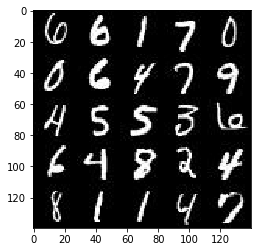

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

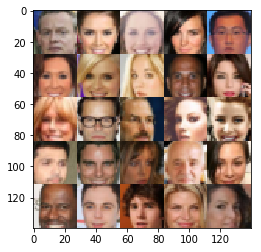

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name = 'inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name = 'inputs_z')
    learning_rate = tf.placeholder(tf.float32, shape=[], name='learning_rate')
    return (inputs_real, inputs_z, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [16]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, 0.9)
        
        x2 = tf.layers.conv2d(x1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha*x2, x2)
        x2 = tf.nn.dropout(x2, 0.9)
        
        x3 = tf.layers.conv2d(x2, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.nn.dropout(x3, 0.9)
        
        flat = tf.reshape(x3, (-1, 4*4*512))
        logits = tf.layers.dense(flat,1)
        output = tf.sigmoid(logits)
        
        return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.02
    with tf.variable_scope('generator', reuse=not is_train):
        
        x1 = tf.layers.dense(z, 3*3*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 3, 3, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 3x3x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 4, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 3x3x512 now
    
        x3 = tf.layers.conv2d_transpose(x2, 256, 4, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 6x6x256 now
        
        x4 = tf.layers.conv2d_transpose(x3, 128, 4, strides=2, padding='valid', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        # 14x14x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28x28xout_channel_dim now
        
        out = tf.tanh(logits)
            
        return out
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [13]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    return (d_loss, g_loss)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    #Gets weights and Bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    #optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list = d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list = g_vars)
    
    return (d_train_opt, g_train_opt)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #saver = tf.train.Saver()
    steps = 0
    print_every = 10
    losses = []
    show_every = 100
    
    #call the following functions
    #tf.reset_default_graph()
    
    image_width, image_height, image_channels = data_shape[1], data_shape[2], data_shape[3]
    input_real, input_z, learn_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    learn_rate = learning_rate
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
                
        
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                #x, y = batch_images[0], batch_images[1]
                steps += 1
                x = batch_images * 2 
                #sample random noise for G
                batch_z = np.random.uniform(-1,1, size=(batch_size, z_dim))
                
                
                #Run Optimizers
                
                _ = sess.run(d_train_opt, feed_dict={input_real:x, input_z:batch_z })
                _ = sess.run(g_train_opt, feed_dict={input_z:batch_z, input_real:x})
                
                if steps % print_every == 0:
                    
                    train_loss_d = d_loss.eval({input_z:batch_z, input_real:x})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % show_every == 0:
                        show_generator_output(sess, 30, input_z, data_shape[3], data_image_mode)
        
        #saver.save(sess, './checkpoints/generator.ckpt')
                
    #with open('samples.pkl', 'wb') as f:
    #    pkl.dump(samples, f)
    
               

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

In [12]:
#mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))


Epoch 1/2... Discriminator Loss: 0.9635... Generator Loss: 3.6498
Epoch 1/2... Discriminator Loss: 0.5217... Generator Loss: 20.1063
Epoch 1/2... Discriminator Loss: 0.6548... Generator Loss: 9.4283
Epoch 1/2... Discriminator Loss: 0.4768... Generator Loss: 8.6155
Epoch 1/2... Discriminator Loss: 0.4449... Generator Loss: 4.9399
Epoch 1/2... Discriminator Loss: 0.5481... Generator Loss: 2.8748
Epoch 1/2... Discriminator Loss: 1.2657... Generator Loss: 0.6428
Epoch 1/2... Discriminator Loss: 0.7982... Generator Loss: 1.2019
Epoch 1/2... Discriminator Loss: 0.7527... Generator Loss: 1.5727
Epoch 1/2... Discriminator Loss: 1.9749... Generator Loss: 9.2099


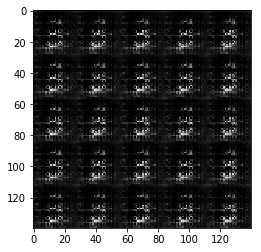

Epoch 1/2... Discriminator Loss: 1.0986... Generator Loss: 0.7366
Epoch 1/2... Discriminator Loss: 1.4111... Generator Loss: 0.5921
Epoch 1/2... Discriminator Loss: 0.6052... Generator Loss: 1.7844
Epoch 1/2... Discriminator Loss: 0.5040... Generator Loss: 3.5172
Epoch 1/2... Discriminator Loss: 1.6100... Generator Loss: 6.4231
Epoch 1/2... Discriminator Loss: 0.6951... Generator Loss: 5.6574
Epoch 1/2... Discriminator Loss: 0.5202... Generator Loss: 2.2714
Epoch 1/2... Discriminator Loss: 0.6363... Generator Loss: 2.2474
Epoch 1/2... Discriminator Loss: 0.6947... Generator Loss: 2.1586
Epoch 1/2... Discriminator Loss: 0.5368... Generator Loss: 2.6047


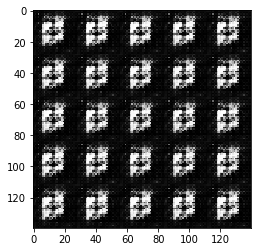

Epoch 1/2... Discriminator Loss: 0.9465... Generator Loss: 1.7292
Epoch 1/2... Discriminator Loss: 0.5365... Generator Loss: 2.1351
Epoch 1/2... Discriminator Loss: 0.5013... Generator Loss: 2.6990
Epoch 1/2... Discriminator Loss: 0.4289... Generator Loss: 2.9080
Epoch 1/2... Discriminator Loss: 0.4797... Generator Loss: 2.7048
Epoch 1/2... Discriminator Loss: 0.4439... Generator Loss: 3.3710
Epoch 1/2... Discriminator Loss: 0.9745... Generator Loss: 6.0512
Epoch 1/2... Discriminator Loss: 0.8508... Generator Loss: 1.6286
Epoch 1/2... Discriminator Loss: 0.4357... Generator Loss: 3.5043
Epoch 1/2... Discriminator Loss: 0.4631... Generator Loss: 3.0958


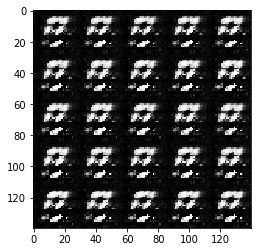

Epoch 1/2... Discriminator Loss: 0.8983... Generator Loss: 1.0744
Epoch 1/2... Discriminator Loss: 0.5621... Generator Loss: 2.4901
Epoch 1/2... Discriminator Loss: 0.4249... Generator Loss: 3.8130
Epoch 1/2... Discriminator Loss: 0.4731... Generator Loss: 3.0336
Epoch 1/2... Discriminator Loss: 0.5054... Generator Loss: 2.9996
Epoch 1/2... Discriminator Loss: 0.5362... Generator Loss: 2.5583
Epoch 1/2... Discriminator Loss: 0.3903... Generator Loss: 3.7372
Epoch 1/2... Discriminator Loss: 0.3980... Generator Loss: 3.7244
Epoch 1/2... Discriminator Loss: 0.9824... Generator Loss: 0.9194
Epoch 1/2... Discriminator Loss: 0.5577... Generator Loss: 2.0191


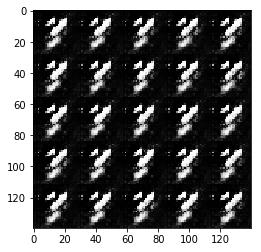

Epoch 1/2... Discriminator Loss: 0.4537... Generator Loss: 2.8516
Epoch 1/2... Discriminator Loss: 0.4133... Generator Loss: 3.4693
Epoch 1/2... Discriminator Loss: 0.3861... Generator Loss: 4.4860
Epoch 1/2... Discriminator Loss: 0.5343... Generator Loss: 2.9824
Epoch 1/2... Discriminator Loss: 0.5132... Generator Loss: 1.9875
Epoch 1/2... Discriminator Loss: 0.5556... Generator Loss: 2.1463
Epoch 1/2... Discriminator Loss: 0.5692... Generator Loss: 2.5607
Epoch 1/2... Discriminator Loss: 0.6134... Generator Loss: 2.6484
Epoch 1/2... Discriminator Loss: 1.9654... Generator Loss: 0.4522
Epoch 1/2... Discriminator Loss: 1.1358... Generator Loss: 1.0591


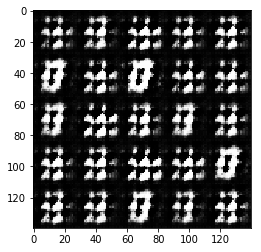

Epoch 1/2... Discriminator Loss: 0.7564... Generator Loss: 3.0406
Epoch 1/2... Discriminator Loss: 0.8227... Generator Loss: 2.2225
Epoch 1/2... Discriminator Loss: 0.6606... Generator Loss: 1.5589
Epoch 1/2... Discriminator Loss: 0.7769... Generator Loss: 1.1708
Epoch 1/2... Discriminator Loss: 0.6373... Generator Loss: 2.6831
Epoch 1/2... Discriminator Loss: 0.6072... Generator Loss: 2.8235
Epoch 1/2... Discriminator Loss: 0.6054... Generator Loss: 1.8907
Epoch 1/2... Discriminator Loss: 1.3844... Generator Loss: 0.6610
Epoch 1/2... Discriminator Loss: 0.7514... Generator Loss: 2.6048
Epoch 1/2... Discriminator Loss: 0.7569... Generator Loss: 2.2180


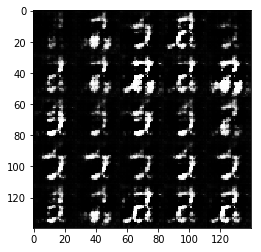

Epoch 1/2... Discriminator Loss: 1.0398... Generator Loss: 1.6095
Epoch 1/2... Discriminator Loss: 0.6509... Generator Loss: 4.2864
Epoch 1/2... Discriminator Loss: 0.6373... Generator Loss: 2.8519
Epoch 1/2... Discriminator Loss: 0.6644... Generator Loss: 3.4607
Epoch 1/2... Discriminator Loss: 0.7153... Generator Loss: 1.5747
Epoch 1/2... Discriminator Loss: 1.1908... Generator Loss: 0.9840
Epoch 1/2... Discriminator Loss: 0.7706... Generator Loss: 1.2833
Epoch 1/2... Discriminator Loss: 1.0095... Generator Loss: 0.9670
Epoch 1/2... Discriminator Loss: 0.6670... Generator Loss: 1.7868
Epoch 1/2... Discriminator Loss: 0.7626... Generator Loss: 2.1234


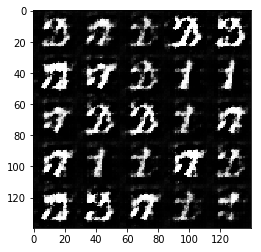

Epoch 1/2... Discriminator Loss: 0.6782... Generator Loss: 3.0555
Epoch 1/2... Discriminator Loss: 0.5905... Generator Loss: 1.7440
Epoch 1/2... Discriminator Loss: 0.6115... Generator Loss: 2.4786
Epoch 1/2... Discriminator Loss: 0.6459... Generator Loss: 1.5759
Epoch 1/2... Discriminator Loss: 1.0812... Generator Loss: 2.3290
Epoch 1/2... Discriminator Loss: 1.4981... Generator Loss: 0.4648
Epoch 1/2... Discriminator Loss: 0.6045... Generator Loss: 3.0000
Epoch 1/2... Discriminator Loss: 0.7667... Generator Loss: 1.8503
Epoch 1/2... Discriminator Loss: 0.6400... Generator Loss: 2.9494
Epoch 1/2... Discriminator Loss: 0.9095... Generator Loss: 0.9729


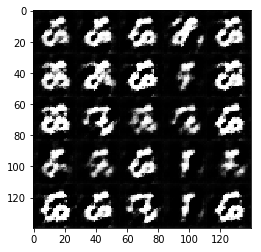

Epoch 1/2... Discriminator Loss: 0.9104... Generator Loss: 1.1843
Epoch 1/2... Discriminator Loss: 0.6367... Generator Loss: 2.3397
Epoch 1/2... Discriminator Loss: 0.9376... Generator Loss: 1.7711
Epoch 1/2... Discriminator Loss: 0.5926... Generator Loss: 1.8904
Epoch 1/2... Discriminator Loss: 0.6345... Generator Loss: 2.2013
Epoch 1/2... Discriminator Loss: 0.7274... Generator Loss: 1.5431
Epoch 1/2... Discriminator Loss: 0.6101... Generator Loss: 1.5580
Epoch 1/2... Discriminator Loss: 0.6639... Generator Loss: 1.9955
Epoch 1/2... Discriminator Loss: 0.6935... Generator Loss: 1.8835
Epoch 1/2... Discriminator Loss: 0.7991... Generator Loss: 2.1226


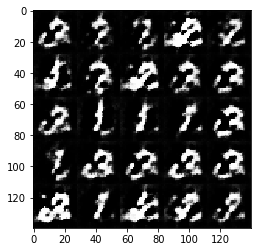

Epoch 1/2... Discriminator Loss: 0.6007... Generator Loss: 1.6896
Epoch 1/2... Discriminator Loss: 0.7093... Generator Loss: 3.3252
Epoch 1/2... Discriminator Loss: 0.6320... Generator Loss: 2.2625
Epoch 1/2... Discriminator Loss: 0.4921... Generator Loss: 3.1756
Epoch 1/2... Discriminator Loss: 0.8371... Generator Loss: 1.1063
Epoch 1/2... Discriminator Loss: 0.8391... Generator Loss: 2.2824
Epoch 1/2... Discriminator Loss: 0.7474... Generator Loss: 1.7215
Epoch 1/2... Discriminator Loss: 1.1669... Generator Loss: 1.9832
Epoch 1/2... Discriminator Loss: 0.6924... Generator Loss: 2.1769
Epoch 1/2... Discriminator Loss: 0.4698... Generator Loss: 3.3962


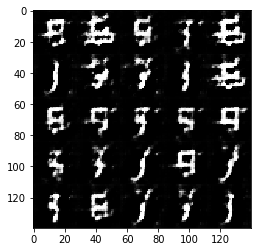

Epoch 1/2... Discriminator Loss: 0.4865... Generator Loss: 2.2820
Epoch 1/2... Discriminator Loss: 1.8708... Generator Loss: 0.4640
Epoch 1/2... Discriminator Loss: 0.5997... Generator Loss: 2.2510
Epoch 1/2... Discriminator Loss: 0.6011... Generator Loss: 3.2671
Epoch 1/2... Discriminator Loss: 1.1429... Generator Loss: 0.7412
Epoch 1/2... Discriminator Loss: 0.8053... Generator Loss: 1.7408
Epoch 1/2... Discriminator Loss: 1.6903... Generator Loss: 0.6320
Epoch 1/2... Discriminator Loss: 1.0120... Generator Loss: 2.0080
Epoch 1/2... Discriminator Loss: 0.7973... Generator Loss: 1.4734
Epoch 1/2... Discriminator Loss: 1.0205... Generator Loss: 2.9524


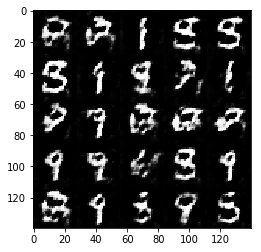

Epoch 1/2... Discriminator Loss: 0.7914... Generator Loss: 1.6714
Epoch 1/2... Discriminator Loss: 0.7801... Generator Loss: 1.9127
Epoch 1/2... Discriminator Loss: 1.2641... Generator Loss: 1.0741
Epoch 1/2... Discriminator Loss: 1.1394... Generator Loss: 1.1974
Epoch 1/2... Discriminator Loss: 1.3273... Generator Loss: 2.2017
Epoch 1/2... Discriminator Loss: 1.3302... Generator Loss: 0.6974
Epoch 1/2... Discriminator Loss: 1.1627... Generator Loss: 0.7801
Epoch 1/2... Discriminator Loss: 0.8303... Generator Loss: 1.5637
Epoch 1/2... Discriminator Loss: 0.7498... Generator Loss: 1.8561
Epoch 1/2... Discriminator Loss: 1.4033... Generator Loss: 0.5458


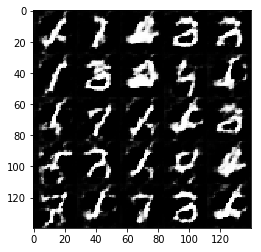

Epoch 1/2... Discriminator Loss: 1.2102... Generator Loss: 1.1223
Epoch 1/2... Discriminator Loss: 1.0477... Generator Loss: 0.9778
Epoch 1/2... Discriminator Loss: 0.7989... Generator Loss: 2.0703
Epoch 1/2... Discriminator Loss: 2.0409... Generator Loss: 0.3118
Epoch 1/2... Discriminator Loss: 0.6637... Generator Loss: 2.2376
Epoch 1/2... Discriminator Loss: 1.1790... Generator Loss: 0.8139
Epoch 1/2... Discriminator Loss: 0.9646... Generator Loss: 1.1598
Epoch 1/2... Discriminator Loss: 0.9898... Generator Loss: 1.1871
Epoch 1/2... Discriminator Loss: 0.7885... Generator Loss: 1.7303
Epoch 1/2... Discriminator Loss: 0.7643... Generator Loss: 1.8305


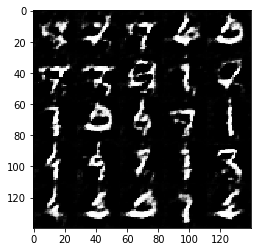

Epoch 1/2... Discriminator Loss: 1.3013... Generator Loss: 0.9596
Epoch 1/2... Discriminator Loss: 0.8222... Generator Loss: 1.6998
Epoch 1/2... Discriminator Loss: 0.7827... Generator Loss: 2.8701
Epoch 1/2... Discriminator Loss: 0.9402... Generator Loss: 1.0044
Epoch 1/2... Discriminator Loss: 0.9760... Generator Loss: 1.4791
Epoch 1/2... Discriminator Loss: 0.8149... Generator Loss: 1.2885
Epoch 1/2... Discriminator Loss: 1.2300... Generator Loss: 0.6709
Epoch 1/2... Discriminator Loss: 1.0364... Generator Loss: 1.8960
Epoch 1/2... Discriminator Loss: 1.6889... Generator Loss: 3.6762
Epoch 1/2... Discriminator Loss: 0.9551... Generator Loss: 1.1646


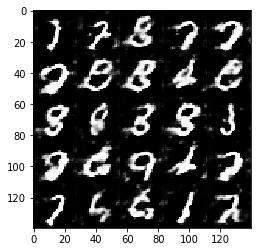

Epoch 1/2... Discriminator Loss: 0.9270... Generator Loss: 1.3480
Epoch 1/2... Discriminator Loss: 0.7072... Generator Loss: 1.8823
Epoch 1/2... Discriminator Loss: 0.9573... Generator Loss: 1.0426
Epoch 1/2... Discriminator Loss: 1.2716... Generator Loss: 0.8824
Epoch 1/2... Discriminator Loss: 1.2086... Generator Loss: 0.7691
Epoch 1/2... Discriminator Loss: 1.5657... Generator Loss: 0.4545
Epoch 1/2... Discriminator Loss: 0.8595... Generator Loss: 1.1259
Epoch 1/2... Discriminator Loss: 0.7256... Generator Loss: 1.8108
Epoch 1/2... Discriminator Loss: 1.1910... Generator Loss: 0.8710
Epoch 1/2... Discriminator Loss: 0.8434... Generator Loss: 1.4718


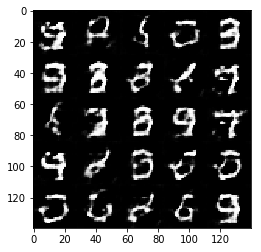

Epoch 1/2... Discriminator Loss: 1.2748... Generator Loss: 1.6438
Epoch 1/2... Discriminator Loss: 1.0800... Generator Loss: 0.8478
Epoch 1/2... Discriminator Loss: 0.8285... Generator Loss: 1.8912
Epoch 1/2... Discriminator Loss: 1.1563... Generator Loss: 0.9236
Epoch 1/2... Discriminator Loss: 0.8491... Generator Loss: 1.1612
Epoch 1/2... Discriminator Loss: 0.8717... Generator Loss: 1.5049
Epoch 1/2... Discriminator Loss: 1.0989... Generator Loss: 1.8098
Epoch 1/2... Discriminator Loss: 0.9755... Generator Loss: 1.6244
Epoch 1/2... Discriminator Loss: 1.3799... Generator Loss: 0.9264
Epoch 1/2... Discriminator Loss: 1.1574... Generator Loss: 0.7328


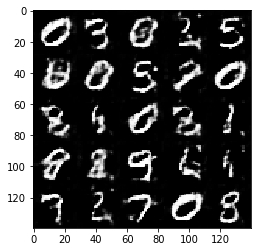

Epoch 1/2... Discriminator Loss: 1.2470... Generator Loss: 0.6907
Epoch 1/2... Discriminator Loss: 1.0512... Generator Loss: 2.8297
Epoch 1/2... Discriminator Loss: 0.9518... Generator Loss: 0.9606
Epoch 1/2... Discriminator Loss: 1.0519... Generator Loss: 1.1663
Epoch 1/2... Discriminator Loss: 1.0019... Generator Loss: 1.5041
Epoch 1/2... Discriminator Loss: 1.8246... Generator Loss: 0.2933
Epoch 1/2... Discriminator Loss: 0.8348... Generator Loss: 1.3759
Epoch 1/2... Discriminator Loss: 1.0131... Generator Loss: 0.8339
Epoch 1/2... Discriminator Loss: 1.0397... Generator Loss: 0.9993
Epoch 1/2... Discriminator Loss: 1.4117... Generator Loss: 0.7307


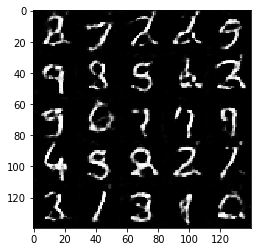

Epoch 1/2... Discriminator Loss: 1.2132... Generator Loss: 1.2331
Epoch 1/2... Discriminator Loss: 0.9271... Generator Loss: 1.0907
Epoch 1/2... Discriminator Loss: 1.4292... Generator Loss: 0.6665
Epoch 1/2... Discriminator Loss: 0.9776... Generator Loss: 1.3094
Epoch 1/2... Discriminator Loss: 1.0730... Generator Loss: 1.8080
Epoch 1/2... Discriminator Loss: 1.0865... Generator Loss: 0.9027
Epoch 1/2... Discriminator Loss: 0.9580... Generator Loss: 2.8343
Epoch 1/2... Discriminator Loss: 1.0299... Generator Loss: 1.3137
Epoch 1/2... Discriminator Loss: 1.0174... Generator Loss: 1.8192
Epoch 1/2... Discriminator Loss: 1.2066... Generator Loss: 0.6431


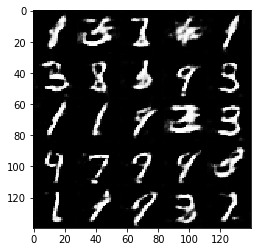

Epoch 1/2... Discriminator Loss: 1.0172... Generator Loss: 1.4473
Epoch 1/2... Discriminator Loss: 1.1286... Generator Loss: 0.8772
Epoch 1/2... Discriminator Loss: 1.3320... Generator Loss: 1.2360
Epoch 1/2... Discriminator Loss: 1.5481... Generator Loss: 0.4512
Epoch 1/2... Discriminator Loss: 1.7476... Generator Loss: 0.5539
Epoch 1/2... Discriminator Loss: 0.9182... Generator Loss: 1.3435
Epoch 1/2... Discriminator Loss: 0.8708... Generator Loss: 1.5064
Epoch 1/2... Discriminator Loss: 1.0306... Generator Loss: 1.1918
Epoch 1/2... Discriminator Loss: 1.8784... Generator Loss: 0.3727
Epoch 1/2... Discriminator Loss: 1.1662... Generator Loss: 0.9265


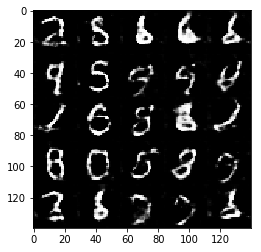

Epoch 1/2... Discriminator Loss: 0.8444... Generator Loss: 1.0293
Epoch 1/2... Discriminator Loss: 0.9242... Generator Loss: 1.3728
Epoch 1/2... Discriminator Loss: 1.0770... Generator Loss: 1.6162
Epoch 1/2... Discriminator Loss: 1.0273... Generator Loss: 1.0747
Epoch 1/2... Discriminator Loss: 0.9259... Generator Loss: 1.4762
Epoch 1/2... Discriminator Loss: 0.9691... Generator Loss: 1.3891
Epoch 1/2... Discriminator Loss: 1.2543... Generator Loss: 0.7535
Epoch 1/2... Discriminator Loss: 0.8217... Generator Loss: 1.4663
Epoch 1/2... Discriminator Loss: 1.0549... Generator Loss: 1.0742
Epoch 1/2... Discriminator Loss: 0.7029... Generator Loss: 1.3693


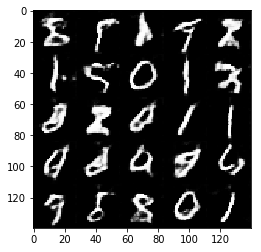

Epoch 1/2... Discriminator Loss: 1.5087... Generator Loss: 0.5353
Epoch 1/2... Discriminator Loss: 1.2467... Generator Loss: 0.7089
Epoch 1/2... Discriminator Loss: 1.0312... Generator Loss: 0.9290
Epoch 1/2... Discriminator Loss: 0.9164... Generator Loss: 1.2017
Epoch 1/2... Discriminator Loss: 1.3200... Generator Loss: 1.6594
Epoch 1/2... Discriminator Loss: 1.1211... Generator Loss: 1.1424
Epoch 1/2... Discriminator Loss: 1.1159... Generator Loss: 0.8393
Epoch 1/2... Discriminator Loss: 1.0498... Generator Loss: 1.4661
Epoch 1/2... Discriminator Loss: 0.7739... Generator Loss: 1.5581
Epoch 1/2... Discriminator Loss: 1.4120... Generator Loss: 0.8591


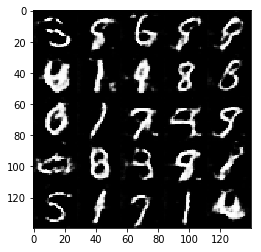

Epoch 1/2... Discriminator Loss: 1.3092... Generator Loss: 0.6161
Epoch 1/2... Discriminator Loss: 1.0387... Generator Loss: 2.1905
Epoch 1/2... Discriminator Loss: 1.6025... Generator Loss: 0.3839
Epoch 1/2... Discriminator Loss: 0.8772... Generator Loss: 1.7675
Epoch 1/2... Discriminator Loss: 1.2216... Generator Loss: 0.8449
Epoch 1/2... Discriminator Loss: 1.1025... Generator Loss: 0.8877
Epoch 1/2... Discriminator Loss: 1.4138... Generator Loss: 0.6355
Epoch 1/2... Discriminator Loss: 1.7601... Generator Loss: 0.3516
Epoch 1/2... Discriminator Loss: 1.0534... Generator Loss: 0.8129
Epoch 1/2... Discriminator Loss: 0.8837... Generator Loss: 1.4221


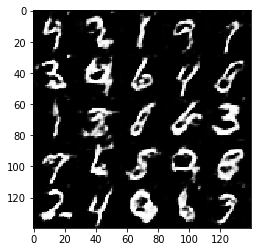

Epoch 1/2... Discriminator Loss: 0.8550... Generator Loss: 1.4210
Epoch 1/2... Discriminator Loss: 1.1120... Generator Loss: 0.8661
Epoch 1/2... Discriminator Loss: 0.8305... Generator Loss: 1.1634
Epoch 1/2... Discriminator Loss: 1.2738... Generator Loss: 0.7425
Epoch 1/2... Discriminator Loss: 1.0515... Generator Loss: 1.8668
Epoch 1/2... Discriminator Loss: 0.9321... Generator Loss: 1.8224
Epoch 1/2... Discriminator Loss: 1.1931... Generator Loss: 1.6136
Epoch 1/2... Discriminator Loss: 1.0837... Generator Loss: 1.6093
Epoch 1/2... Discriminator Loss: 1.4367... Generator Loss: 0.5483
Epoch 1/2... Discriminator Loss: 1.0888... Generator Loss: 1.2797


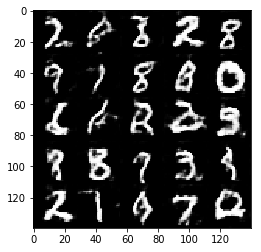

Epoch 1/2... Discriminator Loss: 1.5106... Generator Loss: 0.3968
Epoch 1/2... Discriminator Loss: 1.1937... Generator Loss: 0.8712
Epoch 1/2... Discriminator Loss: 1.1790... Generator Loss: 0.6761
Epoch 1/2... Discriminator Loss: 0.9888... Generator Loss: 1.6873
Epoch 1/2... Discriminator Loss: 1.2919... Generator Loss: 0.7921
Epoch 1/2... Discriminator Loss: 1.0755... Generator Loss: 1.3801
Epoch 1/2... Discriminator Loss: 1.1918... Generator Loss: 1.2367
Epoch 1/2... Discriminator Loss: 1.3424... Generator Loss: 0.7855
Epoch 1/2... Discriminator Loss: 1.5465... Generator Loss: 0.4594
Epoch 1/2... Discriminator Loss: 1.0410... Generator Loss: 1.1475


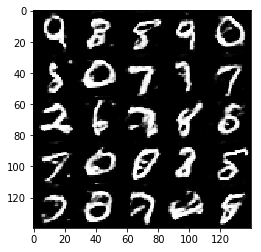

Epoch 1/2... Discriminator Loss: 1.0867... Generator Loss: 1.1151
Epoch 1/2... Discriminator Loss: 1.3511... Generator Loss: 0.6573
Epoch 1/2... Discriminator Loss: 1.3233... Generator Loss: 0.7061
Epoch 1/2... Discriminator Loss: 1.3755... Generator Loss: 1.5872
Epoch 1/2... Discriminator Loss: 1.1146... Generator Loss: 0.7788
Epoch 1/2... Discriminator Loss: 1.4163... Generator Loss: 0.6638
Epoch 1/2... Discriminator Loss: 0.9438... Generator Loss: 1.1962
Epoch 1/2... Discriminator Loss: 1.2425... Generator Loss: 0.9068
Epoch 1/2... Discriminator Loss: 1.2649... Generator Loss: 0.8243
Epoch 1/2... Discriminator Loss: 0.8716... Generator Loss: 1.5327


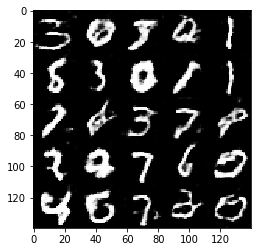

Epoch 1/2... Discriminator Loss: 1.3570... Generator Loss: 0.7409
Epoch 1/2... Discriminator Loss: 1.5093... Generator Loss: 0.4860
Epoch 1/2... Discriminator Loss: 1.4102... Generator Loss: 0.7977
Epoch 1/2... Discriminator Loss: 1.1264... Generator Loss: 0.8729
Epoch 1/2... Discriminator Loss: 1.0267... Generator Loss: 1.0309
Epoch 1/2... Discriminator Loss: 1.4157... Generator Loss: 0.5687
Epoch 1/2... Discriminator Loss: 1.4037... Generator Loss: 0.6874
Epoch 1/2... Discriminator Loss: 1.0575... Generator Loss: 1.2392
Epoch 1/2... Discriminator Loss: 0.9731... Generator Loss: 1.6261
Epoch 1/2... Discriminator Loss: 1.1555... Generator Loss: 1.2481


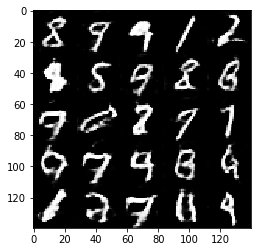

Epoch 1/2... Discriminator Loss: 1.0225... Generator Loss: 1.2292
Epoch 1/2... Discriminator Loss: 1.2017... Generator Loss: 1.3806
Epoch 1/2... Discriminator Loss: 1.6401... Generator Loss: 0.3327
Epoch 1/2... Discriminator Loss: 1.2372... Generator Loss: 0.9587
Epoch 1/2... Discriminator Loss: 1.0590... Generator Loss: 1.0923
Epoch 1/2... Discriminator Loss: 1.2964... Generator Loss: 0.9810
Epoch 1/2... Discriminator Loss: 1.3043... Generator Loss: 0.5183
Epoch 1/2... Discriminator Loss: 1.1997... Generator Loss: 1.1251
Epoch 1/2... Discriminator Loss: 1.2637... Generator Loss: 0.7440
Epoch 1/2... Discriminator Loss: 1.1117... Generator Loss: 1.0728


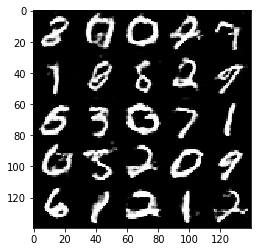

Epoch 1/2... Discriminator Loss: 1.1240... Generator Loss: 1.0050
Epoch 1/2... Discriminator Loss: 1.0621... Generator Loss: 1.2430
Epoch 1/2... Discriminator Loss: 1.0803... Generator Loss: 1.3361
Epoch 1/2... Discriminator Loss: 1.2328... Generator Loss: 0.7598
Epoch 1/2... Discriminator Loss: 1.3826... Generator Loss: 0.6526
Epoch 1/2... Discriminator Loss: 1.0635... Generator Loss: 0.9075
Epoch 1/2... Discriminator Loss: 1.1342... Generator Loss: 0.8050
Epoch 1/2... Discriminator Loss: 1.4574... Generator Loss: 0.5738
Epoch 1/2... Discriminator Loss: 1.4831... Generator Loss: 0.8706
Epoch 1/2... Discriminator Loss: 0.9513... Generator Loss: 1.5782


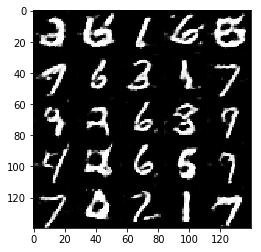

Epoch 1/2... Discriminator Loss: 1.1706... Generator Loss: 0.8071
Epoch 1/2... Discriminator Loss: 1.3178... Generator Loss: 0.9132
Epoch 1/2... Discriminator Loss: 1.2296... Generator Loss: 1.0983
Epoch 1/2... Discriminator Loss: 1.1213... Generator Loss: 1.0730
Epoch 1/2... Discriminator Loss: 1.6859... Generator Loss: 0.3940
Epoch 1/2... Discriminator Loss: 1.2331... Generator Loss: 0.5651
Epoch 1/2... Discriminator Loss: 1.5836... Generator Loss: 0.5258
Epoch 1/2... Discriminator Loss: 1.0455... Generator Loss: 0.9464
Epoch 1/2... Discriminator Loss: 1.3188... Generator Loss: 0.5692
Epoch 1/2... Discriminator Loss: 0.9619... Generator Loss: 1.2938


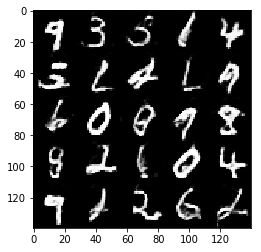

Epoch 1/2... Discriminator Loss: 1.3847... Generator Loss: 0.7039
Epoch 1/2... Discriminator Loss: 1.4970... Generator Loss: 0.4707
Epoch 1/2... Discriminator Loss: 1.4280... Generator Loss: 0.5779
Epoch 1/2... Discriminator Loss: 1.5156... Generator Loss: 0.4560
Epoch 1/2... Discriminator Loss: 1.2103... Generator Loss: 0.8690
Epoch 1/2... Discriminator Loss: 0.8453... Generator Loss: 1.6335
Epoch 1/2... Discriminator Loss: 1.1448... Generator Loss: 0.8218
Epoch 1/2... Discriminator Loss: 1.1662... Generator Loss: 1.0785
Epoch 1/2... Discriminator Loss: 1.2294... Generator Loss: 0.7364
Epoch 1/2... Discriminator Loss: 1.0016... Generator Loss: 0.9944


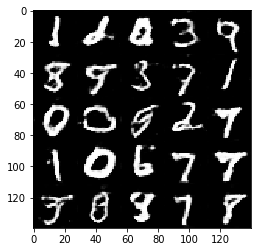

Epoch 1/2... Discriminator Loss: 1.1934... Generator Loss: 0.8008
Epoch 1/2... Discriminator Loss: 1.5607... Generator Loss: 0.4671
Epoch 1/2... Discriminator Loss: 1.3040... Generator Loss: 0.6185
Epoch 1/2... Discriminator Loss: 1.3514... Generator Loss: 1.0586
Epoch 1/2... Discriminator Loss: 1.4541... Generator Loss: 0.5832
Epoch 1/2... Discriminator Loss: 1.2004... Generator Loss: 0.5520
Epoch 1/2... Discriminator Loss: 1.3366... Generator Loss: 0.5621
Epoch 1/2... Discriminator Loss: 2.6781... Generator Loss: 3.8824
Epoch 1/2... Discriminator Loss: 1.1581... Generator Loss: 1.0996
Epoch 1/2... Discriminator Loss: 1.0204... Generator Loss: 0.9446


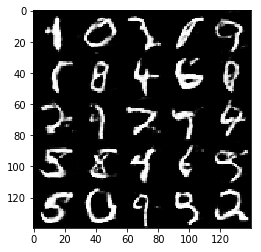

Epoch 1/2... Discriminator Loss: 1.1235... Generator Loss: 0.9448
Epoch 1/2... Discriminator Loss: 1.0291... Generator Loss: 1.0683
Epoch 1/2... Discriminator Loss: 0.9608... Generator Loss: 1.2029
Epoch 1/2... Discriminator Loss: 0.8517... Generator Loss: 1.3458
Epoch 1/2... Discriminator Loss: 1.2809... Generator Loss: 0.6588
Epoch 1/2... Discriminator Loss: 0.9976... Generator Loss: 1.1138
Epoch 1/2... Discriminator Loss: 1.3727... Generator Loss: 0.4891
Epoch 1/2... Discriminator Loss: 1.1846... Generator Loss: 0.7720
Epoch 1/2... Discriminator Loss: 1.1621... Generator Loss: 0.7664
Epoch 1/2... Discriminator Loss: 1.2524... Generator Loss: 0.8373


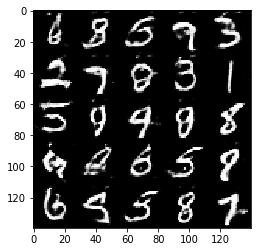

Epoch 1/2... Discriminator Loss: 1.2054... Generator Loss: 0.8407
Epoch 1/2... Discriminator Loss: 1.2221... Generator Loss: 1.0203
Epoch 1/2... Discriminator Loss: 1.4587... Generator Loss: 0.4141
Epoch 1/2... Discriminator Loss: 1.1464... Generator Loss: 1.2911
Epoch 1/2... Discriminator Loss: 1.2568... Generator Loss: 0.7417
Epoch 1/2... Discriminator Loss: 1.3523... Generator Loss: 0.6646
Epoch 1/2... Discriminator Loss: 1.1778... Generator Loss: 1.9966
Epoch 1/2... Discriminator Loss: 0.8559... Generator Loss: 1.0051
Epoch 1/2... Discriminator Loss: 1.1412... Generator Loss: 0.8234
Epoch 1/2... Discriminator Loss: 1.0160... Generator Loss: 0.9013


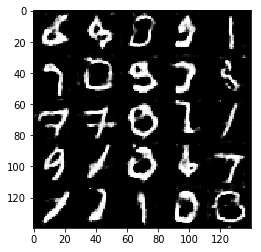

Epoch 1/2... Discriminator Loss: 1.1928... Generator Loss: 0.9844
Epoch 1/2... Discriminator Loss: 1.0682... Generator Loss: 1.4639
Epoch 1/2... Discriminator Loss: 1.3206... Generator Loss: 0.5502
Epoch 1/2... Discriminator Loss: 1.9734... Generator Loss: 0.2181
Epoch 1/2... Discriminator Loss: 1.1327... Generator Loss: 1.4135
Epoch 1/2... Discriminator Loss: 1.1950... Generator Loss: 0.8049
Epoch 1/2... Discriminator Loss: 1.1502... Generator Loss: 1.0308
Epoch 1/2... Discriminator Loss: 1.2873... Generator Loss: 0.7200
Epoch 1/2... Discriminator Loss: 1.4679... Generator Loss: 0.5343
Epoch 1/2... Discriminator Loss: 1.1917... Generator Loss: 0.6731


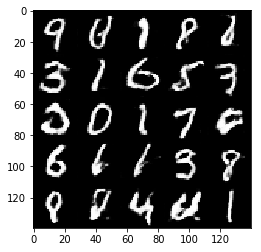

Epoch 1/2... Discriminator Loss: 1.2715... Generator Loss: 1.0328
Epoch 1/2... Discriminator Loss: 1.4088... Generator Loss: 0.5458
Epoch 1/2... Discriminator Loss: 1.0618... Generator Loss: 1.0841
Epoch 1/2... Discriminator Loss: 0.9553... Generator Loss: 0.9759
Epoch 1/2... Discriminator Loss: 1.2483... Generator Loss: 0.7737
Epoch 1/2... Discriminator Loss: 1.1964... Generator Loss: 1.3164
Epoch 1/2... Discriminator Loss: 0.9339... Generator Loss: 1.1994
Epoch 1/2... Discriminator Loss: 1.2785... Generator Loss: 0.5964
Epoch 1/2... Discriminator Loss: 1.0143... Generator Loss: 1.2751
Epoch 1/2... Discriminator Loss: 1.3441... Generator Loss: 0.7056


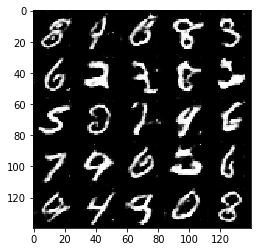

Epoch 1/2... Discriminator Loss: 1.0042... Generator Loss: 1.3977
Epoch 1/2... Discriminator Loss: 1.0728... Generator Loss: 0.9394
Epoch 1/2... Discriminator Loss: 1.4469... Generator Loss: 0.7349
Epoch 1/2... Discriminator Loss: 0.9612... Generator Loss: 1.1051
Epoch 1/2... Discriminator Loss: 1.0269... Generator Loss: 1.6007
Epoch 1/2... Discriminator Loss: 1.2672... Generator Loss: 0.7654
Epoch 1/2... Discriminator Loss: 1.6186... Generator Loss: 0.3860
Epoch 1/2... Discriminator Loss: 1.0056... Generator Loss: 1.5291
Epoch 1/2... Discriminator Loss: 0.8738... Generator Loss: 1.8167
Epoch 1/2... Discriminator Loss: 1.3320... Generator Loss: 0.6390


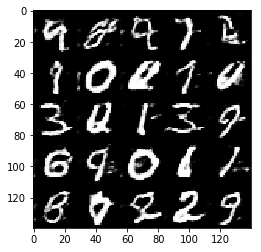

Epoch 1/2... Discriminator Loss: 1.2332... Generator Loss: 1.1198
Epoch 1/2... Discriminator Loss: 2.0300... Generator Loss: 0.2833
Epoch 1/2... Discriminator Loss: 1.0306... Generator Loss: 1.4383
Epoch 1/2... Discriminator Loss: 1.7277... Generator Loss: 0.2996
Epoch 1/2... Discriminator Loss: 1.5757... Generator Loss: 0.4006
Epoch 1/2... Discriminator Loss: 1.4363... Generator Loss: 0.5928
Epoch 1/2... Discriminator Loss: 1.1597... Generator Loss: 1.0144
Epoch 1/2... Discriminator Loss: 1.0649... Generator Loss: 1.5030
Epoch 1/2... Discriminator Loss: 1.2725... Generator Loss: 0.6374
Epoch 1/2... Discriminator Loss: 1.2445... Generator Loss: 1.0108


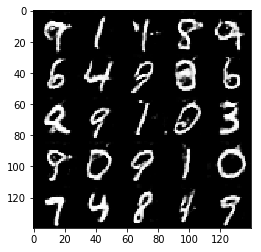

Epoch 1/2... Discriminator Loss: 1.3562... Generator Loss: 1.9359
Epoch 1/2... Discriminator Loss: 0.8979... Generator Loss: 1.1347
Epoch 1/2... Discriminator Loss: 1.5804... Generator Loss: 0.3242
Epoch 1/2... Discriminator Loss: 1.3658... Generator Loss: 0.7230
Epoch 1/2... Discriminator Loss: 1.1085... Generator Loss: 0.8730
Epoch 2/2... Discriminator Loss: 1.3070... Generator Loss: 0.6684
Epoch 2/2... Discriminator Loss: 2.5819... Generator Loss: 0.1707
Epoch 2/2... Discriminator Loss: 1.4358... Generator Loss: 0.6124
Epoch 2/2... Discriminator Loss: 1.1636... Generator Loss: 1.1442
Epoch 2/2... Discriminator Loss: 1.2604... Generator Loss: 0.8437


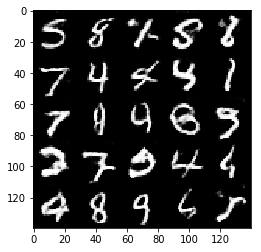

Epoch 2/2... Discriminator Loss: 1.2466... Generator Loss: 0.8031
Epoch 2/2... Discriminator Loss: 1.3918... Generator Loss: 0.5855
Epoch 2/2... Discriminator Loss: 1.0156... Generator Loss: 1.2513
Epoch 2/2... Discriminator Loss: 1.2188... Generator Loss: 1.7216
Epoch 2/2... Discriminator Loss: 1.4533... Generator Loss: 0.5057
Epoch 2/2... Discriminator Loss: 1.2977... Generator Loss: 0.5398
Epoch 2/2... Discriminator Loss: 1.0730... Generator Loss: 1.7843
Epoch 2/2... Discriminator Loss: 1.2083... Generator Loss: 1.9847
Epoch 2/2... Discriminator Loss: 1.2158... Generator Loss: 1.4483
Epoch 2/2... Discriminator Loss: 0.8688... Generator Loss: 1.0038


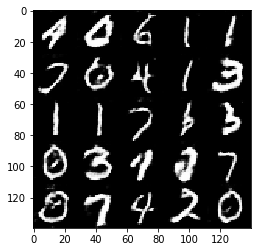

Epoch 2/2... Discriminator Loss: 1.1568... Generator Loss: 0.5467
Epoch 2/2... Discriminator Loss: 1.2498... Generator Loss: 0.9273
Epoch 2/2... Discriminator Loss: 1.2903... Generator Loss: 0.5702
Epoch 2/2... Discriminator Loss: 1.1366... Generator Loss: 1.5123
Epoch 2/2... Discriminator Loss: 1.2456... Generator Loss: 0.9125
Epoch 2/2... Discriminator Loss: 0.8824... Generator Loss: 0.8460
Epoch 2/2... Discriminator Loss: 1.6337... Generator Loss: 0.4375
Epoch 2/2... Discriminator Loss: 1.1008... Generator Loss: 0.9936
Epoch 2/2... Discriminator Loss: 0.9773... Generator Loss: 0.7692
Epoch 2/2... Discriminator Loss: 1.1347... Generator Loss: 0.9905


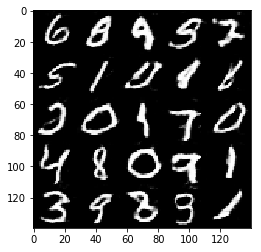

Epoch 2/2... Discriminator Loss: 1.2614... Generator Loss: 0.6194
Epoch 2/2... Discriminator Loss: 1.2939... Generator Loss: 1.4619
Epoch 2/2... Discriminator Loss: 1.5440... Generator Loss: 0.4211
Epoch 2/2... Discriminator Loss: 1.2759... Generator Loss: 0.8009
Epoch 2/2... Discriminator Loss: 1.1737... Generator Loss: 0.7989
Epoch 2/2... Discriminator Loss: 1.5660... Generator Loss: 0.6478
Epoch 2/2... Discriminator Loss: 1.2656... Generator Loss: 0.6027
Epoch 2/2... Discriminator Loss: 0.9227... Generator Loss: 1.5590
Epoch 2/2... Discriminator Loss: 1.0853... Generator Loss: 0.7573
Epoch 2/2... Discriminator Loss: 1.2362... Generator Loss: 0.9345


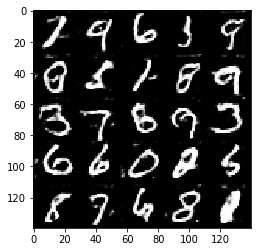

Epoch 2/2... Discriminator Loss: 1.0218... Generator Loss: 1.1596
Epoch 2/2... Discriminator Loss: 1.1704... Generator Loss: 0.7189
Epoch 2/2... Discriminator Loss: 1.2272... Generator Loss: 0.6003
Epoch 2/2... Discriminator Loss: 1.6025... Generator Loss: 0.5272
Epoch 2/2... Discriminator Loss: 0.9756... Generator Loss: 1.0840
Epoch 2/2... Discriminator Loss: 1.0951... Generator Loss: 1.0316
Epoch 2/2... Discriminator Loss: 1.1446... Generator Loss: 0.8683
Epoch 2/2... Discriminator Loss: 1.5035... Generator Loss: 0.4598
Epoch 2/2... Discriminator Loss: 1.7489... Generator Loss: 0.3549
Epoch 2/2... Discriminator Loss: 1.9762... Generator Loss: 0.2117


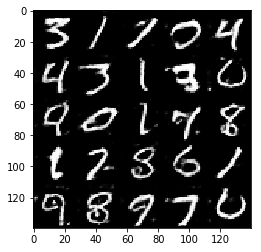

Epoch 2/2... Discriminator Loss: 1.1354... Generator Loss: 1.4219
Epoch 2/2... Discriminator Loss: 1.0520... Generator Loss: 0.8893
Epoch 2/2... Discriminator Loss: 1.7302... Generator Loss: 0.3987
Epoch 2/2... Discriminator Loss: 1.0772... Generator Loss: 1.0933
Epoch 2/2... Discriminator Loss: 1.3817... Generator Loss: 0.8034
Epoch 2/2... Discriminator Loss: 1.1691... Generator Loss: 0.5989
Epoch 2/2... Discriminator Loss: 1.1551... Generator Loss: 0.6634
Epoch 2/2... Discriminator Loss: 1.1323... Generator Loss: 1.3665
Epoch 2/2... Discriminator Loss: 1.3256... Generator Loss: 0.6501
Epoch 2/2... Discriminator Loss: 1.0227... Generator Loss: 0.9165


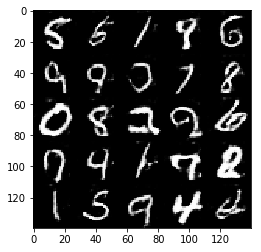

Epoch 2/2... Discriminator Loss: 1.1086... Generator Loss: 0.8958
Epoch 2/2... Discriminator Loss: 1.1009... Generator Loss: 1.0257
Epoch 2/2... Discriminator Loss: 0.7417... Generator Loss: 2.0937
Epoch 2/2... Discriminator Loss: 1.1225... Generator Loss: 1.0808
Epoch 2/2... Discriminator Loss: 1.0034... Generator Loss: 1.3493
Epoch 2/2... Discriminator Loss: 1.4356... Generator Loss: 0.6567
Epoch 2/2... Discriminator Loss: 0.9461... Generator Loss: 0.9633
Epoch 2/2... Discriminator Loss: 1.1353... Generator Loss: 0.9113
Epoch 2/2... Discriminator Loss: 1.1208... Generator Loss: 1.0008
Epoch 2/2... Discriminator Loss: 1.5541... Generator Loss: 0.4375


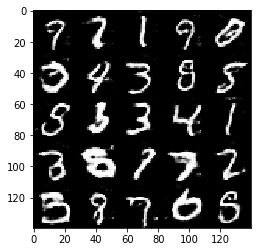

Epoch 2/2... Discriminator Loss: 1.5191... Generator Loss: 0.4425
Epoch 2/2... Discriminator Loss: 1.3301... Generator Loss: 0.7090
Epoch 2/2... Discriminator Loss: 1.0212... Generator Loss: 0.9239
Epoch 2/2... Discriminator Loss: 1.1849... Generator Loss: 0.8286
Epoch 2/2... Discriminator Loss: 0.8948... Generator Loss: 1.7327
Epoch 2/2... Discriminator Loss: 1.1298... Generator Loss: 1.8348
Epoch 2/2... Discriminator Loss: 1.1277... Generator Loss: 1.5177
Epoch 2/2... Discriminator Loss: 1.5368... Generator Loss: 0.4649
Epoch 2/2... Discriminator Loss: 1.1336... Generator Loss: 1.5602
Epoch 2/2... Discriminator Loss: 1.2737... Generator Loss: 0.7694


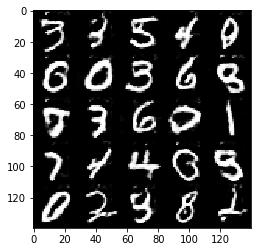

Epoch 2/2... Discriminator Loss: 0.9661... Generator Loss: 1.6695
Epoch 2/2... Discriminator Loss: 0.9088... Generator Loss: 1.0773
Epoch 2/2... Discriminator Loss: 1.5195... Generator Loss: 0.6592
Epoch 2/2... Discriminator Loss: 0.8992... Generator Loss: 1.4629
Epoch 2/2... Discriminator Loss: 1.1352... Generator Loss: 0.9382
Epoch 2/2... Discriminator Loss: 1.2055... Generator Loss: 0.7657
Epoch 2/2... Discriminator Loss: 0.8394... Generator Loss: 1.2879
Epoch 2/2... Discriminator Loss: 0.9930... Generator Loss: 1.2159
Epoch 2/2... Discriminator Loss: 1.3694... Generator Loss: 0.7177
Epoch 2/2... Discriminator Loss: 1.4018... Generator Loss: 1.1481


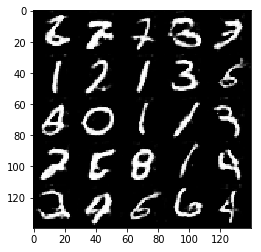

Epoch 2/2... Discriminator Loss: 1.7303... Generator Loss: 0.4523
Epoch 2/2... Discriminator Loss: 1.4093... Generator Loss: 0.8005
Epoch 2/2... Discriminator Loss: 0.9992... Generator Loss: 1.4101
Epoch 2/2... Discriminator Loss: 1.0511... Generator Loss: 1.4104
Epoch 2/2... Discriminator Loss: 1.1056... Generator Loss: 0.9385
Epoch 2/2... Discriminator Loss: 0.9707... Generator Loss: 1.3786
Epoch 2/2... Discriminator Loss: 0.9940... Generator Loss: 1.5802
Epoch 2/2... Discriminator Loss: 1.4618... Generator Loss: 0.4685
Epoch 2/2... Discriminator Loss: 1.1765... Generator Loss: 0.8171
Epoch 2/2... Discriminator Loss: 1.6723... Generator Loss: 0.5067


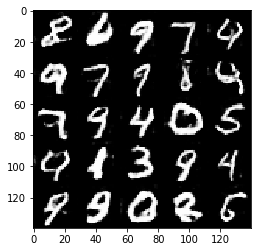

Epoch 2/2... Discriminator Loss: 1.1262... Generator Loss: 0.7504
Epoch 2/2... Discriminator Loss: 0.9258... Generator Loss: 0.9934
Epoch 2/2... Discriminator Loss: 0.8593... Generator Loss: 1.0371
Epoch 2/2... Discriminator Loss: 1.1537... Generator Loss: 0.7825
Epoch 2/2... Discriminator Loss: 1.0040... Generator Loss: 1.0784
Epoch 2/2... Discriminator Loss: 1.2757... Generator Loss: 0.8278
Epoch 2/2... Discriminator Loss: 0.8946... Generator Loss: 1.0036
Epoch 2/2... Discriminator Loss: 1.1034... Generator Loss: 0.7589
Epoch 2/2... Discriminator Loss: 0.7932... Generator Loss: 1.2470
Epoch 2/2... Discriminator Loss: 1.4374... Generator Loss: 0.7403


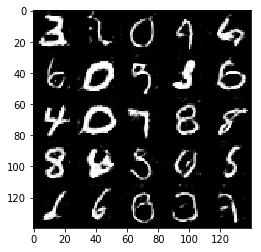

Epoch 2/2... Discriminator Loss: 1.4076... Generator Loss: 0.5543
Epoch 2/2... Discriminator Loss: 1.0185... Generator Loss: 1.1290
Epoch 2/2... Discriminator Loss: 1.2013... Generator Loss: 1.0853
Epoch 2/2... Discriminator Loss: 1.1952... Generator Loss: 1.0127
Epoch 2/2... Discriminator Loss: 1.3042... Generator Loss: 0.6417
Epoch 2/2... Discriminator Loss: 1.1600... Generator Loss: 0.7372
Epoch 2/2... Discriminator Loss: 0.9503... Generator Loss: 1.5556
Epoch 2/2... Discriminator Loss: 1.0783... Generator Loss: 1.4312
Epoch 2/2... Discriminator Loss: 1.3442... Generator Loss: 0.5963
Epoch 2/2... Discriminator Loss: 1.3367... Generator Loss: 1.0930


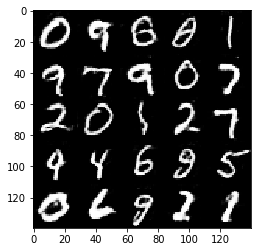

Epoch 2/2... Discriminator Loss: 0.8571... Generator Loss: 1.6207
Epoch 2/2... Discriminator Loss: 0.9712... Generator Loss: 0.7000
Epoch 2/2... Discriminator Loss: 1.1198... Generator Loss: 0.8246
Epoch 2/2... Discriminator Loss: 1.0845... Generator Loss: 1.8286
Epoch 2/2... Discriminator Loss: 1.6087... Generator Loss: 0.4443
Epoch 2/2... Discriminator Loss: 2.0313... Generator Loss: 0.3794
Epoch 2/2... Discriminator Loss: 1.0199... Generator Loss: 1.0199
Epoch 2/2... Discriminator Loss: 1.4256... Generator Loss: 0.5237
Epoch 2/2... Discriminator Loss: 1.2531... Generator Loss: 0.6994
Epoch 2/2... Discriminator Loss: 1.2936... Generator Loss: 0.7815


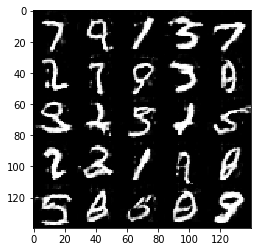

Epoch 2/2... Discriminator Loss: 0.9834... Generator Loss: 0.9506
Epoch 2/2... Discriminator Loss: 1.1805... Generator Loss: 0.7077
Epoch 2/2... Discriminator Loss: 0.9715... Generator Loss: 1.3537
Epoch 2/2... Discriminator Loss: 1.4838... Generator Loss: 1.4458
Epoch 2/2... Discriminator Loss: 0.9642... Generator Loss: 1.3391
Epoch 2/2... Discriminator Loss: 1.2605... Generator Loss: 1.9629
Epoch 2/2... Discriminator Loss: 1.2915... Generator Loss: 1.0312
Epoch 2/2... Discriminator Loss: 0.9842... Generator Loss: 0.9529
Epoch 2/2... Discriminator Loss: 1.2678... Generator Loss: 0.9701
Epoch 2/2... Discriminator Loss: 1.2519... Generator Loss: 0.8508


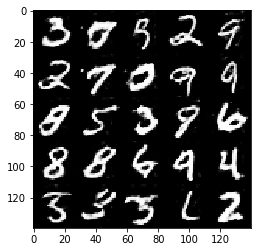

Epoch 2/2... Discriminator Loss: 1.1143... Generator Loss: 1.0849
Epoch 2/2... Discriminator Loss: 1.2874... Generator Loss: 0.4201
Epoch 2/2... Discriminator Loss: 1.5970... Generator Loss: 0.3687
Epoch 2/2... Discriminator Loss: 1.0332... Generator Loss: 1.2843
Epoch 2/2... Discriminator Loss: 1.3807... Generator Loss: 0.7004
Epoch 2/2... Discriminator Loss: 1.1008... Generator Loss: 1.0789
Epoch 2/2... Discriminator Loss: 1.3214... Generator Loss: 0.8677
Epoch 2/2... Discriminator Loss: 1.2477... Generator Loss: 0.5892
Epoch 2/2... Discriminator Loss: 1.0913... Generator Loss: 0.9314
Epoch 2/2... Discriminator Loss: 0.9450... Generator Loss: 1.8970


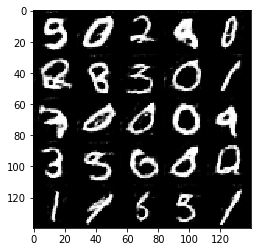

Epoch 2/2... Discriminator Loss: 1.4220... Generator Loss: 0.4552
Epoch 2/2... Discriminator Loss: 1.3142... Generator Loss: 0.7406
Epoch 2/2... Discriminator Loss: 1.1550... Generator Loss: 0.8049
Epoch 2/2... Discriminator Loss: 1.1822... Generator Loss: 1.1265
Epoch 2/2... Discriminator Loss: 1.0907... Generator Loss: 1.0106
Epoch 2/2... Discriminator Loss: 1.2678... Generator Loss: 0.6941
Epoch 2/2... Discriminator Loss: 1.0038... Generator Loss: 1.3717
Epoch 2/2... Discriminator Loss: 1.0181... Generator Loss: 1.1265
Epoch 2/2... Discriminator Loss: 1.9020... Generator Loss: 0.4234
Epoch 2/2... Discriminator Loss: 0.9525... Generator Loss: 0.9503


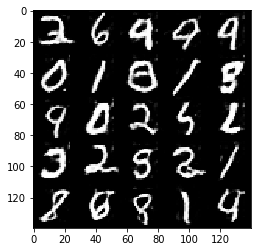

Epoch 2/2... Discriminator Loss: 1.8257... Generator Loss: 0.4227
Epoch 2/2... Discriminator Loss: 1.1482... Generator Loss: 0.7188
Epoch 2/2... Discriminator Loss: 1.7984... Generator Loss: 2.1791
Epoch 2/2... Discriminator Loss: 1.1784... Generator Loss: 0.9204
Epoch 2/2... Discriminator Loss: 1.2587... Generator Loss: 0.5964
Epoch 2/2... Discriminator Loss: 1.0282... Generator Loss: 1.0251
Epoch 2/2... Discriminator Loss: 1.4196... Generator Loss: 0.7478
Epoch 2/2... Discriminator Loss: 1.4114... Generator Loss: 0.6817
Epoch 2/2... Discriminator Loss: 1.5803... Generator Loss: 0.3784
Epoch 2/2... Discriminator Loss: 1.3584... Generator Loss: 0.6486


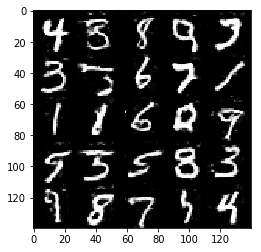

Epoch 2/2... Discriminator Loss: 1.1896... Generator Loss: 1.4690
Epoch 2/2... Discriminator Loss: 0.9738... Generator Loss: 1.1417
Epoch 2/2... Discriminator Loss: 1.3038... Generator Loss: 0.7046
Epoch 2/2... Discriminator Loss: 1.0751... Generator Loss: 0.9421
Epoch 2/2... Discriminator Loss: 0.9656... Generator Loss: 1.2105
Epoch 2/2... Discriminator Loss: 0.8921... Generator Loss: 1.5049
Epoch 2/2... Discriminator Loss: 1.4149... Generator Loss: 0.7982
Epoch 2/2... Discriminator Loss: 1.1831... Generator Loss: 0.6810
Epoch 2/2... Discriminator Loss: 1.1814... Generator Loss: 0.9029
Epoch 2/2... Discriminator Loss: 1.1255... Generator Loss: 0.6644


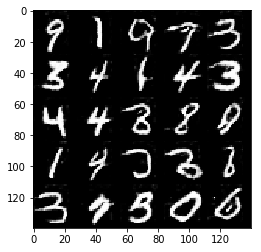

Epoch 2/2... Discriminator Loss: 1.2495... Generator Loss: 0.9219
Epoch 2/2... Discriminator Loss: 0.8653... Generator Loss: 1.5440
Epoch 2/2... Discriminator Loss: 1.0542... Generator Loss: 1.0300
Epoch 2/2... Discriminator Loss: 0.9009... Generator Loss: 0.9670
Epoch 2/2... Discriminator Loss: 1.2651... Generator Loss: 0.7587
Epoch 2/2... Discriminator Loss: 1.3641... Generator Loss: 0.6738
Epoch 2/2... Discriminator Loss: 0.9920... Generator Loss: 1.7025
Epoch 2/2... Discriminator Loss: 0.9951... Generator Loss: 0.8970
Epoch 2/2... Discriminator Loss: 1.0330... Generator Loss: 1.0317
Epoch 2/2... Discriminator Loss: 1.8103... Generator Loss: 0.2801


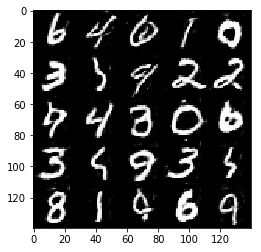

Epoch 2/2... Discriminator Loss: 1.1345... Generator Loss: 1.2449
Epoch 2/2... Discriminator Loss: 1.2715... Generator Loss: 0.9722
Epoch 2/2... Discriminator Loss: 1.2559... Generator Loss: 0.5778
Epoch 2/2... Discriminator Loss: 0.9014... Generator Loss: 1.4527
Epoch 2/2... Discriminator Loss: 1.0007... Generator Loss: 1.4234
Epoch 2/2... Discriminator Loss: 1.0674... Generator Loss: 0.8425
Epoch 2/2... Discriminator Loss: 1.1443... Generator Loss: 1.1056
Epoch 2/2... Discriminator Loss: 0.6964... Generator Loss: 1.3859
Epoch 2/2... Discriminator Loss: 1.0313... Generator Loss: 0.8052
Epoch 2/2... Discriminator Loss: 0.8235... Generator Loss: 1.1279


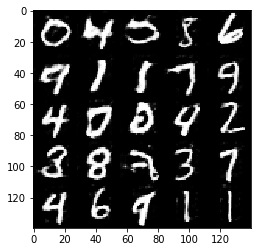

Epoch 2/2... Discriminator Loss: 1.3190... Generator Loss: 1.2682
Epoch 2/2... Discriminator Loss: 1.0187... Generator Loss: 0.7771
Epoch 2/2... Discriminator Loss: 0.9264... Generator Loss: 1.0842
Epoch 2/2... Discriminator Loss: 1.1513... Generator Loss: 0.6410
Epoch 2/2... Discriminator Loss: 1.3542... Generator Loss: 0.5209
Epoch 2/2... Discriminator Loss: 1.2019... Generator Loss: 0.5863
Epoch 2/2... Discriminator Loss: 0.9812... Generator Loss: 1.1394
Epoch 2/2... Discriminator Loss: 1.1236... Generator Loss: 1.2736
Epoch 2/2... Discriminator Loss: 1.1096... Generator Loss: 0.7125
Epoch 2/2... Discriminator Loss: 1.1384... Generator Loss: 0.8611


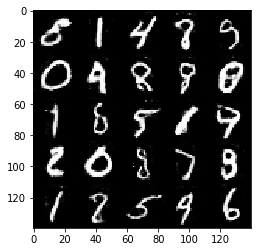

Epoch 2/2... Discriminator Loss: 0.9990... Generator Loss: 0.8062
Epoch 2/2... Discriminator Loss: 1.1651... Generator Loss: 0.6092
Epoch 2/2... Discriminator Loss: 1.4428... Generator Loss: 0.4306
Epoch 2/2... Discriminator Loss: 1.6998... Generator Loss: 0.4060
Epoch 2/2... Discriminator Loss: 1.0081... Generator Loss: 0.8796
Epoch 2/2... Discriminator Loss: 1.7289... Generator Loss: 0.2896
Epoch 2/2... Discriminator Loss: 1.1754... Generator Loss: 0.8095
Epoch 2/2... Discriminator Loss: 1.4332... Generator Loss: 0.4226
Epoch 2/2... Discriminator Loss: 0.9155... Generator Loss: 1.1023
Epoch 2/2... Discriminator Loss: 1.1202... Generator Loss: 0.9772


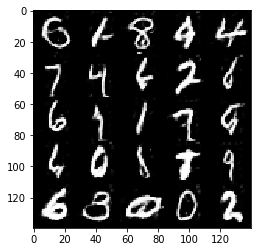

Epoch 2/2... Discriminator Loss: 1.2094... Generator Loss: 1.2922
Epoch 2/2... Discriminator Loss: 1.2561... Generator Loss: 0.5615
Epoch 2/2... Discriminator Loss: 1.1243... Generator Loss: 0.7828
Epoch 2/2... Discriminator Loss: 0.9258... Generator Loss: 1.1617
Epoch 2/2... Discriminator Loss: 1.0984... Generator Loss: 0.9243
Epoch 2/2... Discriminator Loss: 0.7596... Generator Loss: 1.2720
Epoch 2/2... Discriminator Loss: 0.8962... Generator Loss: 1.4054
Epoch 2/2... Discriminator Loss: 1.2064... Generator Loss: 1.0950
Epoch 2/2... Discriminator Loss: 1.1290... Generator Loss: 0.8259
Epoch 2/2... Discriminator Loss: 1.2953... Generator Loss: 1.3892


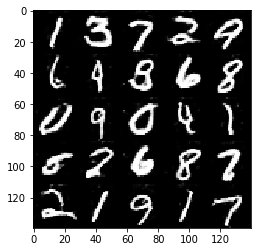

Epoch 2/2... Discriminator Loss: 0.9761... Generator Loss: 0.9848
Epoch 2/2... Discriminator Loss: 0.8232... Generator Loss: 1.3738
Epoch 2/2... Discriminator Loss: 1.0337... Generator Loss: 1.7874
Epoch 2/2... Discriminator Loss: 1.3118... Generator Loss: 0.8398
Epoch 2/2... Discriminator Loss: 1.2343... Generator Loss: 0.7396
Epoch 2/2... Discriminator Loss: 1.2227... Generator Loss: 0.7720
Epoch 2/2... Discriminator Loss: 1.0359... Generator Loss: 1.0952
Epoch 2/2... Discriminator Loss: 1.7418... Generator Loss: 2.5268
Epoch 2/2... Discriminator Loss: 1.5802... Generator Loss: 0.7684
Epoch 2/2... Discriminator Loss: 1.1269... Generator Loss: 1.5870


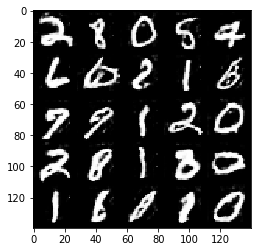

Epoch 2/2... Discriminator Loss: 1.1126... Generator Loss: 1.1667
Epoch 2/2... Discriminator Loss: 1.2341... Generator Loss: 0.9646
Epoch 2/2... Discriminator Loss: 1.3351... Generator Loss: 1.5722
Epoch 2/2... Discriminator Loss: 0.9617... Generator Loss: 0.9541
Epoch 2/2... Discriminator Loss: 1.0489... Generator Loss: 0.9342
Epoch 2/2... Discriminator Loss: 2.0483... Generator Loss: 0.1883
Epoch 2/2... Discriminator Loss: 1.2158... Generator Loss: 0.6186
Epoch 2/2... Discriminator Loss: 1.2993... Generator Loss: 0.9700
Epoch 2/2... Discriminator Loss: 1.4596... Generator Loss: 0.7162
Epoch 2/2... Discriminator Loss: 0.9288... Generator Loss: 1.2663


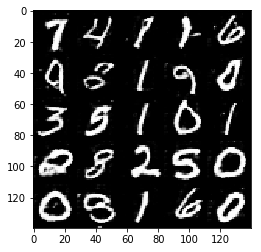

Epoch 2/2... Discriminator Loss: 1.1208... Generator Loss: 0.7397
Epoch 2/2... Discriminator Loss: 0.8504... Generator Loss: 1.3047
Epoch 2/2... Discriminator Loss: 1.6044... Generator Loss: 0.7522
Epoch 2/2... Discriminator Loss: 1.0818... Generator Loss: 0.9871
Epoch 2/2... Discriminator Loss: 0.9445... Generator Loss: 1.3192
Epoch 2/2... Discriminator Loss: 1.2517... Generator Loss: 0.8410
Epoch 2/2... Discriminator Loss: 0.8853... Generator Loss: 1.5857
Epoch 2/2... Discriminator Loss: 1.0686... Generator Loss: 1.1554
Epoch 2/2... Discriminator Loss: 1.2598... Generator Loss: 0.5331
Epoch 2/2... Discriminator Loss: 0.8422... Generator Loss: 1.7508


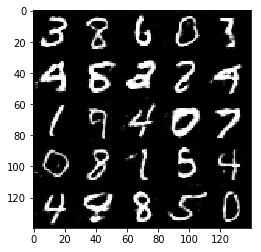

Epoch 2/2... Discriminator Loss: 1.5968... Generator Loss: 0.4415
Epoch 2/2... Discriminator Loss: 1.5406... Generator Loss: 1.3728
Epoch 2/2... Discriminator Loss: 1.4310... Generator Loss: 2.1370
Epoch 2/2... Discriminator Loss: 0.9204... Generator Loss: 1.0025
Epoch 2/2... Discriminator Loss: 1.1730... Generator Loss: 0.6693
Epoch 2/2... Discriminator Loss: 0.8081... Generator Loss: 1.3079
Epoch 2/2... Discriminator Loss: 0.9612... Generator Loss: 0.9663
Epoch 2/2... Discriminator Loss: 0.9220... Generator Loss: 0.5640
Epoch 2/2... Discriminator Loss: 0.9592... Generator Loss: 1.2337
Epoch 2/2... Discriminator Loss: 1.2718... Generator Loss: 1.4335


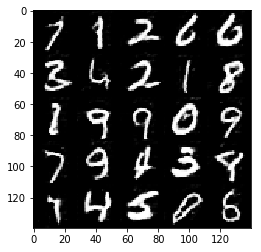

Epoch 2/2... Discriminator Loss: 0.8972... Generator Loss: 0.9477
Epoch 2/2... Discriminator Loss: 1.2820... Generator Loss: 0.5086
Epoch 2/2... Discriminator Loss: 1.3541... Generator Loss: 0.7868
Epoch 2/2... Discriminator Loss: 1.1069... Generator Loss: 0.8358
Epoch 2/2... Discriminator Loss: 1.0566... Generator Loss: 0.8635
Epoch 2/2... Discriminator Loss: 1.1949... Generator Loss: 0.7858
Epoch 2/2... Discriminator Loss: 1.4538... Generator Loss: 1.2467
Epoch 2/2... Discriminator Loss: 0.9426... Generator Loss: 0.8172
Epoch 2/2... Discriminator Loss: 1.3730... Generator Loss: 0.5926
Epoch 2/2... Discriminator Loss: 1.1149... Generator Loss: 1.4686


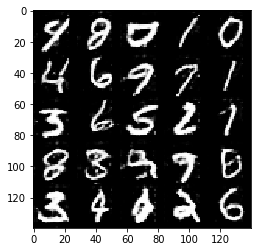

Epoch 2/2... Discriminator Loss: 1.0810... Generator Loss: 0.7605
Epoch 2/2... Discriminator Loss: 1.1018... Generator Loss: 1.0352
Epoch 2/2... Discriminator Loss: 1.2572... Generator Loss: 0.8082
Epoch 2/2... Discriminator Loss: 1.1140... Generator Loss: 1.1071
Epoch 2/2... Discriminator Loss: 0.9071... Generator Loss: 1.2500
Epoch 2/2... Discriminator Loss: 1.1524... Generator Loss: 0.6588
Epoch 2/2... Discriminator Loss: 1.0970... Generator Loss: 1.1059
Epoch 2/2... Discriminator Loss: 1.6310... Generator Loss: 0.5272
Epoch 2/2... Discriminator Loss: 1.2503... Generator Loss: 0.8195
Epoch 2/2... Discriminator Loss: 1.5894... Generator Loss: 0.3990


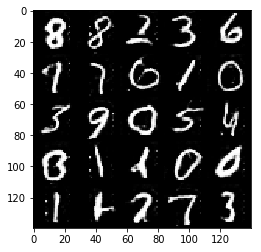

Epoch 2/2... Discriminator Loss: 1.2527... Generator Loss: 0.7622
Epoch 2/2... Discriminator Loss: 1.2243... Generator Loss: 0.6532
Epoch 2/2... Discriminator Loss: 1.1128... Generator Loss: 0.7295
Epoch 2/2... Discriminator Loss: 1.2258... Generator Loss: 2.1700
Epoch 2/2... Discriminator Loss: 1.3520... Generator Loss: 0.5757
Epoch 2/2... Discriminator Loss: 1.5907... Generator Loss: 0.5103
Epoch 2/2... Discriminator Loss: 0.9598... Generator Loss: 0.9170
Epoch 2/2... Discriminator Loss: 1.2954... Generator Loss: 0.9381
Epoch 2/2... Discriminator Loss: 1.3744... Generator Loss: 0.7375
Epoch 2/2... Discriminator Loss: 1.0703... Generator Loss: 0.8752


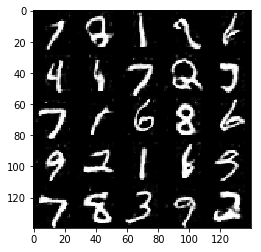

Epoch 2/2... Discriminator Loss: 1.0632... Generator Loss: 1.3808
Epoch 2/2... Discriminator Loss: 1.0704... Generator Loss: 1.1136
Epoch 2/2... Discriminator Loss: 1.3764... Generator Loss: 0.7758
Epoch 2/2... Discriminator Loss: 1.0127... Generator Loss: 1.3274
Epoch 2/2... Discriminator Loss: 1.0322... Generator Loss: 1.0246
Epoch 2/2... Discriminator Loss: 1.2035... Generator Loss: 0.5097
Epoch 2/2... Discriminator Loss: 1.2456... Generator Loss: 0.9344
Epoch 2/2... Discriminator Loss: 1.1781... Generator Loss: 0.5936
Epoch 2/2... Discriminator Loss: 1.2276... Generator Loss: 0.8868
Epoch 2/2... Discriminator Loss: 1.0205... Generator Loss: 0.8401


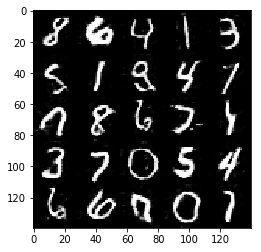

Epoch 2/2... Discriminator Loss: 1.0655... Generator Loss: 1.0236
Epoch 2/2... Discriminator Loss: 1.6989... Generator Loss: 0.3905
Epoch 2/2... Discriminator Loss: 1.0672... Generator Loss: 0.9672
Epoch 2/2... Discriminator Loss: 1.1420... Generator Loss: 1.1816
Epoch 2/2... Discriminator Loss: 1.4095... Generator Loss: 1.1552
Epoch 2/2... Discriminator Loss: 0.9127... Generator Loss: 1.0750
Epoch 2/2... Discriminator Loss: 1.5025... Generator Loss: 0.5397
Epoch 2/2... Discriminator Loss: 1.1775... Generator Loss: 1.5182
Epoch 2/2... Discriminator Loss: 1.2790... Generator Loss: 0.6359
Epoch 2/2... Discriminator Loss: 1.1117... Generator Loss: 0.9503


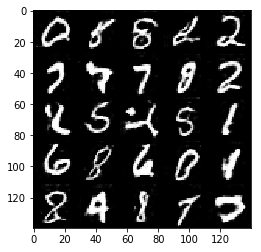

Epoch 2/2... Discriminator Loss: 1.0215... Generator Loss: 1.1711
Epoch 2/2... Discriminator Loss: 1.0950... Generator Loss: 0.9928
Epoch 2/2... Discriminator Loss: 1.1742... Generator Loss: 0.8268
Epoch 2/2... Discriminator Loss: 0.7826... Generator Loss: 1.2232
Epoch 2/2... Discriminator Loss: 1.0589... Generator Loss: 1.0848
Epoch 2/2... Discriminator Loss: 0.8358... Generator Loss: 1.3689
Epoch 2/2... Discriminator Loss: 1.5027... Generator Loss: 0.5567
Epoch 2/2... Discriminator Loss: 1.0129... Generator Loss: 0.8372
Epoch 2/2... Discriminator Loss: 0.9979... Generator Loss: 1.1693
Epoch 2/2... Discriminator Loss: 0.9885... Generator Loss: 1.2477


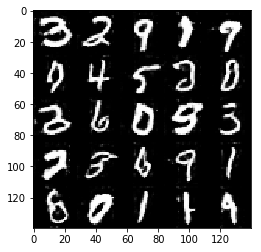

Epoch 2/2... Discriminator Loss: 1.1240... Generator Loss: 1.1227
Epoch 2/2... Discriminator Loss: 1.4654... Generator Loss: 1.5913
Epoch 2/2... Discriminator Loss: 0.9327... Generator Loss: 1.3348
Epoch 2/2... Discriminator Loss: 1.0874... Generator Loss: 0.7689
Epoch 2/2... Discriminator Loss: 1.6985... Generator Loss: 0.3116
Epoch 2/2... Discriminator Loss: 0.8433... Generator Loss: 1.3629
Epoch 2/2... Discriminator Loss: 0.7716... Generator Loss: 1.3168
Epoch 2/2... Discriminator Loss: 1.2942... Generator Loss: 0.5963
Epoch 2/2... Discriminator Loss: 1.0995... Generator Loss: 0.6659
Epoch 2/2... Discriminator Loss: 0.8789... Generator Loss: 0.9628


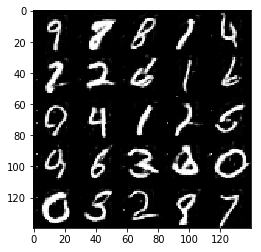

Epoch 2/2... Discriminator Loss: 0.9349... Generator Loss: 0.7652
Epoch 2/2... Discriminator Loss: 1.2787... Generator Loss: 0.5637
Epoch 2/2... Discriminator Loss: 0.9903... Generator Loss: 1.0803
Epoch 2/2... Discriminator Loss: 0.9825... Generator Loss: 1.0721
Epoch 2/2... Discriminator Loss: 1.1233... Generator Loss: 1.0462
Epoch 2/2... Discriminator Loss: 1.2614... Generator Loss: 0.7201
Epoch 2/2... Discriminator Loss: 1.1825... Generator Loss: 1.1236
Epoch 2/2... Discriminator Loss: 1.2454... Generator Loss: 0.9043
Epoch 2/2... Discriminator Loss: 0.9015... Generator Loss: 1.4811
Epoch 2/2... Discriminator Loss: 0.9681... Generator Loss: 1.0475


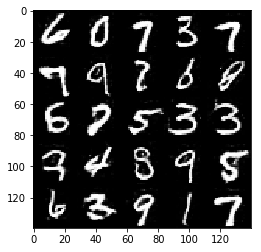

Epoch 2/2... Discriminator Loss: 0.8438... Generator Loss: 1.5839
Epoch 2/2... Discriminator Loss: 1.1597... Generator Loss: 1.0116
Epoch 2/2... Discriminator Loss: 1.3587... Generator Loss: 0.8909
Epoch 2/2... Discriminator Loss: 0.7609... Generator Loss: 1.0493
Epoch 2/2... Discriminator Loss: 1.3649... Generator Loss: 0.6029
Epoch 2/2... Discriminator Loss: 0.8916... Generator Loss: 1.7096
Epoch 2/2... Discriminator Loss: 1.1564... Generator Loss: 1.0139
Epoch 2/2... Discriminator Loss: 1.2783... Generator Loss: 0.8303
Epoch 2/2... Discriminator Loss: 1.1572... Generator Loss: 0.7331
Epoch 2/2... Discriminator Loss: 1.0929... Generator Loss: 0.8253


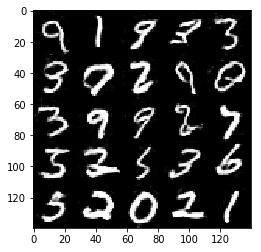

Epoch 2/2... Discriminator Loss: 1.6002... Generator Loss: 0.6671
Epoch 2/2... Discriminator Loss: 1.6661... Generator Loss: 0.5311
Epoch 2/2... Discriminator Loss: 1.0005... Generator Loss: 1.4969
Epoch 2/2... Discriminator Loss: 1.1331... Generator Loss: 0.8346
Epoch 2/2... Discriminator Loss: 0.8598... Generator Loss: 1.3230
Epoch 2/2... Discriminator Loss: 1.2511... Generator Loss: 0.6557
Epoch 2/2... Discriminator Loss: 1.1134... Generator Loss: 0.7562
Epoch 2/2... Discriminator Loss: 0.9946... Generator Loss: 2.0589
Epoch 2/2... Discriminator Loss: 1.2881... Generator Loss: 0.5641
Epoch 2/2... Discriminator Loss: 1.0919... Generator Loss: 0.6528


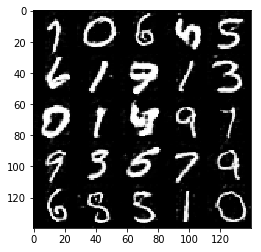

Epoch 2/2... Discriminator Loss: 1.0309... Generator Loss: 1.2068
Epoch 2/2... Discriminator Loss: 1.3399... Generator Loss: 0.7398
Epoch 2/2... Discriminator Loss: 1.2662... Generator Loss: 0.7955
Epoch 2/2... Discriminator Loss: 1.0245... Generator Loss: 1.0603
Epoch 2/2... Discriminator Loss: 1.1196... Generator Loss: 0.8924
Epoch 2/2... Discriminator Loss: 1.3054... Generator Loss: 0.7725
Epoch 2/2... Discriminator Loss: 1.4605... Generator Loss: 1.6390
Epoch 2/2... Discriminator Loss: 1.3125... Generator Loss: 1.0119
Epoch 2/2... Discriminator Loss: 1.0873... Generator Loss: 0.8611
Epoch 2/2... Discriminator Loss: 1.1911... Generator Loss: 0.7262


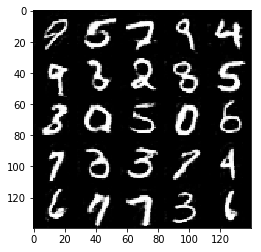

In [17]:
batch_size = 16
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 2.8352... Generator Loss: 16.5982
Epoch 1/1... Discriminator Loss: 2.7290... Generator Loss: 19.7791
Epoch 1/1... Discriminator Loss: 1.0007... Generator Loss: 0.8529
Epoch 1/1... Discriminator Loss: 1.1907... Generator Loss: 2.4521
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 2.2484
Epoch 1/1... Discriminator Loss: 0.7394... Generator Loss: 1.3161
Epoch 1/1... Discriminator Loss: 0.6542... Generator Loss: 1.9604
Epoch 1/1... Discriminator Loss: 0.8105... Generator Loss: 1.4531
Epoch 1/1... Discriminator Loss: 0.4475... Generator Loss: 3.0592
Epoch 1/1... Discriminator Loss: 0.8485... Generator Loss: 2.6758


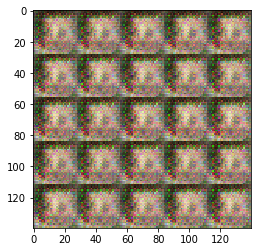

Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 4.4678
Epoch 1/1... Discriminator Loss: 0.9426... Generator Loss: 2.0242
Epoch 1/1... Discriminator Loss: 0.5537... Generator Loss: 2.2963
Epoch 1/1... Discriminator Loss: 0.6608... Generator Loss: 2.2283
Epoch 1/1... Discriminator Loss: 0.4810... Generator Loss: 2.2412
Epoch 1/1... Discriminator Loss: 0.4690... Generator Loss: 2.9894
Epoch 1/1... Discriminator Loss: 0.5173... Generator Loss: 2.8463
Epoch 1/1... Discriminator Loss: 0.4184... Generator Loss: 3.8546
Epoch 1/1... Discriminator Loss: 0.4379... Generator Loss: 3.7431
Epoch 1/1... Discriminator Loss: 0.4411... Generator Loss: 3.4861


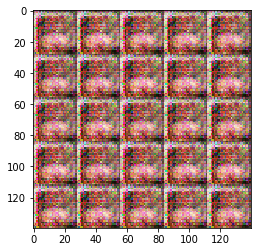

Epoch 1/1... Discriminator Loss: 0.4549... Generator Loss: 2.8841
Epoch 1/1... Discriminator Loss: 0.4011... Generator Loss: 4.3142
Epoch 1/1... Discriminator Loss: 0.4438... Generator Loss: 3.4235
Epoch 1/1... Discriminator Loss: 0.5044... Generator Loss: 7.9509
Epoch 1/1... Discriminator Loss: 0.4314... Generator Loss: 3.0907
Epoch 1/1... Discriminator Loss: 0.5439... Generator Loss: 1.9578
Epoch 1/1... Discriminator Loss: 0.4202... Generator Loss: 3.1839
Epoch 1/1... Discriminator Loss: 1.4555... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.3459... Generator Loss: 0.4827
Epoch 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.6707


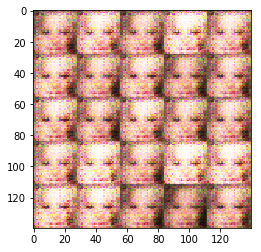

Epoch 1/1... Discriminator Loss: 0.5667... Generator Loss: 2.0620
Epoch 1/1... Discriminator Loss: 1.1312... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.4739... Generator Loss: 4.0497
Epoch 1/1... Discriminator Loss: 1.0975... Generator Loss: 1.1200
Epoch 1/1... Discriminator Loss: 0.8840... Generator Loss: 1.4604
Epoch 1/1... Discriminator Loss: 1.4347... Generator Loss: 3.9697
Epoch 1/1... Discriminator Loss: 1.1056... Generator Loss: 2.9391
Epoch 1/1... Discriminator Loss: 1.4073... Generator Loss: 0.5971
Epoch 1/1... Discriminator Loss: 2.5193... Generator Loss: 0.4003
Epoch 1/1... Discriminator Loss: 2.4690... Generator Loss: 1.3014


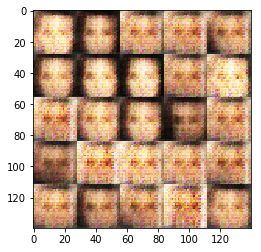

Epoch 1/1... Discriminator Loss: 1.6920... Generator Loss: 0.8693
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 2.3317
Epoch 1/1... Discriminator Loss: 1.0831... Generator Loss: 1.2104
Epoch 1/1... Discriminator Loss: 1.2240... Generator Loss: 0.9571
Epoch 1/1... Discriminator Loss: 1.4570... Generator Loss: 1.9204
Epoch 1/1... Discriminator Loss: 1.0516... Generator Loss: 1.4175
Epoch 1/1... Discriminator Loss: 1.2476... Generator Loss: 2.0071
Epoch 1/1... Discriminator Loss: 2.0776... Generator Loss: 0.3552
Epoch 1/1... Discriminator Loss: 1.4793... Generator Loss: 0.5430
Epoch 1/1... Discriminator Loss: 2.3874... Generator Loss: 0.2897


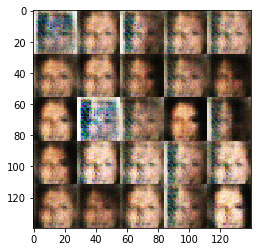

Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 1.0192
Epoch 1/1... Discriminator Loss: 1.0095... Generator Loss: 0.9440
Epoch 1/1... Discriminator Loss: 1.0966... Generator Loss: 1.1419
Epoch 1/1... Discriminator Loss: 1.5067... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.0869... Generator Loss: 1.3600
Epoch 1/1... Discriminator Loss: 1.7696... Generator Loss: 0.3995
Epoch 1/1... Discriminator Loss: 1.1750... Generator Loss: 1.0101
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.5955
Epoch 1/1... Discriminator Loss: 1.2926... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.9544... Generator Loss: 0.4498


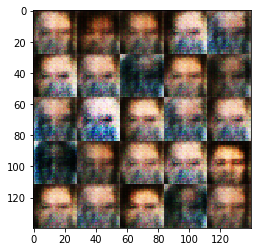

Epoch 1/1... Discriminator Loss: 1.6703... Generator Loss: 0.6164
Epoch 1/1... Discriminator Loss: 1.3135... Generator Loss: 0.6517
Epoch 1/1... Discriminator Loss: 1.4809... Generator Loss: 0.5288
Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 1.0867
Epoch 1/1... Discriminator Loss: 1.5700... Generator Loss: 1.1506
Epoch 1/1... Discriminator Loss: 1.8424... Generator Loss: 0.5719
Epoch 1/1... Discriminator Loss: 1.2380... Generator Loss: 1.6056
Epoch 1/1... Discriminator Loss: 1.3171... Generator Loss: 0.7413
Epoch 1/1... Discriminator Loss: 1.2127... Generator Loss: 0.7001
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 1.4037


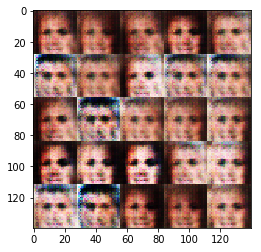

Epoch 1/1... Discriminator Loss: 1.7337... Generator Loss: 0.6105
Epoch 1/1... Discriminator Loss: 1.2020... Generator Loss: 1.3083
Epoch 1/1... Discriminator Loss: 1.0358... Generator Loss: 1.6923
Epoch 1/1... Discriminator Loss: 0.9820... Generator Loss: 1.0784
Epoch 1/1... Discriminator Loss: 1.0193... Generator Loss: 1.1503
Epoch 1/1... Discriminator Loss: 1.0151... Generator Loss: 1.6392
Epoch 1/1... Discriminator Loss: 1.5745... Generator Loss: 0.5327
Epoch 1/1... Discriminator Loss: 1.1324... Generator Loss: 1.0601
Epoch 1/1... Discriminator Loss: 0.9635... Generator Loss: 1.5092
Epoch 1/1... Discriminator Loss: 0.8883... Generator Loss: 1.2257


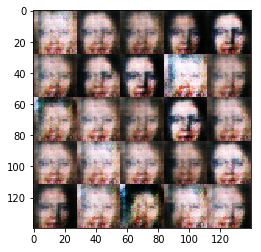

Epoch 1/1... Discriminator Loss: 0.8196... Generator Loss: 1.7469
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.8355
Epoch 1/1... Discriminator Loss: 1.2398... Generator Loss: 1.2527
Epoch 1/1... Discriminator Loss: 0.7331... Generator Loss: 1.5667
Epoch 1/1... Discriminator Loss: 1.1709... Generator Loss: 1.3340
Epoch 1/1... Discriminator Loss: 1.1933... Generator Loss: 0.6967
Epoch 1/1... Discriminator Loss: 0.9290... Generator Loss: 1.3446
Epoch 1/1... Discriminator Loss: 1.2600... Generator Loss: 0.7344
Epoch 1/1... Discriminator Loss: 1.2495... Generator Loss: 2.7766
Epoch 1/1... Discriminator Loss: 1.1201... Generator Loss: 1.2630


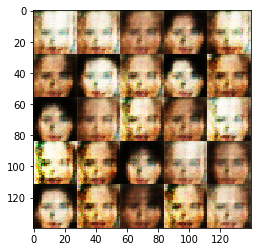

Epoch 1/1... Discriminator Loss: 1.5236... Generator Loss: 0.5627
Epoch 1/1... Discriminator Loss: 1.0919... Generator Loss: 1.0670
Epoch 1/1... Discriminator Loss: 0.7981... Generator Loss: 2.1058
Epoch 1/1... Discriminator Loss: 1.0387... Generator Loss: 1.2185
Epoch 1/1... Discriminator Loss: 0.7265... Generator Loss: 1.7033
Epoch 1/1... Discriminator Loss: 1.2616... Generator Loss: 0.8665
Epoch 1/1... Discriminator Loss: 0.9401... Generator Loss: 1.7135
Epoch 1/1... Discriminator Loss: 0.6453... Generator Loss: 1.7004
Epoch 1/1... Discriminator Loss: 0.9847... Generator Loss: 1.3643
Epoch 1/1... Discriminator Loss: 0.8321... Generator Loss: 2.0910


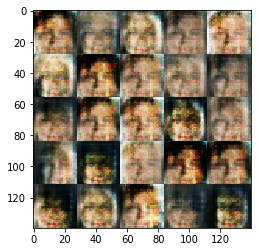

Epoch 1/1... Discriminator Loss: 1.1728... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.0323... Generator Loss: 1.2156
Epoch 1/1... Discriminator Loss: 0.7495... Generator Loss: 1.9465
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.5135... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 1.0049... Generator Loss: 2.9150
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 0.9632... Generator Loss: 1.4482
Epoch 1/1... Discriminator Loss: 1.5538... Generator Loss: 0.6151
Epoch 1/1... Discriminator Loss: 0.9031... Generator Loss: 1.1932


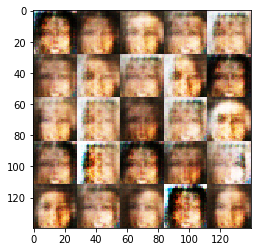

Epoch 1/1... Discriminator Loss: 1.3690... Generator Loss: 0.6634
Epoch 1/1... Discriminator Loss: 1.0635... Generator Loss: 4.0090
Epoch 1/1... Discriminator Loss: 1.8064... Generator Loss: 3.7697
Epoch 1/1... Discriminator Loss: 1.2538... Generator Loss: 0.6928
Epoch 1/1... Discriminator Loss: 2.2594... Generator Loss: 0.1891
Epoch 1/1... Discriminator Loss: 1.0108... Generator Loss: 1.0457
Epoch 1/1... Discriminator Loss: 1.1018... Generator Loss: 0.9758
Epoch 1/1... Discriminator Loss: 0.9724... Generator Loss: 2.1411
Epoch 1/1... Discriminator Loss: 1.9697... Generator Loss: 0.2579
Epoch 1/1... Discriminator Loss: 1.1015... Generator Loss: 1.1883


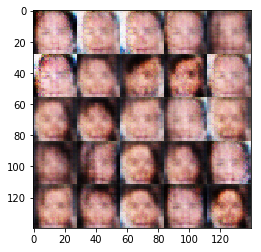

Epoch 1/1... Discriminator Loss: 1.4772... Generator Loss: 1.0863
Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 2.2977
Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.8547
Epoch 1/1... Discriminator Loss: 0.8095... Generator Loss: 1.4216
Epoch 1/1... Discriminator Loss: 2.0699... Generator Loss: 0.2313
Epoch 1/1... Discriminator Loss: 0.7159... Generator Loss: 1.5484
Epoch 1/1... Discriminator Loss: 2.5171... Generator Loss: 0.1880
Epoch 1/1... Discriminator Loss: 1.0949... Generator Loss: 0.9170
Epoch 1/1... Discriminator Loss: 1.2517... Generator Loss: 1.1477
Epoch 1/1... Discriminator Loss: 1.1529... Generator Loss: 2.4473


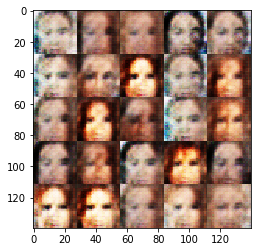

Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.5207
Epoch 1/1... Discriminator Loss: 1.4099... Generator Loss: 0.5492
Epoch 1/1... Discriminator Loss: 1.0936... Generator Loss: 0.8695
Epoch 1/1... Discriminator Loss: 1.3792... Generator Loss: 0.7741
Epoch 1/1... Discriminator Loss: 1.2155... Generator Loss: 0.8875
Epoch 1/1... Discriminator Loss: 0.9581... Generator Loss: 1.2315
Epoch 1/1... Discriminator Loss: 0.9147... Generator Loss: 1.9271
Epoch 1/1... Discriminator Loss: 0.8383... Generator Loss: 1.1820
Epoch 1/1... Discriminator Loss: 0.9965... Generator Loss: 1.0092
Epoch 1/1... Discriminator Loss: 1.0209... Generator Loss: 1.0030


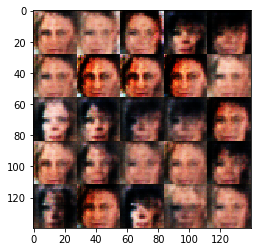

Epoch 1/1... Discriminator Loss: 0.8485... Generator Loss: 1.1898
Epoch 1/1... Discriminator Loss: 0.6507... Generator Loss: 2.3072
Epoch 1/1... Discriminator Loss: 1.1176... Generator Loss: 0.7789
Epoch 1/1... Discriminator Loss: 1.0593... Generator Loss: 1.0913
Epoch 1/1... Discriminator Loss: 1.2293... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.4201... Generator Loss: 2.0888
Epoch 1/1... Discriminator Loss: 0.8610... Generator Loss: 2.8352
Epoch 1/1... Discriminator Loss: 0.9422... Generator Loss: 1.6411
Epoch 1/1... Discriminator Loss: 1.1172... Generator Loss: 1.0065
Epoch 1/1... Discriminator Loss: 0.8850... Generator Loss: 2.1015


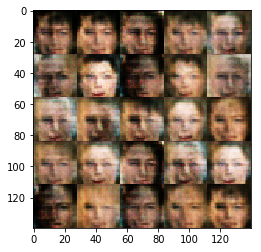

Epoch 1/1... Discriminator Loss: 0.7657... Generator Loss: 1.7479
Epoch 1/1... Discriminator Loss: 0.9151... Generator Loss: 1.1540
Epoch 1/1... Discriminator Loss: 0.9147... Generator Loss: 1.5151
Epoch 1/1... Discriminator Loss: 1.1772... Generator Loss: 1.5621
Epoch 1/1... Discriminator Loss: 1.1461... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.6224... Generator Loss: 0.4550
Epoch 1/1... Discriminator Loss: 1.1625... Generator Loss: 0.8304
Epoch 1/1... Discriminator Loss: 0.8942... Generator Loss: 1.0836
Epoch 1/1... Discriminator Loss: 1.0513... Generator Loss: 1.6813
Epoch 1/1... Discriminator Loss: 1.9813... Generator Loss: 0.2692


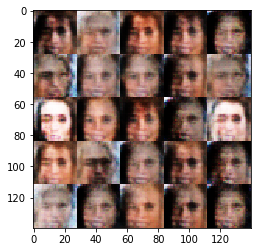

Epoch 1/1... Discriminator Loss: 1.5452... Generator Loss: 0.4321
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.5441
Epoch 1/1... Discriminator Loss: 0.9825... Generator Loss: 0.7897
Epoch 1/1... Discriminator Loss: 1.0439... Generator Loss: 0.8768
Epoch 1/1... Discriminator Loss: 1.0942... Generator Loss: 0.8831
Epoch 1/1... Discriminator Loss: 0.8418... Generator Loss: 2.0095
Epoch 1/1... Discriminator Loss: 0.9625... Generator Loss: 2.8878
Epoch 1/1... Discriminator Loss: 0.9451... Generator Loss: 1.3728
Epoch 1/1... Discriminator Loss: 1.1143... Generator Loss: 0.7172
Epoch 1/1... Discriminator Loss: 1.7987... Generator Loss: 0.4160


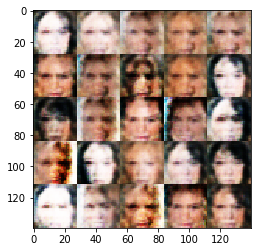

Epoch 1/1... Discriminator Loss: 1.7035... Generator Loss: 0.4059
Epoch 1/1... Discriminator Loss: 0.8623... Generator Loss: 1.7289
Epoch 1/1... Discriminator Loss: 1.1124... Generator Loss: 0.9590
Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.6705
Epoch 1/1... Discriminator Loss: 0.7965... Generator Loss: 2.7396
Epoch 1/1... Discriminator Loss: 1.1016... Generator Loss: 0.9439
Epoch 1/1... Discriminator Loss: 0.7103... Generator Loss: 4.4458
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.5468
Epoch 1/1... Discriminator Loss: 1.1524... Generator Loss: 1.4399
Epoch 1/1... Discriminator Loss: 1.0656... Generator Loss: 0.7423


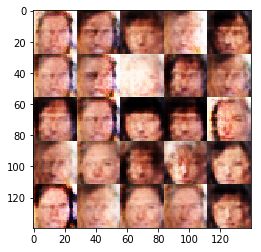

Epoch 1/1... Discriminator Loss: 0.8610... Generator Loss: 1.1099
Epoch 1/1... Discriminator Loss: 0.6106... Generator Loss: 2.6134
Epoch 1/1... Discriminator Loss: 1.5736... Generator Loss: 0.3063
Epoch 1/1... Discriminator Loss: 1.3050... Generator Loss: 0.5854
Epoch 1/1... Discriminator Loss: 0.7678... Generator Loss: 1.5225
Epoch 1/1... Discriminator Loss: 0.6944... Generator Loss: 1.5988
Epoch 1/1... Discriminator Loss: 0.9915... Generator Loss: 0.9543
Epoch 1/1... Discriminator Loss: 0.9214... Generator Loss: 1.4518
Epoch 1/1... Discriminator Loss: 1.1598... Generator Loss: 0.7987
Epoch 1/1... Discriminator Loss: 0.7669... Generator Loss: 2.3332


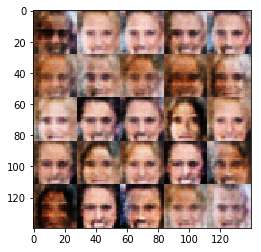

Epoch 1/1... Discriminator Loss: 1.7053... Generator Loss: 0.3828
Epoch 1/1... Discriminator Loss: 0.6723... Generator Loss: 1.7386
Epoch 1/1... Discriminator Loss: 1.2653... Generator Loss: 1.4892
Epoch 1/1... Discriminator Loss: 1.0938... Generator Loss: 0.9519
Epoch 1/1... Discriminator Loss: 1.0828... Generator Loss: 1.4752
Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 0.6653
Epoch 1/1... Discriminator Loss: 1.2028... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 1.5441... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 1.0080... Generator Loss: 1.2481
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.7128


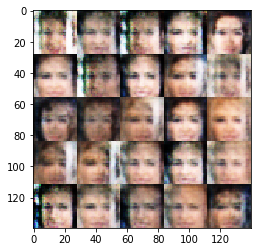

Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.5905
Epoch 1/1... Discriminator Loss: 1.7393... Generator Loss: 0.4166
Epoch 1/1... Discriminator Loss: 0.9776... Generator Loss: 0.9502
Epoch 1/1... Discriminator Loss: 0.8800... Generator Loss: 1.3914
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.6420
Epoch 1/1... Discriminator Loss: 1.0453... Generator Loss: 1.0984
Epoch 1/1... Discriminator Loss: 0.7988... Generator Loss: 1.3658
Epoch 1/1... Discriminator Loss: 0.9540... Generator Loss: 1.0424
Epoch 1/1... Discriminator Loss: 1.2082... Generator Loss: 0.7496
Epoch 1/1... Discriminator Loss: 1.5814... Generator Loss: 0.4375


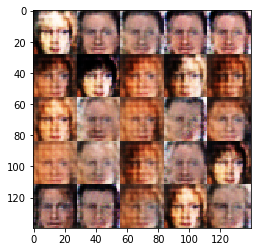

Epoch 1/1... Discriminator Loss: 1.0629... Generator Loss: 1.1554
Epoch 1/1... Discriminator Loss: 1.1678... Generator Loss: 1.0516
Epoch 1/1... Discriminator Loss: 1.0310... Generator Loss: 1.0199
Epoch 1/1... Discriminator Loss: 1.2112... Generator Loss: 0.7665
Epoch 1/1... Discriminator Loss: 1.7746... Generator Loss: 0.3496
Epoch 1/1... Discriminator Loss: 0.7718... Generator Loss: 1.2784
Epoch 1/1... Discriminator Loss: 1.5278... Generator Loss: 0.5042
Epoch 1/1... Discriminator Loss: 1.4672... Generator Loss: 0.4528
Epoch 1/1... Discriminator Loss: 0.9096... Generator Loss: 1.7343
Epoch 1/1... Discriminator Loss: 0.8000... Generator Loss: 1.5489


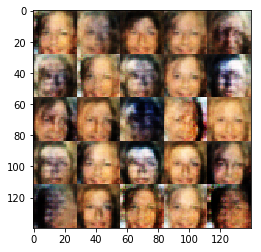

Epoch 1/1... Discriminator Loss: 1.1217... Generator Loss: 0.8309
Epoch 1/1... Discriminator Loss: 0.6803... Generator Loss: 2.6918
Epoch 1/1... Discriminator Loss: 0.8225... Generator Loss: 1.6124
Epoch 1/1... Discriminator Loss: 0.9664... Generator Loss: 2.1937
Epoch 1/1... Discriminator Loss: 1.0714... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.6430... Generator Loss: 0.3635
Epoch 1/1... Discriminator Loss: 1.0389... Generator Loss: 1.4067
Epoch 1/1... Discriminator Loss: 1.1006... Generator Loss: 0.8266
Epoch 1/1... Discriminator Loss: 0.9313... Generator Loss: 0.8506
Epoch 1/1... Discriminator Loss: 0.8171... Generator Loss: 1.3641


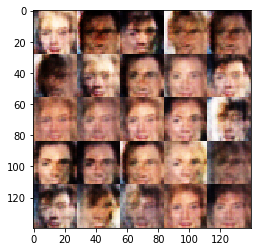

Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.8193
Epoch 1/1... Discriminator Loss: 1.0242... Generator Loss: 0.8584
Epoch 1/1... Discriminator Loss: 0.9926... Generator Loss: 1.1325
Epoch 1/1... Discriminator Loss: 1.8550... Generator Loss: 0.4444
Epoch 1/1... Discriminator Loss: 0.9203... Generator Loss: 1.0972
Epoch 1/1... Discriminator Loss: 1.0262... Generator Loss: 0.9571
Epoch 1/1... Discriminator Loss: 1.1044... Generator Loss: 0.9767
Epoch 1/1... Discriminator Loss: 0.8002... Generator Loss: 1.2256
Epoch 1/1... Discriminator Loss: 0.8741... Generator Loss: 2.0035
Epoch 1/1... Discriminator Loss: 1.2096... Generator Loss: 0.8607


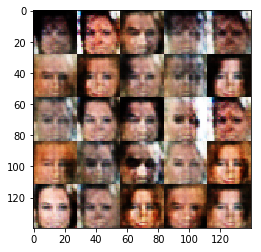

Epoch 1/1... Discriminator Loss: 0.8751... Generator Loss: 1.0973
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.5391
Epoch 1/1... Discriminator Loss: 0.8339... Generator Loss: 1.1416
Epoch 1/1... Discriminator Loss: 1.2370... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 0.8759... Generator Loss: 1.4026
Epoch 1/1... Discriminator Loss: 0.8205... Generator Loss: 2.2536
Epoch 1/1... Discriminator Loss: 1.6363... Generator Loss: 0.4055
Epoch 1/1... Discriminator Loss: 1.6784... Generator Loss: 0.4979
Epoch 1/1... Discriminator Loss: 0.7851... Generator Loss: 1.4792
Epoch 1/1... Discriminator Loss: 1.5202... Generator Loss: 0.5405


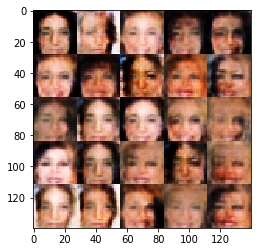

Epoch 1/1... Discriminator Loss: 0.7873... Generator Loss: 2.1016
Epoch 1/1... Discriminator Loss: 0.8954... Generator Loss: 1.1981
Epoch 1/1... Discriminator Loss: 0.8614... Generator Loss: 1.1038
Epoch 1/1... Discriminator Loss: 1.0989... Generator Loss: 1.5282
Epoch 1/1... Discriminator Loss: 0.9520... Generator Loss: 1.1072
Epoch 1/1... Discriminator Loss: 3.5242... Generator Loss: 0.0738
Epoch 1/1... Discriminator Loss: 1.1177... Generator Loss: 2.1843
Epoch 1/1... Discriminator Loss: 1.0568... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 0.6996... Generator Loss: 2.4105
Epoch 1/1... Discriminator Loss: 0.9868... Generator Loss: 1.3815


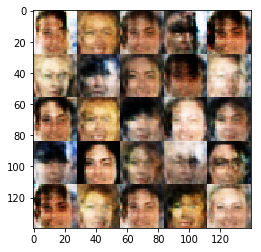

Epoch 1/1... Discriminator Loss: 0.8624... Generator Loss: 2.0839
Epoch 1/1... Discriminator Loss: 1.0752... Generator Loss: 1.9554
Epoch 1/1... Discriminator Loss: 1.0358... Generator Loss: 1.1820
Epoch 1/1... Discriminator Loss: 0.8916... Generator Loss: 1.1269
Epoch 1/1... Discriminator Loss: 1.0090... Generator Loss: 1.1833
Epoch 1/1... Discriminator Loss: 1.5210... Generator Loss: 0.5289
Epoch 1/1... Discriminator Loss: 0.7969... Generator Loss: 1.6971
Epoch 1/1... Discriminator Loss: 1.2789... Generator Loss: 0.5527
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.5764
Epoch 1/1... Discriminator Loss: 0.9190... Generator Loss: 1.1451


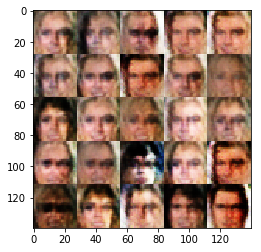

Epoch 1/1... Discriminator Loss: 0.7365... Generator Loss: 1.6302
Epoch 1/1... Discriminator Loss: 0.7305... Generator Loss: 1.7421
Epoch 1/1... Discriminator Loss: 1.0030... Generator Loss: 1.4210
Epoch 1/1... Discriminator Loss: 0.6603... Generator Loss: 1.7855
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.5287
Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.7197
Epoch 1/1... Discriminator Loss: 1.0711... Generator Loss: 2.5071
Epoch 1/1... Discriminator Loss: 1.0306... Generator Loss: 1.7124
Epoch 1/1... Discriminator Loss: 0.7152... Generator Loss: 1.4033
Epoch 1/1... Discriminator Loss: 0.7584... Generator Loss: 2.8933


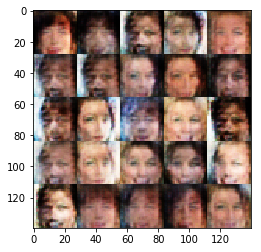

Epoch 1/1... Discriminator Loss: 1.1129... Generator Loss: 0.8992
Epoch 1/1... Discriminator Loss: 0.9005... Generator Loss: 1.0594
Epoch 1/1... Discriminator Loss: 1.0511... Generator Loss: 1.3801
Epoch 1/1... Discriminator Loss: 1.0053... Generator Loss: 1.3345
Epoch 1/1... Discriminator Loss: 2.1640... Generator Loss: 0.2041
Epoch 1/1... Discriminator Loss: 0.9762... Generator Loss: 1.2299
Epoch 1/1... Discriminator Loss: 0.6678... Generator Loss: 2.0926
Epoch 1/1... Discriminator Loss: 0.8643... Generator Loss: 0.9460
Epoch 1/1... Discriminator Loss: 0.9028... Generator Loss: 1.1863
Epoch 1/1... Discriminator Loss: 0.8415... Generator Loss: 2.1430


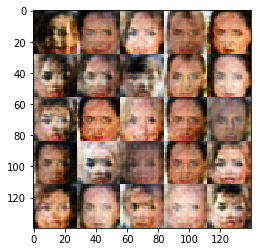

Epoch 1/1... Discriminator Loss: 0.6931... Generator Loss: 1.7453
Epoch 1/1... Discriminator Loss: 1.0068... Generator Loss: 1.7581
Epoch 1/1... Discriminator Loss: 1.1682... Generator Loss: 2.6529
Epoch 1/1... Discriminator Loss: 1.4375... Generator Loss: 0.5356
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.6502
Epoch 1/1... Discriminator Loss: 1.5304... Generator Loss: 0.4485
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 1.6338
Epoch 1/1... Discriminator Loss: 0.8737... Generator Loss: 1.1508
Epoch 1/1... Discriminator Loss: 0.9608... Generator Loss: 2.5534
Epoch 1/1... Discriminator Loss: 0.8336... Generator Loss: 2.4824


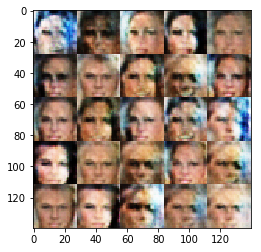

Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 2.2399
Epoch 1/1... Discriminator Loss: 1.0593... Generator Loss: 1.9332
Epoch 1/1... Discriminator Loss: 0.8866... Generator Loss: 1.5413
Epoch 1/1... Discriminator Loss: 1.3487... Generator Loss: 0.5976
Epoch 1/1... Discriminator Loss: 1.1072... Generator Loss: 1.0686
Epoch 1/1... Discriminator Loss: 0.7953... Generator Loss: 1.9202
Epoch 1/1... Discriminator Loss: 1.1297... Generator Loss: 0.9063
Epoch 1/1... Discriminator Loss: 0.9650... Generator Loss: 1.0552
Epoch 1/1... Discriminator Loss: 0.7037... Generator Loss: 1.6065
Epoch 1/1... Discriminator Loss: 0.6818... Generator Loss: 1.9519


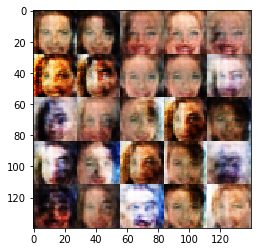

Epoch 1/1... Discriminator Loss: 0.8348... Generator Loss: 1.1104
Epoch 1/1... Discriminator Loss: 1.1460... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 0.8140... Generator Loss: 1.2781
Epoch 1/1... Discriminator Loss: 1.3523... Generator Loss: 0.4097
Epoch 1/1... Discriminator Loss: 0.7635... Generator Loss: 1.7811
Epoch 1/1... Discriminator Loss: 0.9947... Generator Loss: 0.8799
Epoch 1/1... Discriminator Loss: 1.0793... Generator Loss: 0.8710
Epoch 1/1... Discriminator Loss: 0.8262... Generator Loss: 1.6486
Epoch 1/1... Discriminator Loss: 0.9832... Generator Loss: 1.4862
Epoch 1/1... Discriminator Loss: 0.9630... Generator Loss: 1.1650


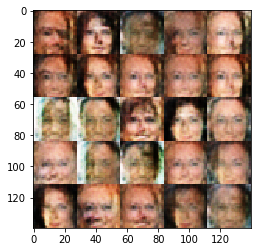

Epoch 1/1... Discriminator Loss: 0.8995... Generator Loss: 1.3219
Epoch 1/1... Discriminator Loss: 0.9169... Generator Loss: 1.8982
Epoch 1/1... Discriminator Loss: 1.0979... Generator Loss: 0.9065
Epoch 1/1... Discriminator Loss: 0.7190... Generator Loss: 1.5835
Epoch 1/1... Discriminator Loss: 1.2952... Generator Loss: 0.6749
Epoch 1/1... Discriminator Loss: 0.7710... Generator Loss: 1.6305
Epoch 1/1... Discriminator Loss: 0.9525... Generator Loss: 1.7275
Epoch 1/1... Discriminator Loss: 0.8798... Generator Loss: 1.2176
Epoch 1/1... Discriminator Loss: 1.0409... Generator Loss: 2.5397
Epoch 1/1... Discriminator Loss: 0.9085... Generator Loss: 1.9840


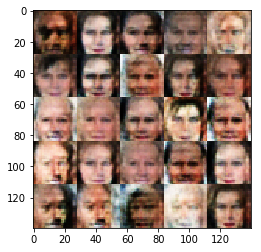

Epoch 1/1... Discriminator Loss: 1.1623... Generator Loss: 0.7851
Epoch 1/1... Discriminator Loss: 1.8262... Generator Loss: 0.3246
Epoch 1/1... Discriminator Loss: 0.8156... Generator Loss: 1.5734
Epoch 1/1... Discriminator Loss: 1.0826... Generator Loss: 0.7525
Epoch 1/1... Discriminator Loss: 0.8619... Generator Loss: 1.2914
Epoch 1/1... Discriminator Loss: 0.9277... Generator Loss: 2.1364
Epoch 1/1... Discriminator Loss: 0.7441... Generator Loss: 1.7998
Epoch 1/1... Discriminator Loss: 1.2802... Generator Loss: 1.6786
Epoch 1/1... Discriminator Loss: 1.7396... Generator Loss: 0.3817
Epoch 1/1... Discriminator Loss: 0.9096... Generator Loss: 1.2991


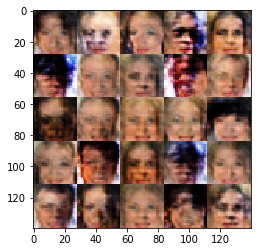

Epoch 1/1... Discriminator Loss: 0.6744... Generator Loss: 2.0384
Epoch 1/1... Discriminator Loss: 1.4099... Generator Loss: 2.7374
Epoch 1/1... Discriminator Loss: 1.9591... Generator Loss: 0.3232
Epoch 1/1... Discriminator Loss: 1.1948... Generator Loss: 1.0589
Epoch 1/1... Discriminator Loss: 1.0762... Generator Loss: 2.0304
Epoch 1/1... Discriminator Loss: 0.9159... Generator Loss: 1.7521
Epoch 1/1... Discriminator Loss: 1.0116... Generator Loss: 1.4504
Epoch 1/1... Discriminator Loss: 1.2411... Generator Loss: 1.4209
Epoch 1/1... Discriminator Loss: 1.0024... Generator Loss: 0.9779
Epoch 1/1... Discriminator Loss: 0.7461... Generator Loss: 1.7578


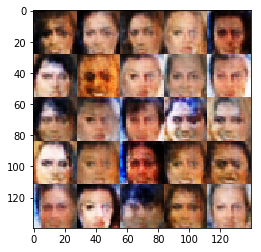

Epoch 1/1... Discriminator Loss: 1.0556... Generator Loss: 2.2956
Epoch 1/1... Discriminator Loss: 1.0088... Generator Loss: 1.9990
Epoch 1/1... Discriminator Loss: 1.0553... Generator Loss: 0.8282
Epoch 1/1... Discriminator Loss: 0.9012... Generator Loss: 0.9408
Epoch 1/1... Discriminator Loss: 0.9359... Generator Loss: 1.7638
Epoch 1/1... Discriminator Loss: 0.9436... Generator Loss: 0.9146
Epoch 1/1... Discriminator Loss: 0.8983... Generator Loss: 1.6810
Epoch 1/1... Discriminator Loss: 1.0050... Generator Loss: 0.9274
Epoch 1/1... Discriminator Loss: 0.9115... Generator Loss: 0.9370
Epoch 1/1... Discriminator Loss: 0.8641... Generator Loss: 1.1660


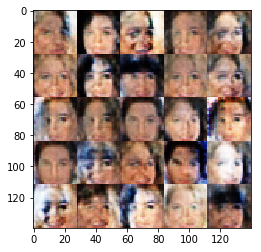

Epoch 1/1... Discriminator Loss: 1.0359... Generator Loss: 1.1837
Epoch 1/1... Discriminator Loss: 1.6267... Generator Loss: 0.4267
Epoch 1/1... Discriminator Loss: 0.7714... Generator Loss: 1.9428
Epoch 1/1... Discriminator Loss: 0.9282... Generator Loss: 1.2854
Epoch 1/1... Discriminator Loss: 0.7159... Generator Loss: 1.6309
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.6064
Epoch 1/1... Discriminator Loss: 1.0762... Generator Loss: 1.3820
Epoch 1/1... Discriminator Loss: 0.9370... Generator Loss: 1.0319
Epoch 1/1... Discriminator Loss: 1.0282... Generator Loss: 0.9290
Epoch 1/1... Discriminator Loss: 1.1855... Generator Loss: 1.0156


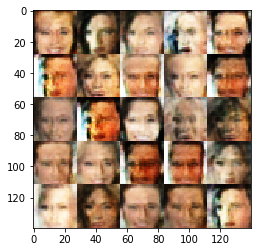

Epoch 1/1... Discriminator Loss: 0.9745... Generator Loss: 1.2511
Epoch 1/1... Discriminator Loss: 1.2218... Generator Loss: 0.6510
Epoch 1/1... Discriminator Loss: 1.3307... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.1560... Generator Loss: 0.9062
Epoch 1/1... Discriminator Loss: 0.7191... Generator Loss: 1.5062
Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.0386... Generator Loss: 2.5021
Epoch 1/1... Discriminator Loss: 0.8721... Generator Loss: 1.2380
Epoch 1/1... Discriminator Loss: 1.1944... Generator Loss: 1.0412
Epoch 1/1... Discriminator Loss: 1.0377... Generator Loss: 1.9231


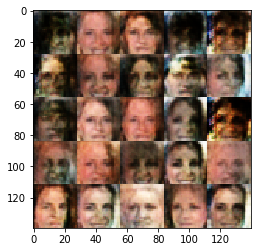

Epoch 1/1... Discriminator Loss: 0.8324... Generator Loss: 1.4728
Epoch 1/1... Discriminator Loss: 1.4269... Generator Loss: 0.6533
Epoch 1/1... Discriminator Loss: 1.1942... Generator Loss: 0.6644
Epoch 1/1... Discriminator Loss: 0.8930... Generator Loss: 0.9694
Epoch 1/1... Discriminator Loss: 0.9277... Generator Loss: 1.4747
Epoch 1/1... Discriminator Loss: 0.7522... Generator Loss: 1.6047
Epoch 1/1... Discriminator Loss: 0.7458... Generator Loss: 1.2878
Epoch 1/1... Discriminator Loss: 0.7337... Generator Loss: 1.2765
Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 0.9973
Epoch 1/1... Discriminator Loss: 0.8278... Generator Loss: 1.7197


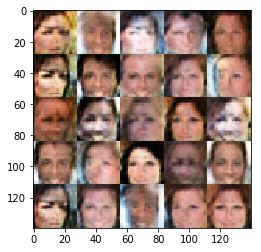

Epoch 1/1... Discriminator Loss: 0.8466... Generator Loss: 1.9716
Epoch 1/1... Discriminator Loss: 1.3171... Generator Loss: 0.5982
Epoch 1/1... Discriminator Loss: 1.1497... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 0.7989... Generator Loss: 1.3673
Epoch 1/1... Discriminator Loss: 0.8705... Generator Loss: 1.1900
Epoch 1/1... Discriminator Loss: 0.8712... Generator Loss: 1.4837
Epoch 1/1... Discriminator Loss: 0.9562... Generator Loss: 1.5722
Epoch 1/1... Discriminator Loss: 0.7517... Generator Loss: 1.4795
Epoch 1/1... Discriminator Loss: 0.9548... Generator Loss: 1.0472
Epoch 1/1... Discriminator Loss: 0.9764... Generator Loss: 0.8614


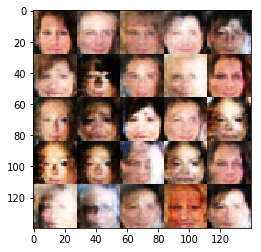

Epoch 1/1... Discriminator Loss: 0.8140... Generator Loss: 1.3464
Epoch 1/1... Discriminator Loss: 0.9912... Generator Loss: 0.9691
Epoch 1/1... Discriminator Loss: 0.8988... Generator Loss: 1.3074
Epoch 1/1... Discriminator Loss: 0.9519... Generator Loss: 2.0253
Epoch 1/1... Discriminator Loss: 0.8038... Generator Loss: 1.2634
Epoch 1/1... Discriminator Loss: 0.9111... Generator Loss: 1.1550
Epoch 1/1... Discriminator Loss: 1.2638... Generator Loss: 2.5924
Epoch 1/1... Discriminator Loss: 0.8374... Generator Loss: 1.4759
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.5765
Epoch 1/1... Discriminator Loss: 0.9391... Generator Loss: 1.7108


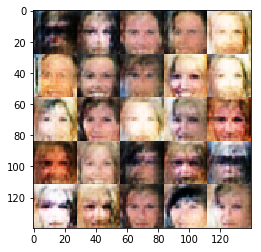

Epoch 1/1... Discriminator Loss: 0.9334... Generator Loss: 1.2702
Epoch 1/1... Discriminator Loss: 1.1550... Generator Loss: 0.7469
Epoch 1/1... Discriminator Loss: 0.9348... Generator Loss: 1.1766
Epoch 1/1... Discriminator Loss: 1.0922... Generator Loss: 0.9129
Epoch 1/1... Discriminator Loss: 2.0211... Generator Loss: 0.2326
Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.6095
Epoch 1/1... Discriminator Loss: 0.7248... Generator Loss: 1.5663
Epoch 1/1... Discriminator Loss: 0.6696... Generator Loss: 1.9428
Epoch 1/1... Discriminator Loss: 0.8502... Generator Loss: 1.4287
Epoch 1/1... Discriminator Loss: 0.6816... Generator Loss: 1.8669


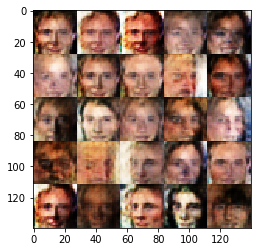

Epoch 1/1... Discriminator Loss: 1.3746... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 0.8309... Generator Loss: 1.5570
Epoch 1/1... Discriminator Loss: 0.6517... Generator Loss: 2.3782
Epoch 1/1... Discriminator Loss: 1.0593... Generator Loss: 1.8882
Epoch 1/1... Discriminator Loss: 0.8317... Generator Loss: 1.3773
Epoch 1/1... Discriminator Loss: 0.8227... Generator Loss: 1.1981
Epoch 1/1... Discriminator Loss: 0.8456... Generator Loss: 2.0926
Epoch 1/1... Discriminator Loss: 0.9004... Generator Loss: 2.2417
Epoch 1/1... Discriminator Loss: 0.9007... Generator Loss: 1.0560
Epoch 1/1... Discriminator Loss: 1.1460... Generator Loss: 2.9517


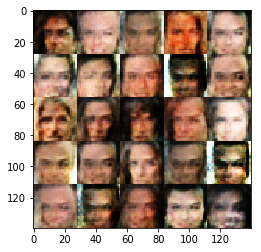

Epoch 1/1... Discriminator Loss: 0.8447... Generator Loss: 1.0343
Epoch 1/1... Discriminator Loss: 1.7305... Generator Loss: 0.3708
Epoch 1/1... Discriminator Loss: 0.7926... Generator Loss: 1.3302
Epoch 1/1... Discriminator Loss: 0.8520... Generator Loss: 1.4122
Epoch 1/1... Discriminator Loss: 0.9761... Generator Loss: 1.8667
Epoch 1/1... Discriminator Loss: 1.1293... Generator Loss: 0.6944
Epoch 1/1... Discriminator Loss: 0.9086... Generator Loss: 1.3403
Epoch 1/1... Discriminator Loss: 0.6551... Generator Loss: 1.5973
Epoch 1/1... Discriminator Loss: 0.6791... Generator Loss: 1.3558
Epoch 1/1... Discriminator Loss: 0.9997... Generator Loss: 1.0361


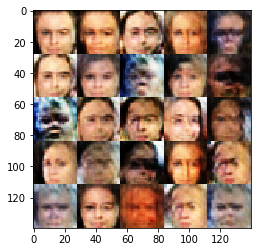

Epoch 1/1... Discriminator Loss: 0.8305... Generator Loss: 1.3422
Epoch 1/1... Discriminator Loss: 1.0298... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 0.7903... Generator Loss: 2.3726
Epoch 1/1... Discriminator Loss: 0.9305... Generator Loss: 1.3247
Epoch 1/1... Discriminator Loss: 0.7664... Generator Loss: 1.2656
Epoch 1/1... Discriminator Loss: 0.9772... Generator Loss: 1.1989
Epoch 1/1... Discriminator Loss: 0.8788... Generator Loss: 1.3102
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.7699
Epoch 1/1... Discriminator Loss: 1.5178... Generator Loss: 0.3624
Epoch 1/1... Discriminator Loss: 1.0450... Generator Loss: 0.8596


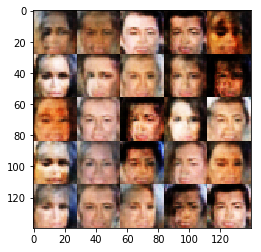

Epoch 1/1... Discriminator Loss: 0.8310... Generator Loss: 2.3633
Epoch 1/1... Discriminator Loss: 0.7702... Generator Loss: 1.4434
Epoch 1/1... Discriminator Loss: 0.7837... Generator Loss: 1.4541
Epoch 1/1... Discriminator Loss: 1.3603... Generator Loss: 0.4841
Epoch 1/1... Discriminator Loss: 1.5596... Generator Loss: 0.4619
Epoch 1/1... Discriminator Loss: 0.8746... Generator Loss: 1.8855
Epoch 1/1... Discriminator Loss: 0.9036... Generator Loss: 1.0889
Epoch 1/1... Discriminator Loss: 1.2367... Generator Loss: 1.9139
Epoch 1/1... Discriminator Loss: 0.9142... Generator Loss: 1.3044
Epoch 1/1... Discriminator Loss: 0.8033... Generator Loss: 1.6341


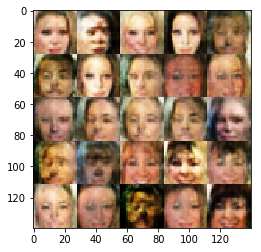

Epoch 1/1... Discriminator Loss: 0.7221... Generator Loss: 1.2347
Epoch 1/1... Discriminator Loss: 0.9793... Generator Loss: 0.8919
Epoch 1/1... Discriminator Loss: 0.6259... Generator Loss: 1.6555
Epoch 1/1... Discriminator Loss: 0.7721... Generator Loss: 1.2515
Epoch 1/1... Discriminator Loss: 1.9121... Generator Loss: 0.2862
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.5322
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 0.9815
Epoch 1/1... Discriminator Loss: 0.8733... Generator Loss: 1.0296
Epoch 1/1... Discriminator Loss: 0.8564... Generator Loss: 1.2897
Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.6610


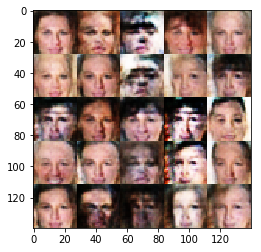

Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 0.9063
Epoch 1/1... Discriminator Loss: 1.1704... Generator Loss: 0.8799
Epoch 1/1... Discriminator Loss: 0.8276... Generator Loss: 1.2256
Epoch 1/1... Discriminator Loss: 1.5517... Generator Loss: 0.3649
Epoch 1/1... Discriminator Loss: 0.8844... Generator Loss: 1.8184
Epoch 1/1... Discriminator Loss: 0.8617... Generator Loss: 1.2585
Epoch 1/1... Discriminator Loss: 0.6995... Generator Loss: 1.8846
Epoch 1/1... Discriminator Loss: 0.8312... Generator Loss: 1.1651
Epoch 1/1... Discriminator Loss: 0.8099... Generator Loss: 1.9524
Epoch 1/1... Discriminator Loss: 0.8475... Generator Loss: 1.8108


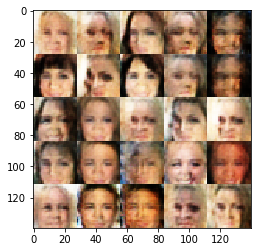

Epoch 1/1... Discriminator Loss: 0.8700... Generator Loss: 1.1674
Epoch 1/1... Discriminator Loss: 0.8852... Generator Loss: 1.2440
Epoch 1/1... Discriminator Loss: 1.0705... Generator Loss: 2.5331
Epoch 1/1... Discriminator Loss: 1.0724... Generator Loss: 1.0139
Epoch 1/1... Discriminator Loss: 0.9994... Generator Loss: 0.9052
Epoch 1/1... Discriminator Loss: 0.7507... Generator Loss: 2.4077
Epoch 1/1... Discriminator Loss: 0.8049... Generator Loss: 1.9771
Epoch 1/1... Discriminator Loss: 0.9030... Generator Loss: 1.1490
Epoch 1/1... Discriminator Loss: 0.9478... Generator Loss: 1.2283
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 2.9220


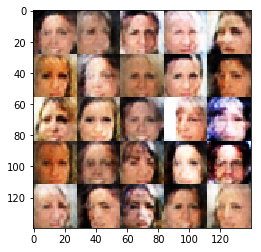

Epoch 1/1... Discriminator Loss: 0.9244... Generator Loss: 1.1350
Epoch 1/1... Discriminator Loss: 1.1028... Generator Loss: 0.7895
Epoch 1/1... Discriminator Loss: 0.7394... Generator Loss: 1.4830
Epoch 1/1... Discriminator Loss: 1.5370... Generator Loss: 0.4002
Epoch 1/1... Discriminator Loss: 0.9143... Generator Loss: 1.7659
Epoch 1/1... Discriminator Loss: 0.8942... Generator Loss: 1.1815
Epoch 1/1... Discriminator Loss: 1.1611... Generator Loss: 0.8105
Epoch 1/1... Discriminator Loss: 0.8203... Generator Loss: 1.6041
Epoch 1/1... Discriminator Loss: 0.8046... Generator Loss: 2.4732
Epoch 1/1... Discriminator Loss: 0.7291... Generator Loss: 2.5773


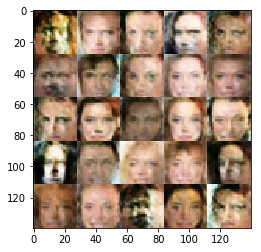

Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.6637
Epoch 1/1... Discriminator Loss: 0.7574... Generator Loss: 1.6235
Epoch 1/1... Discriminator Loss: 1.0158... Generator Loss: 1.0185
Epoch 1/1... Discriminator Loss: 0.9366... Generator Loss: 1.0881
Epoch 1/1... Discriminator Loss: 0.6950... Generator Loss: 1.8419
Epoch 1/1... Discriminator Loss: 1.0691... Generator Loss: 0.8562
Epoch 1/1... Discriminator Loss: 0.9654... Generator Loss: 1.0930
Epoch 1/1... Discriminator Loss: 0.9418... Generator Loss: 2.2962
Epoch 1/1... Discriminator Loss: 0.7236... Generator Loss: 2.4241
Epoch 1/1... Discriminator Loss: 0.6316... Generator Loss: 2.0086


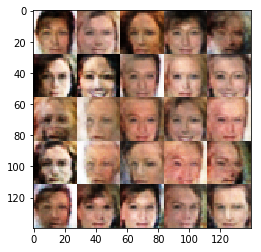

Epoch 1/1... Discriminator Loss: 0.8840... Generator Loss: 1.1326
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 0.7340
Epoch 1/1... Discriminator Loss: 0.7960... Generator Loss: 2.0681
Epoch 1/1... Discriminator Loss: 0.7236... Generator Loss: 2.0626
Epoch 1/1... Discriminator Loss: 1.4742... Generator Loss: 3.4799
Epoch 1/1... Discriminator Loss: 0.9836... Generator Loss: 1.2162
Epoch 1/1... Discriminator Loss: 1.2379... Generator Loss: 0.6326
Epoch 1/1... Discriminator Loss: 1.0880... Generator Loss: 1.7275
Epoch 1/1... Discriminator Loss: 0.7529... Generator Loss: 2.5726
Epoch 1/1... Discriminator Loss: 1.1942... Generator Loss: 0.5526


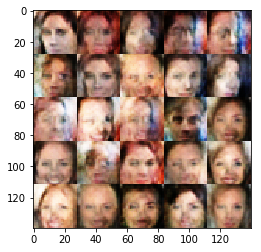

Epoch 1/1... Discriminator Loss: 0.8900... Generator Loss: 1.0844
Epoch 1/1... Discriminator Loss: 0.8256... Generator Loss: 1.1148
Epoch 1/1... Discriminator Loss: 0.8929... Generator Loss: 2.8652
Epoch 1/1... Discriminator Loss: 1.7588... Generator Loss: 0.4114
Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 1.2834
Epoch 1/1... Discriminator Loss: 0.9364... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 1.1592... Generator Loss: 1.4347
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.6261
Epoch 1/1... Discriminator Loss: 0.8848... Generator Loss: 0.9882
Epoch 1/1... Discriminator Loss: 1.3412... Generator Loss: 2.6698


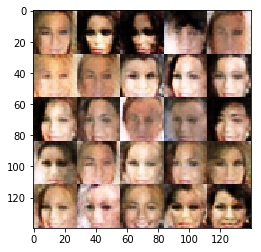

Epoch 1/1... Discriminator Loss: 0.9096... Generator Loss: 1.1505
Epoch 1/1... Discriminator Loss: 1.3499... Generator Loss: 0.6324
Epoch 1/1... Discriminator Loss: 0.9710... Generator Loss: 1.0423
Epoch 1/1... Discriminator Loss: 0.8394... Generator Loss: 1.9532
Epoch 1/1... Discriminator Loss: 0.9172... Generator Loss: 1.1008
Epoch 1/1... Discriminator Loss: 0.7206... Generator Loss: 2.1833
Epoch 1/1... Discriminator Loss: 0.9615... Generator Loss: 1.8421
Epoch 1/1... Discriminator Loss: 0.7057... Generator Loss: 2.8370
Epoch 1/1... Discriminator Loss: 0.8453... Generator Loss: 1.6438
Epoch 1/1... Discriminator Loss: 0.9422... Generator Loss: 2.3678


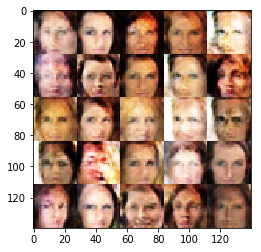

Epoch 1/1... Discriminator Loss: 0.8422... Generator Loss: 1.1912
Epoch 1/1... Discriminator Loss: 1.6187... Generator Loss: 0.5429
Epoch 1/1... Discriminator Loss: 1.1731... Generator Loss: 1.0579
Epoch 1/1... Discriminator Loss: 0.7624... Generator Loss: 1.2400
Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 0.6422
Epoch 1/1... Discriminator Loss: 1.4400... Generator Loss: 0.5061
Epoch 1/1... Discriminator Loss: 1.1121... Generator Loss: 2.2480
Epoch 1/1... Discriminator Loss: 0.8406... Generator Loss: 2.8187
Epoch 1/1... Discriminator Loss: 1.0140... Generator Loss: 1.1536
Epoch 1/1... Discriminator Loss: 0.7566... Generator Loss: 1.9341


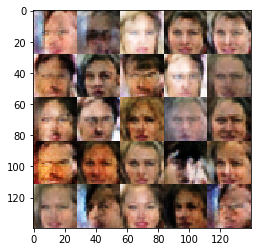

Epoch 1/1... Discriminator Loss: 0.9318... Generator Loss: 1.1150
Epoch 1/1... Discriminator Loss: 0.9277... Generator Loss: 0.8676
Epoch 1/1... Discriminator Loss: 0.8295... Generator Loss: 1.4495
Epoch 1/1... Discriminator Loss: 0.9477... Generator Loss: 1.1143
Epoch 1/1... Discriminator Loss: 0.8114... Generator Loss: 1.1652
Epoch 1/1... Discriminator Loss: 0.7548... Generator Loss: 1.7337
Epoch 1/1... Discriminator Loss: 1.1012... Generator Loss: 0.7172
Epoch 1/1... Discriminator Loss: 1.3980... Generator Loss: 0.6619
Epoch 1/1... Discriminator Loss: 0.7433... Generator Loss: 1.5856
Epoch 1/1... Discriminator Loss: 1.3563... Generator Loss: 3.1347


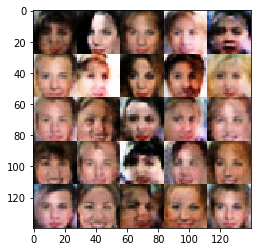

Epoch 1/1... Discriminator Loss: 0.9177... Generator Loss: 1.3629
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.5513
Epoch 1/1... Discriminator Loss: 0.9867... Generator Loss: 0.9715
Epoch 1/1... Discriminator Loss: 0.7818... Generator Loss: 1.1889
Epoch 1/1... Discriminator Loss: 0.9414... Generator Loss: 1.5018
Epoch 1/1... Discriminator Loss: 1.2556... Generator Loss: 0.7559
Epoch 1/1... Discriminator Loss: 1.0750... Generator Loss: 0.7363
Epoch 1/1... Discriminator Loss: 1.1229... Generator Loss: 0.8666
Epoch 1/1... Discriminator Loss: 0.8756... Generator Loss: 1.8626
Epoch 1/1... Discriminator Loss: 0.8385... Generator Loss: 1.3003


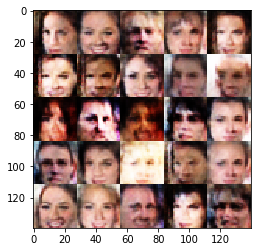

Epoch 1/1... Discriminator Loss: 0.9460... Generator Loss: 0.9160
Epoch 1/1... Discriminator Loss: 0.8381... Generator Loss: 1.2597
Epoch 1/1... Discriminator Loss: 0.7361... Generator Loss: 1.6631
Epoch 1/1... Discriminator Loss: 1.0302... Generator Loss: 0.8061
Epoch 1/1... Discriminator Loss: 0.9374... Generator Loss: 1.6098
Epoch 1/1... Discriminator Loss: 1.1117... Generator Loss: 0.8659
Epoch 1/1... Discriminator Loss: 0.6370... Generator Loss: 1.7189
Epoch 1/1... Discriminator Loss: 1.9269... Generator Loss: 0.2578
Epoch 1/1... Discriminator Loss: 0.9020... Generator Loss: 1.1976
Epoch 1/1... Discriminator Loss: 0.7536... Generator Loss: 1.6396


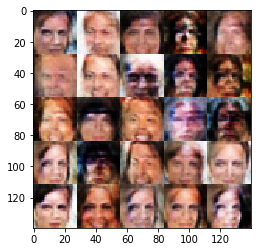

Epoch 1/1... Discriminator Loss: 0.5712... Generator Loss: 2.3856
Epoch 1/1... Discriminator Loss: 1.6879... Generator Loss: 0.4343
Epoch 1/1... Discriminator Loss: 1.0052... Generator Loss: 2.9340
Epoch 1/1... Discriminator Loss: 0.5703... Generator Loss: 1.8732
Epoch 1/1... Discriminator Loss: 1.1164... Generator Loss: 0.7278
Epoch 1/1... Discriminator Loss: 0.7686... Generator Loss: 2.1960
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.5768
Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 0.6027
Epoch 1/1... Discriminator Loss: 1.1013... Generator Loss: 0.8660
Epoch 1/1... Discriminator Loss: 1.0662... Generator Loss: 0.8901


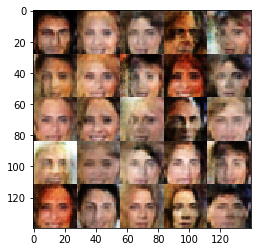

Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 2.9064
Epoch 1/1... Discriminator Loss: 0.9811... Generator Loss: 0.8881
Epoch 1/1... Discriminator Loss: 0.9846... Generator Loss: 1.0328
Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.5374
Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 1.0150
Epoch 1/1... Discriminator Loss: 0.8948... Generator Loss: 1.0835
Epoch 1/1... Discriminator Loss: 0.8348... Generator Loss: 1.6436
Epoch 1/1... Discriminator Loss: 1.2990... Generator Loss: 0.7685
Epoch 1/1... Discriminator Loss: 1.1300... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 0.7644... Generator Loss: 2.4053


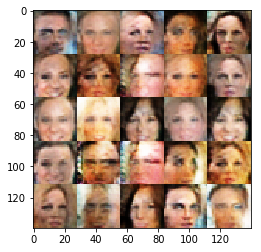

Epoch 1/1... Discriminator Loss: 0.8323... Generator Loss: 1.5642
Epoch 1/1... Discriminator Loss: 1.1209... Generator Loss: 0.6931
Epoch 1/1... Discriminator Loss: 0.9186... Generator Loss: 1.4824
Epoch 1/1... Discriminator Loss: 0.8992... Generator Loss: 1.5357
Epoch 1/1... Discriminator Loss: 0.7346... Generator Loss: 1.3035
Epoch 1/1... Discriminator Loss: 0.7278... Generator Loss: 2.5207
Epoch 1/1... Discriminator Loss: 1.2497... Generator Loss: 2.8003
Epoch 1/1... Discriminator Loss: 1.0656... Generator Loss: 0.8367
Epoch 1/1... Discriminator Loss: 0.8109... Generator Loss: 1.4936
Epoch 1/1... Discriminator Loss: 1.0583... Generator Loss: 2.5358


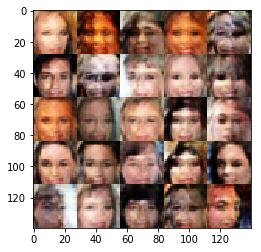

Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 2.0240
Epoch 1/1... Discriminator Loss: 0.7611... Generator Loss: 1.5487
Epoch 1/1... Discriminator Loss: 1.0243... Generator Loss: 1.0932
Epoch 1/1... Discriminator Loss: 1.3361... Generator Loss: 0.6402
Epoch 1/1... Discriminator Loss: 0.7212... Generator Loss: 1.9202
Epoch 1/1... Discriminator Loss: 1.2023... Generator Loss: 1.7031
Epoch 1/1... Discriminator Loss: 1.1781... Generator Loss: 0.7313
Epoch 1/1... Discriminator Loss: 0.7539... Generator Loss: 1.8493
Epoch 1/1... Discriminator Loss: 0.8012... Generator Loss: 1.5251
Epoch 1/1... Discriminator Loss: 0.7961... Generator Loss: 1.5230


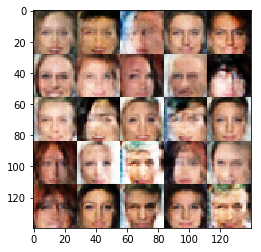

Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.5659
Epoch 1/1... Discriminator Loss: 1.0815... Generator Loss: 0.6749
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.6422
Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 2.2536
Epoch 1/1... Discriminator Loss: 0.9105... Generator Loss: 1.0488
Epoch 1/1... Discriminator Loss: 1.0088... Generator Loss: 1.0492
Epoch 1/1... Discriminator Loss: 0.8549... Generator Loss: 2.0641
Epoch 1/1... Discriminator Loss: 0.9388... Generator Loss: 0.9704
Epoch 1/1... Discriminator Loss: 1.0766... Generator Loss: 1.2234
Epoch 1/1... Discriminator Loss: 0.9647... Generator Loss: 2.6803


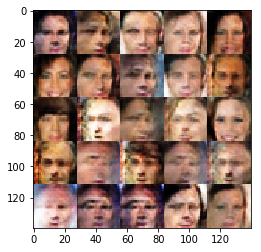

Epoch 1/1... Discriminator Loss: 0.8716... Generator Loss: 1.8325
Epoch 1/1... Discriminator Loss: 1.0048... Generator Loss: 1.0528
Epoch 1/1... Discriminator Loss: 0.8453... Generator Loss: 1.3760
Epoch 1/1... Discriminator Loss: 0.9071... Generator Loss: 1.9552
Epoch 1/1... Discriminator Loss: 0.5905... Generator Loss: 1.9808
Epoch 1/1... Discriminator Loss: 0.6552... Generator Loss: 2.0627
Epoch 1/1... Discriminator Loss: 1.8209... Generator Loss: 0.3181
Epoch 1/1... Discriminator Loss: 0.7378... Generator Loss: 2.0501
Epoch 1/1... Discriminator Loss: 0.6306... Generator Loss: 1.6089
Epoch 1/1... Discriminator Loss: 0.9480... Generator Loss: 1.0426


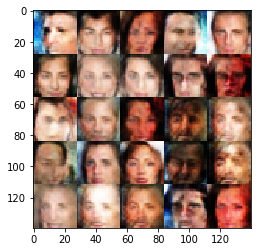

Epoch 1/1... Discriminator Loss: 1.0083... Generator Loss: 0.9512
Epoch 1/1... Discriminator Loss: 1.2457... Generator Loss: 0.9034
Epoch 1/1... Discriminator Loss: 0.8026... Generator Loss: 1.3927
Epoch 1/1... Discriminator Loss: 1.1302... Generator Loss: 0.7793
Epoch 1/1... Discriminator Loss: 1.0145... Generator Loss: 2.0340
Epoch 1/1... Discriminator Loss: 0.8039... Generator Loss: 1.2019
Epoch 1/1... Discriminator Loss: 0.7572... Generator Loss: 2.7936
Epoch 1/1... Discriminator Loss: 0.6350... Generator Loss: 1.8403
Epoch 1/1... Discriminator Loss: 1.1362... Generator Loss: 3.2265
Epoch 1/1... Discriminator Loss: 0.5104... Generator Loss: 3.3461


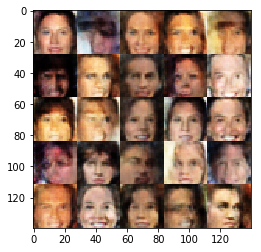

Epoch 1/1... Discriminator Loss: 1.0273... Generator Loss: 1.2464
Epoch 1/1... Discriminator Loss: 1.1561... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 0.8216... Generator Loss: 1.7759
Epoch 1/1... Discriminator Loss: 0.7232... Generator Loss: 3.3742
Epoch 1/1... Discriminator Loss: 0.6692... Generator Loss: 2.1999
Epoch 1/1... Discriminator Loss: 0.7792... Generator Loss: 1.6689
Epoch 1/1... Discriminator Loss: 0.7193... Generator Loss: 2.6523
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 0.6091
Epoch 1/1... Discriminator Loss: 1.1254... Generator Loss: 1.4219
Epoch 1/1... Discriminator Loss: 0.8762... Generator Loss: 1.3122


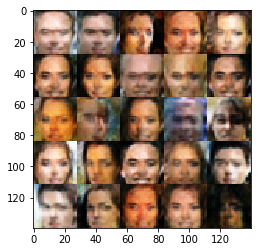

Epoch 1/1... Discriminator Loss: 0.6888... Generator Loss: 1.8732
Epoch 1/1... Discriminator Loss: 1.9640... Generator Loss: 0.2939
Epoch 1/1... Discriminator Loss: 0.8956... Generator Loss: 1.1121
Epoch 1/1... Discriminator Loss: 1.6139... Generator Loss: 0.4599
Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.7159
Epoch 1/1... Discriminator Loss: 1.2533... Generator Loss: 1.2380
Epoch 1/1... Discriminator Loss: 0.9088... Generator Loss: 1.0465
Epoch 1/1... Discriminator Loss: 0.9581... Generator Loss: 1.2008
Epoch 1/1... Discriminator Loss: 1.2405... Generator Loss: 0.7231
Epoch 1/1... Discriminator Loss: 0.9154... Generator Loss: 1.0501


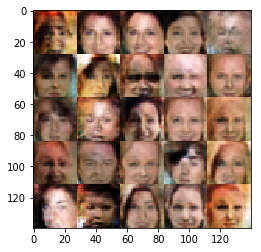

Epoch 1/1... Discriminator Loss: 0.6901... Generator Loss: 2.1866
Epoch 1/1... Discriminator Loss: 1.0677... Generator Loss: 1.2518
Epoch 1/1... Discriminator Loss: 1.0674... Generator Loss: 0.8833
Epoch 1/1... Discriminator Loss: 0.7526... Generator Loss: 2.8822
Epoch 1/1... Discriminator Loss: 2.0089... Generator Loss: 0.3002
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 1.8884
Epoch 1/1... Discriminator Loss: 0.7162... Generator Loss: 2.3342
Epoch 1/1... Discriminator Loss: 1.0956... Generator Loss: 0.9603
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 1.3833
Epoch 1/1... Discriminator Loss: 1.8567... Generator Loss: 0.3156


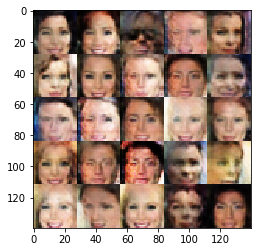

Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.0294... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 0.8044... Generator Loss: 1.3027
Epoch 1/1... Discriminator Loss: 1.1478... Generator Loss: 0.6464
Epoch 1/1... Discriminator Loss: 1.0686... Generator Loss: 0.8948
Epoch 1/1... Discriminator Loss: 1.1791... Generator Loss: 0.6539
Epoch 1/1... Discriminator Loss: 0.9383... Generator Loss: 1.1662
Epoch 1/1... Discriminator Loss: 0.9526... Generator Loss: 1.2529
Epoch 1/1... Discriminator Loss: 0.9134... Generator Loss: 4.2823
Epoch 1/1... Discriminator Loss: 0.7661... Generator Loss: 2.1235


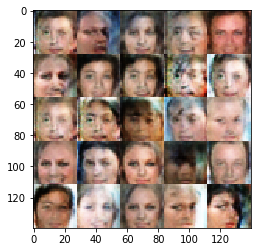

Epoch 1/1... Discriminator Loss: 1.6269... Generator Loss: 0.5439
Epoch 1/1... Discriminator Loss: 1.0557... Generator Loss: 0.8814
Epoch 1/1... Discriminator Loss: 1.0507... Generator Loss: 1.9526
Epoch 1/1... Discriminator Loss: 1.0070... Generator Loss: 0.9827
Epoch 1/1... Discriminator Loss: 1.6911... Generator Loss: 0.3756
Epoch 1/1... Discriminator Loss: 1.2541... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 0.7951... Generator Loss: 1.0556
Epoch 1/1... Discriminator Loss: 0.7849... Generator Loss: 1.4016
Epoch 1/1... Discriminator Loss: 1.0711... Generator Loss: 1.1024
Epoch 1/1... Discriminator Loss: 0.8711... Generator Loss: 1.1172


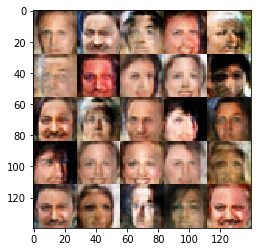

Epoch 1/1... Discriminator Loss: 1.0987... Generator Loss: 0.9848
Epoch 1/1... Discriminator Loss: 1.4566... Generator Loss: 0.5870
Epoch 1/1... Discriminator Loss: 1.3155... Generator Loss: 0.5984
Epoch 1/1... Discriminator Loss: 0.9862... Generator Loss: 1.0372
Epoch 1/1... Discriminator Loss: 1.1817... Generator Loss: 0.6713
Epoch 1/1... Discriminator Loss: 0.8680... Generator Loss: 1.4057
Epoch 1/1... Discriminator Loss: 0.7723... Generator Loss: 1.6232
Epoch 1/1... Discriminator Loss: 0.7173... Generator Loss: 2.2096
Epoch 1/1... Discriminator Loss: 0.7925... Generator Loss: 1.6675
Epoch 1/1... Discriminator Loss: 0.8660... Generator Loss: 1.1124


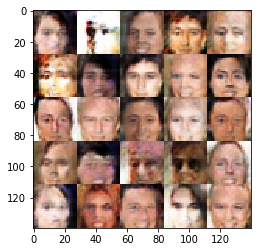

Epoch 1/1... Discriminator Loss: 1.1886... Generator Loss: 0.6183
Epoch 1/1... Discriminator Loss: 1.0377... Generator Loss: 2.1985
Epoch 1/1... Discriminator Loss: 0.8340... Generator Loss: 1.6024
Epoch 1/1... Discriminator Loss: 1.5092... Generator Loss: 0.4793
Epoch 1/1... Discriminator Loss: 1.0627... Generator Loss: 1.0191
Epoch 1/1... Discriminator Loss: 1.5250... Generator Loss: 0.4281
Epoch 1/1... Discriminator Loss: 1.0416... Generator Loss: 0.9930
Epoch 1/1... Discriminator Loss: 0.9083... Generator Loss: 1.2388
Epoch 1/1... Discriminator Loss: 0.7254... Generator Loss: 1.8138
Epoch 1/1... Discriminator Loss: 0.7092... Generator Loss: 2.7970


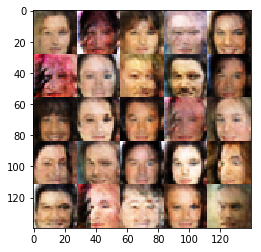

Epoch 1/1... Discriminator Loss: 0.7733... Generator Loss: 1.5362
Epoch 1/1... Discriminator Loss: 1.1340... Generator Loss: 0.8263
Epoch 1/1... Discriminator Loss: 1.4451... Generator Loss: 0.5908
Epoch 1/1... Discriminator Loss: 0.7335... Generator Loss: 2.9140
Epoch 1/1... Discriminator Loss: 1.2622... Generator Loss: 0.8306
Epoch 1/1... Discriminator Loss: 1.0631... Generator Loss: 0.8122
Epoch 1/1... Discriminator Loss: 0.9400... Generator Loss: 1.0050
Epoch 1/1... Discriminator Loss: 0.8844... Generator Loss: 1.3105
Epoch 1/1... Discriminator Loss: 1.1757... Generator Loss: 0.7398
Epoch 1/1... Discriminator Loss: 0.6871... Generator Loss: 1.8083


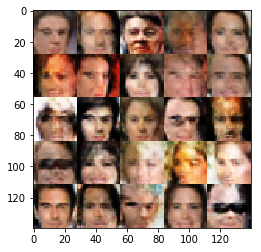

Epoch 1/1... Discriminator Loss: 0.6756... Generator Loss: 2.3065
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 0.7447
Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.4540
Epoch 1/1... Discriminator Loss: 1.1240... Generator Loss: 0.9188
Epoch 1/1... Discriminator Loss: 0.6872... Generator Loss: 2.2985
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.5223
Epoch 1/1... Discriminator Loss: 1.0962... Generator Loss: 0.8838
Epoch 1/1... Discriminator Loss: 0.9789... Generator Loss: 0.8338
Epoch 1/1... Discriminator Loss: 0.8398... Generator Loss: 1.2889
Epoch 1/1... Discriminator Loss: 1.4548... Generator Loss: 0.5111


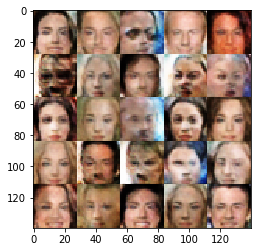

Epoch 1/1... Discriminator Loss: 0.8247... Generator Loss: 1.4836
Epoch 1/1... Discriminator Loss: 1.2335... Generator Loss: 3.1114
Epoch 1/1... Discriminator Loss: 1.0127... Generator Loss: 0.9430
Epoch 1/1... Discriminator Loss: 1.0537... Generator Loss: 0.8686
Epoch 1/1... Discriminator Loss: 0.9100... Generator Loss: 0.9790
Epoch 1/1... Discriminator Loss: 0.9093... Generator Loss: 1.1779
Epoch 1/1... Discriminator Loss: 0.7403... Generator Loss: 1.4412
Epoch 1/1... Discriminator Loss: 0.6630... Generator Loss: 1.6003
Epoch 1/1... Discriminator Loss: 0.6899... Generator Loss: 1.7645
Epoch 1/1... Discriminator Loss: 1.2059... Generator Loss: 2.4944


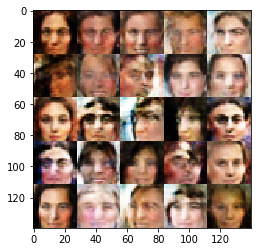

Epoch 1/1... Discriminator Loss: 1.1745... Generator Loss: 0.7741
Epoch 1/1... Discriminator Loss: 0.9187... Generator Loss: 2.0570
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.3959
Epoch 1/1... Discriminator Loss: 1.6060... Generator Loss: 0.4267
Epoch 1/1... Discriminator Loss: 0.8426... Generator Loss: 1.7548
Epoch 1/1... Discriminator Loss: 0.7534... Generator Loss: 2.0130
Epoch 1/1... Discriminator Loss: 1.0696... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 0.9236... Generator Loss: 1.3783
Epoch 1/1... Discriminator Loss: 0.7700... Generator Loss: 1.2572
Epoch 1/1... Discriminator Loss: 0.9190... Generator Loss: 1.4437


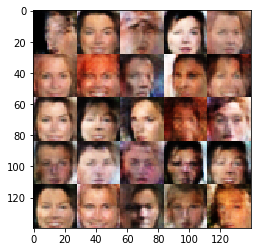

Epoch 1/1... Discriminator Loss: 0.6764... Generator Loss: 2.3499
Epoch 1/1... Discriminator Loss: 1.0030... Generator Loss: 1.1695
Epoch 1/1... Discriminator Loss: 1.1385... Generator Loss: 0.8860
Epoch 1/1... Discriminator Loss: 0.8860... Generator Loss: 2.3216
Epoch 1/1... Discriminator Loss: 1.0479... Generator Loss: 1.0580
Epoch 1/1... Discriminator Loss: 1.6259... Generator Loss: 0.4318
Epoch 1/1... Discriminator Loss: 0.8450... Generator Loss: 1.4371
Epoch 1/1... Discriminator Loss: 1.0420... Generator Loss: 0.7228
Epoch 1/1... Discriminator Loss: 1.0062... Generator Loss: 2.8046
Epoch 1/1... Discriminator Loss: 1.5570... Generator Loss: 0.6016


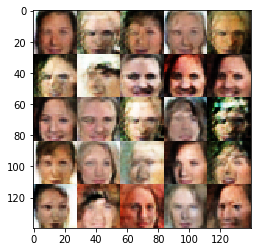

Epoch 1/1... Discriminator Loss: 0.9557... Generator Loss: 0.9742
Epoch 1/1... Discriminator Loss: 0.9749... Generator Loss: 2.2958
Epoch 1/1... Discriminator Loss: 0.7160... Generator Loss: 1.7589
Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 0.7529
Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.5916
Epoch 1/1... Discriminator Loss: 0.6509... Generator Loss: 1.4878
Epoch 1/1... Discriminator Loss: 0.9738... Generator Loss: 1.1422
Epoch 1/1... Discriminator Loss: 1.6214... Generator Loss: 0.5062
Epoch 1/1... Discriminator Loss: 1.1309... Generator Loss: 0.9456
Epoch 1/1... Discriminator Loss: 0.9180... Generator Loss: 0.9494


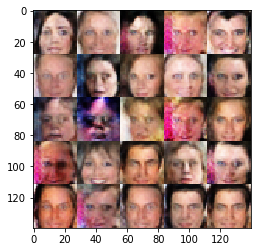

Epoch 1/1... Discriminator Loss: 1.2398... Generator Loss: 0.5919
Epoch 1/1... Discriminator Loss: 0.9225... Generator Loss: 1.4092
Epoch 1/1... Discriminator Loss: 0.6867... Generator Loss: 2.4745
Epoch 1/1... Discriminator Loss: 0.9815... Generator Loss: 1.1393
Epoch 1/1... Discriminator Loss: 1.3639... Generator Loss: 0.4887
Epoch 1/1... Discriminator Loss: 0.8899... Generator Loss: 1.1872
Epoch 1/1... Discriminator Loss: 0.9673... Generator Loss: 1.1797
Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 0.7307
Epoch 1/1... Discriminator Loss: 1.8493... Generator Loss: 0.3542
Epoch 1/1... Discriminator Loss: 1.4667... Generator Loss: 0.5763


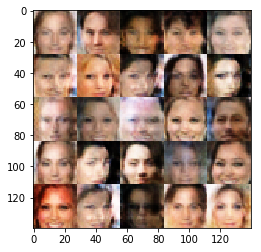

Epoch 1/1... Discriminator Loss: 0.6362... Generator Loss: 1.7152
Epoch 1/1... Discriminator Loss: 0.7210... Generator Loss: 1.8492
Epoch 1/1... Discriminator Loss: 0.9829... Generator Loss: 0.7992
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 0.7610
Epoch 1/1... Discriminator Loss: 0.7687... Generator Loss: 1.3625
Epoch 1/1... Discriminator Loss: 0.9578... Generator Loss: 1.1136
Epoch 1/1... Discriminator Loss: 1.0356... Generator Loss: 1.0278
Epoch 1/1... Discriminator Loss: 1.6310... Generator Loss: 0.4408
Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.5609
Epoch 1/1... Discriminator Loss: 0.6438... Generator Loss: 1.9262


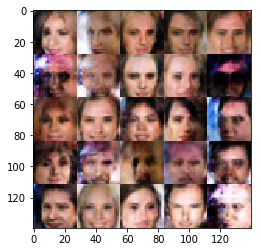

Epoch 1/1... Discriminator Loss: 0.8905... Generator Loss: 0.8696
Epoch 1/1... Discriminator Loss: 0.9009... Generator Loss: 2.5869
Epoch 1/1... Discriminator Loss: 0.7066... Generator Loss: 1.8633
Epoch 1/1... Discriminator Loss: 0.9166... Generator Loss: 1.6735
Epoch 1/1... Discriminator Loss: 1.5317... Generator Loss: 0.4626
Epoch 1/1... Discriminator Loss: 0.9499... Generator Loss: 1.0379
Epoch 1/1... Discriminator Loss: 0.8948... Generator Loss: 1.3331
Epoch 1/1... Discriminator Loss: 0.7044... Generator Loss: 1.6946
Epoch 1/1... Discriminator Loss: 0.6778... Generator Loss: 2.2070
Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.5038


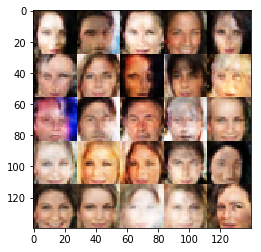

Epoch 1/1... Discriminator Loss: 0.9607... Generator Loss: 1.4448
Epoch 1/1... Discriminator Loss: 1.3771... Generator Loss: 0.6122
Epoch 1/1... Discriminator Loss: 0.7729... Generator Loss: 1.4391
Epoch 1/1... Discriminator Loss: 0.8074... Generator Loss: 1.5019
Epoch 1/1... Discriminator Loss: 0.8756... Generator Loss: 1.0742
Epoch 1/1... Discriminator Loss: 0.9649... Generator Loss: 1.2772
Epoch 1/1... Discriminator Loss: 0.9945... Generator Loss: 1.1305
Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 1.2461
Epoch 1/1... Discriminator Loss: 0.9352... Generator Loss: 0.9745
Epoch 1/1... Discriminator Loss: 0.8133... Generator Loss: 1.4354


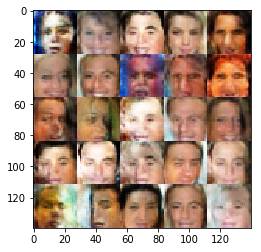

Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 2.1042
Epoch 1/1... Discriminator Loss: 1.0262... Generator Loss: 1.6159
Epoch 1/1... Discriminator Loss: 0.8153... Generator Loss: 1.2924
Epoch 1/1... Discriminator Loss: 0.8680... Generator Loss: 1.8327
Epoch 1/1... Discriminator Loss: 0.6849... Generator Loss: 1.7924
Epoch 1/1... Discriminator Loss: 0.8925... Generator Loss: 0.9527
Epoch 1/1... Discriminator Loss: 0.6227... Generator Loss: 2.1861
Epoch 1/1... Discriminator Loss: 0.9566... Generator Loss: 2.0760
Epoch 1/1... Discriminator Loss: 0.7717... Generator Loss: 2.2712
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.7357


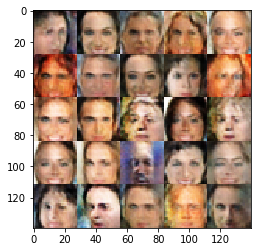

Epoch 1/1... Discriminator Loss: 1.4743... Generator Loss: 0.5740
Epoch 1/1... Discriminator Loss: 1.1435... Generator Loss: 1.1061
Epoch 1/1... Discriminator Loss: 1.0875... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 0.9970... Generator Loss: 0.8436
Epoch 1/1... Discriminator Loss: 1.1950... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.2130... Generator Loss: 0.6121
Epoch 1/1... Discriminator Loss: 0.8191... Generator Loss: 1.4638
Epoch 1/1... Discriminator Loss: 0.9399... Generator Loss: 2.7359
Epoch 1/1... Discriminator Loss: 0.9410... Generator Loss: 1.2585
Epoch 1/1... Discriminator Loss: 1.0736... Generator Loss: 2.4605


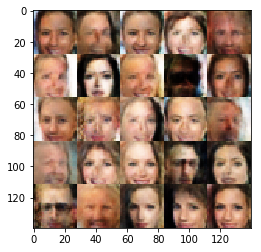

Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.7698
Epoch 1/1... Discriminator Loss: 0.7710... Generator Loss: 1.2505
Epoch 1/1... Discriminator Loss: 1.0709... Generator Loss: 0.9105
Epoch 1/1... Discriminator Loss: 0.9987... Generator Loss: 1.3979
Epoch 1/1... Discriminator Loss: 1.5400... Generator Loss: 0.6548
Epoch 1/1... Discriminator Loss: 1.1825... Generator Loss: 0.8620
Epoch 1/1... Discriminator Loss: 1.4643... Generator Loss: 0.4408
Epoch 1/1... Discriminator Loss: 0.9639... Generator Loss: 1.2370
Epoch 1/1... Discriminator Loss: 0.8882... Generator Loss: 0.9650
Epoch 1/1... Discriminator Loss: 1.1695... Generator Loss: 3.0461


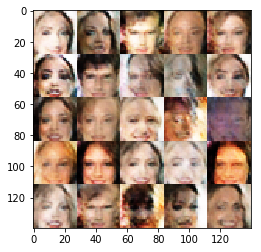

Epoch 1/1... Discriminator Loss: 0.8741... Generator Loss: 1.2673
Epoch 1/1... Discriminator Loss: 0.8333... Generator Loss: 1.0327
Epoch 1/1... Discriminator Loss: 1.0814... Generator Loss: 1.0521
Epoch 1/1... Discriminator Loss: 0.9977... Generator Loss: 0.9142
Epoch 1/1... Discriminator Loss: 0.8862... Generator Loss: 2.0495
Epoch 1/1... Discriminator Loss: 0.8688... Generator Loss: 0.9000
Epoch 1/1... Discriminator Loss: 0.8668... Generator Loss: 1.3925
Epoch 1/1... Discriminator Loss: 0.6787... Generator Loss: 1.9396
Epoch 1/1... Discriminator Loss: 0.8442... Generator Loss: 2.3384
Epoch 1/1... Discriminator Loss: 1.1458... Generator Loss: 2.9436


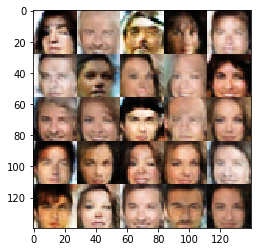

Epoch 1/1... Discriminator Loss: 1.0037... Generator Loss: 1.3971
Epoch 1/1... Discriminator Loss: 1.0095... Generator Loss: 0.8844
Epoch 1/1... Discriminator Loss: 0.9200... Generator Loss: 0.9995
Epoch 1/1... Discriminator Loss: 0.8629... Generator Loss: 1.4672
Epoch 1/1... Discriminator Loss: 1.1916... Generator Loss: 0.7395
Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.8008
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 0.8490... Generator Loss: 1.1040
Epoch 1/1... Discriminator Loss: 1.3164... Generator Loss: 0.6070
Epoch 1/1... Discriminator Loss: 0.7858... Generator Loss: 1.2316


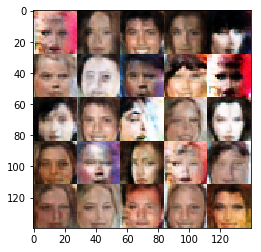

Epoch 1/1... Discriminator Loss: 0.8088... Generator Loss: 1.3594
Epoch 1/1... Discriminator Loss: 1.1008... Generator Loss: 0.7397
Epoch 1/1... Discriminator Loss: 0.8303... Generator Loss: 1.2045
Epoch 1/1... Discriminator Loss: 1.1155... Generator Loss: 0.7277
Epoch 1/1... Discriminator Loss: 0.6969... Generator Loss: 2.9066
Epoch 1/1... Discriminator Loss: 1.0670... Generator Loss: 0.8310
Epoch 1/1... Discriminator Loss: 0.8607... Generator Loss: 1.1348
Epoch 1/1... Discriminator Loss: 0.5910... Generator Loss: 2.7318
Epoch 1/1... Discriminator Loss: 1.2539... Generator Loss: 1.8272
Epoch 1/1... Discriminator Loss: 0.7681... Generator Loss: 2.0696


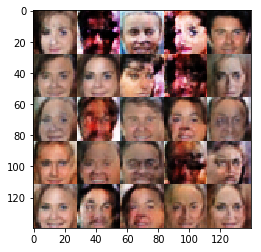

Epoch 1/1... Discriminator Loss: 0.9888... Generator Loss: 1.1909
Epoch 1/1... Discriminator Loss: 0.7976... Generator Loss: 1.2486
Epoch 1/1... Discriminator Loss: 1.0171... Generator Loss: 1.6635
Epoch 1/1... Discriminator Loss: 0.8169... Generator Loss: 1.8453
Epoch 1/1... Discriminator Loss: 0.8095... Generator Loss: 1.5451
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.5619
Epoch 1/1... Discriminator Loss: 0.9355... Generator Loss: 1.3892
Epoch 1/1... Discriminator Loss: 0.7421... Generator Loss: 1.6729
Epoch 1/1... Discriminator Loss: 0.9441... Generator Loss: 1.4970
Epoch 1/1... Discriminator Loss: 1.7026... Generator Loss: 0.4696


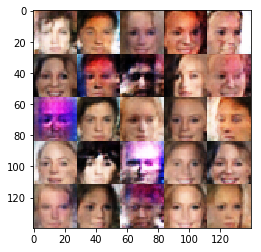

Epoch 1/1... Discriminator Loss: 1.0118... Generator Loss: 1.0845
Epoch 1/1... Discriminator Loss: 0.7922... Generator Loss: 2.2956
Epoch 1/1... Discriminator Loss: 0.9375... Generator Loss: 1.3942
Epoch 1/1... Discriminator Loss: 1.2845... Generator Loss: 0.5768
Epoch 1/1... Discriminator Loss: 1.0799... Generator Loss: 0.9687
Epoch 1/1... Discriminator Loss: 1.3374... Generator Loss: 0.4606
Epoch 1/1... Discriminator Loss: 0.8768... Generator Loss: 1.3112
Epoch 1/1... Discriminator Loss: 1.5128... Generator Loss: 0.5438
Epoch 1/1... Discriminator Loss: 0.9531... Generator Loss: 0.8726
Epoch 1/1... Discriminator Loss: 0.6845... Generator Loss: 1.9671


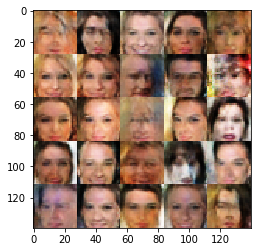

Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 0.6726... Generator Loss: 1.4875
Epoch 1/1... Discriminator Loss: 1.2278... Generator Loss: 0.6627
Epoch 1/1... Discriminator Loss: 0.7948... Generator Loss: 2.3606
Epoch 1/1... Discriminator Loss: 0.9384... Generator Loss: 1.0345
Epoch 1/1... Discriminator Loss: 0.8891... Generator Loss: 1.7551
Epoch 1/1... Discriminator Loss: 0.7998... Generator Loss: 1.3194
Epoch 1/1... Discriminator Loss: 0.8800... Generator Loss: 1.0813
Epoch 1/1... Discriminator Loss: 0.7245... Generator Loss: 1.9966
Epoch 1/1... Discriminator Loss: 1.5614... Generator Loss: 0.5189


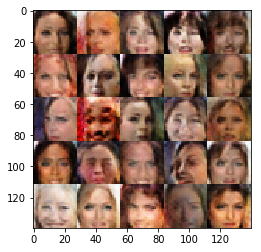

Epoch 1/1... Discriminator Loss: 1.1609... Generator Loss: 2.0327
Epoch 1/1... Discriminator Loss: 1.2477... Generator Loss: 0.6669
Epoch 1/1... Discriminator Loss: 0.8600... Generator Loss: 1.8588
Epoch 1/1... Discriminator Loss: 1.0250... Generator Loss: 0.7997
Epoch 1/1... Discriminator Loss: 0.9420... Generator Loss: 1.3024
Epoch 1/1... Discriminator Loss: 0.7077... Generator Loss: 2.2311
Epoch 1/1... Discriminator Loss: 1.0802... Generator Loss: 0.9075
Epoch 1/1... Discriminator Loss: 0.7045... Generator Loss: 1.9768
Epoch 1/1... Discriminator Loss: 1.0692... Generator Loss: 1.3246
Epoch 1/1... Discriminator Loss: 0.8739... Generator Loss: 1.3769


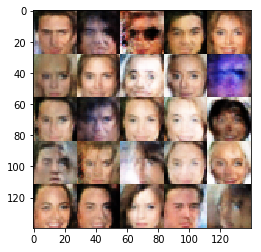

Epoch 1/1... Discriminator Loss: 1.2943... Generator Loss: 0.6132
Epoch 1/1... Discriminator Loss: 0.6836... Generator Loss: 2.2045
Epoch 1/1... Discriminator Loss: 0.7885... Generator Loss: 1.6141
Epoch 1/1... Discriminator Loss: 0.8139... Generator Loss: 1.4132
Epoch 1/1... Discriminator Loss: 0.7035... Generator Loss: 2.4419
Epoch 1/1... Discriminator Loss: 1.0967... Generator Loss: 3.3486
Epoch 1/1... Discriminator Loss: 0.8970... Generator Loss: 1.0113
Epoch 1/1... Discriminator Loss: 0.5258... Generator Loss: 2.7940
Epoch 1/1... Discriminator Loss: 0.9423... Generator Loss: 1.3241
Epoch 1/1... Discriminator Loss: 1.1734... Generator Loss: 1.4508


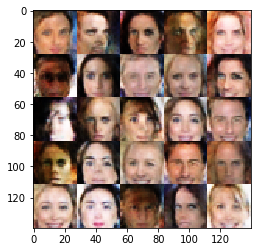

Epoch 1/1... Discriminator Loss: 1.0984... Generator Loss: 0.9785
Epoch 1/1... Discriminator Loss: 1.7414... Generator Loss: 0.4033
Epoch 1/1... Discriminator Loss: 1.0476... Generator Loss: 0.9027
Epoch 1/1... Discriminator Loss: 0.9702... Generator Loss: 1.3972
Epoch 1/1... Discriminator Loss: 0.7236... Generator Loss: 1.5080
Epoch 1/1... Discriminator Loss: 0.7774... Generator Loss: 2.1940
Epoch 1/1... Discriminator Loss: 1.3349... Generator Loss: 0.6435
Epoch 1/1... Discriminator Loss: 1.2497... Generator Loss: 0.6840
Epoch 1/1... Discriminator Loss: 1.0516... Generator Loss: 1.6127
Epoch 1/1... Discriminator Loss: 0.9780... Generator Loss: 1.6833


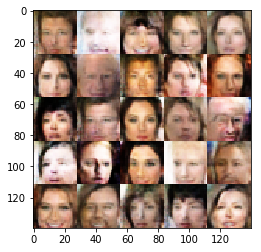

Epoch 1/1... Discriminator Loss: 0.8464... Generator Loss: 1.6752
Epoch 1/1... Discriminator Loss: 0.9625... Generator Loss: 2.2257
Epoch 1/1... Discriminator Loss: 1.2454... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 0.7616... Generator Loss: 1.3663
Epoch 1/1... Discriminator Loss: 1.0881... Generator Loss: 0.9502
Epoch 1/1... Discriminator Loss: 0.7267... Generator Loss: 1.4566
Epoch 1/1... Discriminator Loss: 0.7424... Generator Loss: 1.9378
Epoch 1/1... Discriminator Loss: 0.8583... Generator Loss: 1.8710
Epoch 1/1... Discriminator Loss: 1.2067... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 0.7565... Generator Loss: 1.3020


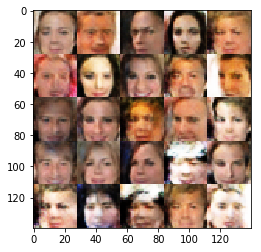

Epoch 1/1... Discriminator Loss: 0.8589... Generator Loss: 1.4662
Epoch 1/1... Discriminator Loss: 1.0189... Generator Loss: 1.1427
Epoch 1/1... Discriminator Loss: 1.0845... Generator Loss: 0.8238
Epoch 1/1... Discriminator Loss: 1.1186... Generator Loss: 0.8678
Epoch 1/1... Discriminator Loss: 1.0708... Generator Loss: 1.9715
Epoch 1/1... Discriminator Loss: 0.9731... Generator Loss: 1.3285
Epoch 1/1... Discriminator Loss: 1.1791... Generator Loss: 1.0413
Epoch 1/1... Discriminator Loss: 0.7424... Generator Loss: 1.6770
Epoch 1/1... Discriminator Loss: 1.0206... Generator Loss: 1.5433
Epoch 1/1... Discriminator Loss: 0.9520... Generator Loss: 0.8321


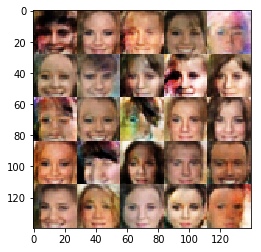

Epoch 1/1... Discriminator Loss: 1.2280... Generator Loss: 0.6524
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.5007
Epoch 1/1... Discriminator Loss: 0.8765... Generator Loss: 1.3629
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.5583
Epoch 1/1... Discriminator Loss: 1.2054... Generator Loss: 1.2404
Epoch 1/1... Discriminator Loss: 1.0050... Generator Loss: 1.1945
Epoch 1/1... Discriminator Loss: 1.2549... Generator Loss: 0.5916
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.6143
Epoch 1/1... Discriminator Loss: 0.8192... Generator Loss: 1.0983
Epoch 1/1... Discriminator Loss: 0.6623... Generator Loss: 1.7745


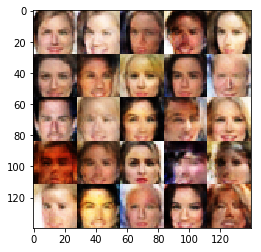

Epoch 1/1... Discriminator Loss: 1.2926... Generator Loss: 0.5499
Epoch 1/1... Discriminator Loss: 0.9840... Generator Loss: 1.4550
Epoch 1/1... Discriminator Loss: 1.0009... Generator Loss: 0.9837
Epoch 1/1... Discriminator Loss: 1.9806... Generator Loss: 0.2976
Epoch 1/1... Discriminator Loss: 1.0622... Generator Loss: 1.0750
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.8821
Epoch 1/1... Discriminator Loss: 1.1109... Generator Loss: 1.0394
Epoch 1/1... Discriminator Loss: 0.6255... Generator Loss: 1.5419
Epoch 1/1... Discriminator Loss: 0.8093... Generator Loss: 1.5949
Epoch 1/1... Discriminator Loss: 1.0587... Generator Loss: 1.3611


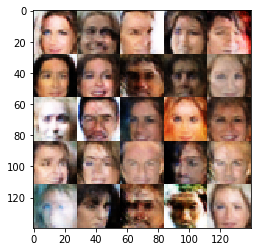

Epoch 1/1... Discriminator Loss: 1.2075... Generator Loss: 1.0153
Epoch 1/1... Discriminator Loss: 0.9799... Generator Loss: 0.9869
Epoch 1/1... Discriminator Loss: 1.0912... Generator Loss: 0.8886
Epoch 1/1... Discriminator Loss: 1.0868... Generator Loss: 0.9322
Epoch 1/1... Discriminator Loss: 1.5414... Generator Loss: 0.4485
Epoch 1/1... Discriminator Loss: 0.9925... Generator Loss: 1.3777
Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 1.0399... Generator Loss: 0.9110
Epoch 1/1... Discriminator Loss: 1.1531... Generator Loss: 0.8616
Epoch 1/1... Discriminator Loss: 1.0396... Generator Loss: 1.0524


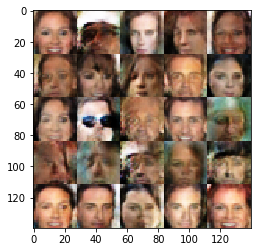

Epoch 1/1... Discriminator Loss: 0.9625... Generator Loss: 0.9800
Epoch 1/1... Discriminator Loss: 0.8447... Generator Loss: 1.2616
Epoch 1/1... Discriminator Loss: 1.6182... Generator Loss: 0.5006
Epoch 1/1... Discriminator Loss: 0.9498... Generator Loss: 2.5846
Epoch 1/1... Discriminator Loss: 1.0716... Generator Loss: 1.0007
Epoch 1/1... Discriminator Loss: 1.0397... Generator Loss: 1.1099
Epoch 1/1... Discriminator Loss: 0.9358... Generator Loss: 1.0847
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 0.6104
Epoch 1/1... Discriminator Loss: 0.8783... Generator Loss: 1.2939
Epoch 1/1... Discriminator Loss: 0.8935... Generator Loss: 1.2401


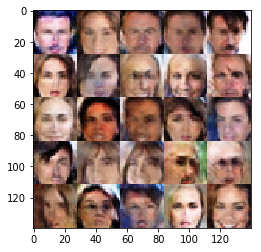

Epoch 1/1... Discriminator Loss: 1.1180... Generator Loss: 0.7836
Epoch 1/1... Discriminator Loss: 1.0450... Generator Loss: 0.9111
Epoch 1/1... Discriminator Loss: 1.0714... Generator Loss: 1.4205
Epoch 1/1... Discriminator Loss: 1.1484... Generator Loss: 0.9606
Epoch 1/1... Discriminator Loss: 0.9242... Generator Loss: 1.2849
Epoch 1/1... Discriminator Loss: 1.0389... Generator Loss: 1.5965
Epoch 1/1... Discriminator Loss: 1.1000... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.0534... Generator Loss: 0.8275
Epoch 1/1... Discriminator Loss: 0.8126... Generator Loss: 1.3997
Epoch 1/1... Discriminator Loss: 0.8278... Generator Loss: 2.0089


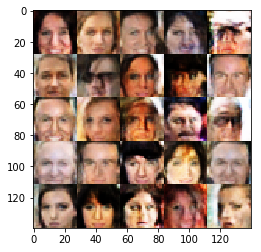

Epoch 1/1... Discriminator Loss: 1.3285... Generator Loss: 0.7144
Epoch 1/1... Discriminator Loss: 1.1311... Generator Loss: 0.7061
Epoch 1/1... Discriminator Loss: 0.9662... Generator Loss: 1.5028
Epoch 1/1... Discriminator Loss: 1.0735... Generator Loss: 0.6453
Epoch 1/1... Discriminator Loss: 1.1545... Generator Loss: 1.4931
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 1.0619
Epoch 1/1... Discriminator Loss: 0.9944... Generator Loss: 1.4622
Epoch 1/1... Discriminator Loss: 0.8781... Generator Loss: 1.6923
Epoch 1/1... Discriminator Loss: 1.1745... Generator Loss: 0.6360
Epoch 1/1... Discriminator Loss: 1.1755... Generator Loss: 0.8190


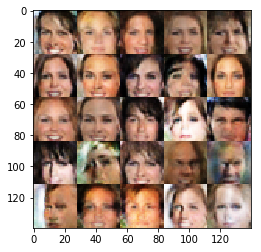

Epoch 1/1... Discriminator Loss: 0.9292... Generator Loss: 1.0853
Epoch 1/1... Discriminator Loss: 1.5856... Generator Loss: 0.5069
Epoch 1/1... Discriminator Loss: 0.9204... Generator Loss: 0.8990
Epoch 1/1... Discriminator Loss: 0.9842... Generator Loss: 2.0125
Epoch 1/1... Discriminator Loss: 0.9985... Generator Loss: 2.3055
Epoch 1/1... Discriminator Loss: 1.3549... Generator Loss: 0.5491
Epoch 1/1... Discriminator Loss: 1.1707... Generator Loss: 0.9100
Epoch 1/1... Discriminator Loss: 0.8455... Generator Loss: 1.5650
Epoch 1/1... Discriminator Loss: 1.1146... Generator Loss: 1.4880
Epoch 1/1... Discriminator Loss: 0.9741... Generator Loss: 1.2246


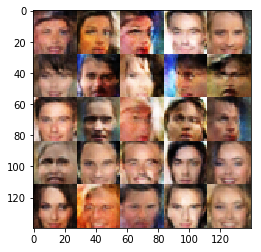

Epoch 1/1... Discriminator Loss: 1.8588... Generator Loss: 0.4246
Epoch 1/1... Discriminator Loss: 0.7991... Generator Loss: 2.1699
Epoch 1/1... Discriminator Loss: 2.1333... Generator Loss: 0.2079
Epoch 1/1... Discriminator Loss: 1.6754... Generator Loss: 0.4215
Epoch 1/1... Discriminator Loss: 0.9685... Generator Loss: 1.0461
Epoch 1/1... Discriminator Loss: 0.9059... Generator Loss: 1.4808
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 0.5213
Epoch 1/1... Discriminator Loss: 1.0002... Generator Loss: 1.0478
Epoch 1/1... Discriminator Loss: 0.8020... Generator Loss: 1.1436
Epoch 1/1... Discriminator Loss: 0.7444... Generator Loss: 1.8221


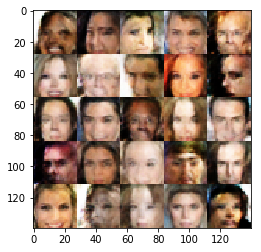

Epoch 1/1... Discriminator Loss: 0.8623... Generator Loss: 1.2499
Epoch 1/1... Discriminator Loss: 1.1031... Generator Loss: 0.8812
Epoch 1/1... Discriminator Loss: 0.8601... Generator Loss: 2.1355
Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 0.8246
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.6585
Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 0.6627... Generator Loss: 1.7816
Epoch 1/1... Discriminator Loss: 1.5791... Generator Loss: 0.5286
Epoch 1/1... Discriminator Loss: 0.9064... Generator Loss: 1.2250
Epoch 1/1... Discriminator Loss: 1.4125... Generator Loss: 0.6758


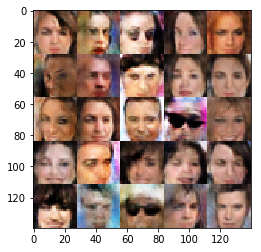

Epoch 1/1... Discriminator Loss: 0.9010... Generator Loss: 1.0070
Epoch 1/1... Discriminator Loss: 0.7872... Generator Loss: 1.7806
Epoch 1/1... Discriminator Loss: 0.8384... Generator Loss: 1.3367
Epoch 1/1... Discriminator Loss: 0.9783... Generator Loss: 1.1907
Epoch 1/1... Discriminator Loss: 1.4817... Generator Loss: 0.4765
Epoch 1/1... Discriminator Loss: 0.6936... Generator Loss: 1.5283
Epoch 1/1... Discriminator Loss: 1.0163... Generator Loss: 1.1065
Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 0.5854
Epoch 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.8120... Generator Loss: 0.3983


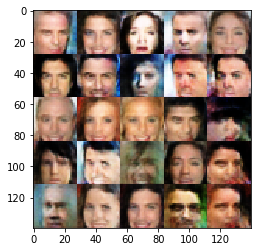

Epoch 1/1... Discriminator Loss: 0.7391... Generator Loss: 1.6620
Epoch 1/1... Discriminator Loss: 0.9473... Generator Loss: 1.0183
Epoch 1/1... Discriminator Loss: 1.4760... Generator Loss: 0.5343
Epoch 1/1... Discriminator Loss: 1.0805... Generator Loss: 1.3645
Epoch 1/1... Discriminator Loss: 1.0138... Generator Loss: 1.6445
Epoch 1/1... Discriminator Loss: 1.0321... Generator Loss: 1.0199
Epoch 1/1... Discriminator Loss: 0.8430... Generator Loss: 1.6820
Epoch 1/1... Discriminator Loss: 0.9122... Generator Loss: 1.9958
Epoch 1/1... Discriminator Loss: 1.3289... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 0.8844... Generator Loss: 1.0064


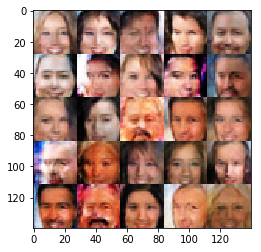

Epoch 1/1... Discriminator Loss: 0.7775... Generator Loss: 1.3781
Epoch 1/1... Discriminator Loss: 1.0462... Generator Loss: 0.7921
Epoch 1/1... Discriminator Loss: 0.9773... Generator Loss: 1.6786
Epoch 1/1... Discriminator Loss: 1.5579... Generator Loss: 0.4593
Epoch 1/1... Discriminator Loss: 0.8763... Generator Loss: 1.1170
Epoch 1/1... Discriminator Loss: 0.8607... Generator Loss: 1.2986
Epoch 1/1... Discriminator Loss: 1.1228... Generator Loss: 0.7433
Epoch 1/1... Discriminator Loss: 1.1391... Generator Loss: 0.6222
Epoch 1/1... Discriminator Loss: 0.9837... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 1.0616... Generator Loss: 0.7650


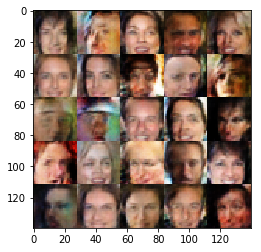

Epoch 1/1... Discriminator Loss: 1.5357... Generator Loss: 0.4845
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.5575
Epoch 1/1... Discriminator Loss: 1.0504... Generator Loss: 0.9134
Epoch 1/1... Discriminator Loss: 0.9629... Generator Loss: 1.1341
Epoch 1/1... Discriminator Loss: 0.9243... Generator Loss: 1.3390
Epoch 1/1... Discriminator Loss: 0.9502... Generator Loss: 1.8573
Epoch 1/1... Discriminator Loss: 1.6439... Generator Loss: 0.4000
Epoch 1/1... Discriminator Loss: 1.4494... Generator Loss: 0.5629
Epoch 1/1... Discriminator Loss: 0.8517... Generator Loss: 2.2856
Epoch 1/1... Discriminator Loss: 1.1544... Generator Loss: 0.6763


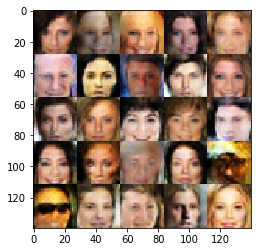

Epoch 1/1... Discriminator Loss: 0.8700... Generator Loss: 1.1596
Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 0.6395
Epoch 1/1... Discriminator Loss: 0.8485... Generator Loss: 1.3284
Epoch 1/1... Discriminator Loss: 0.9269... Generator Loss: 1.7668
Epoch 1/1... Discriminator Loss: 0.9732... Generator Loss: 1.0676
Epoch 1/1... Discriminator Loss: 1.0839... Generator Loss: 0.7222
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 0.8756... Generator Loss: 1.3108
Epoch 1/1... Discriminator Loss: 0.9701... Generator Loss: 0.9549
Epoch 1/1... Discriminator Loss: 1.1151... Generator Loss: 0.9008


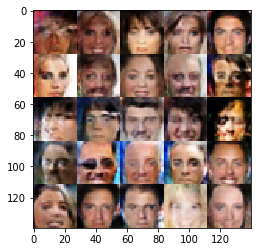

Epoch 1/1... Discriminator Loss: 1.0507... Generator Loss: 0.7080
Epoch 1/1... Discriminator Loss: 1.0525... Generator Loss: 1.5682
Epoch 1/1... Discriminator Loss: 1.6494... Generator Loss: 0.4567
Epoch 1/1... Discriminator Loss: 1.1092... Generator Loss: 2.1826
Epoch 1/1... Discriminator Loss: 0.7154... Generator Loss: 1.5109
Epoch 1/1... Discriminator Loss: 0.8859... Generator Loss: 1.0143
Epoch 1/1... Discriminator Loss: 1.1083... Generator Loss: 1.3122
Epoch 1/1... Discriminator Loss: 0.9402... Generator Loss: 1.1791
Epoch 1/1... Discriminator Loss: 0.7751... Generator Loss: 1.7678
Epoch 1/1... Discriminator Loss: 1.7243... Generator Loss: 0.5109


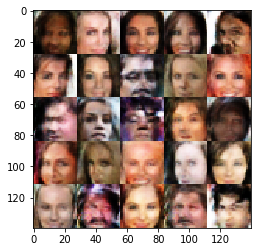

Epoch 1/1... Discriminator Loss: 0.9374... Generator Loss: 1.1854
Epoch 1/1... Discriminator Loss: 1.0010... Generator Loss: 1.1509
Epoch 1/1... Discriminator Loss: 1.0333... Generator Loss: 0.8298
Epoch 1/1... Discriminator Loss: 0.9200... Generator Loss: 1.4278
Epoch 1/1... Discriminator Loss: 1.2556... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 1.0179... Generator Loss: 0.9345
Epoch 1/1... Discriminator Loss: 1.2787... Generator Loss: 0.8190
Epoch 1/1... Discriminator Loss: 0.9883... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 0.8995... Generator Loss: 1.3061


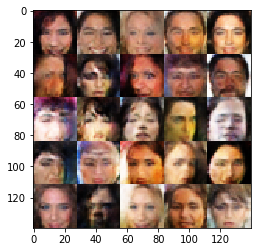

Epoch 1/1... Discriminator Loss: 0.9910... Generator Loss: 0.9050
Epoch 1/1... Discriminator Loss: 0.9753... Generator Loss: 1.5020
Epoch 1/1... Discriminator Loss: 1.0068... Generator Loss: 0.8922
Epoch 1/1... Discriminator Loss: 1.0381... Generator Loss: 0.9280
Epoch 1/1... Discriminator Loss: 0.9884... Generator Loss: 0.8214
Epoch 1/1... Discriminator Loss: 0.7428... Generator Loss: 1.3411
Epoch 1/1... Discriminator Loss: 1.0783... Generator Loss: 0.8807
Epoch 1/1... Discriminator Loss: 0.9878... Generator Loss: 1.1918
Epoch 1/1... Discriminator Loss: 0.8551... Generator Loss: 0.9689
Epoch 1/1... Discriminator Loss: 0.7399... Generator Loss: 1.5225


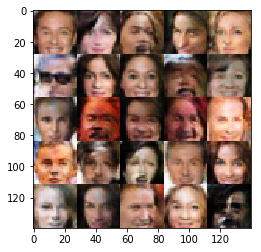

Epoch 1/1... Discriminator Loss: 1.0795... Generator Loss: 1.3738
Epoch 1/1... Discriminator Loss: 1.0017... Generator Loss: 1.0741
Epoch 1/1... Discriminator Loss: 0.9925... Generator Loss: 1.1285
Epoch 1/1... Discriminator Loss: 0.9657... Generator Loss: 1.1321
Epoch 1/1... Discriminator Loss: 0.9772... Generator Loss: 1.0716
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.6028
Epoch 1/1... Discriminator Loss: 0.7854... Generator Loss: 2.3002
Epoch 1/1... Discriminator Loss: 1.0781... Generator Loss: 0.8402
Epoch 1/1... Discriminator Loss: 0.8190... Generator Loss: 1.8770
Epoch 1/1... Discriminator Loss: 0.9950... Generator Loss: 1.1545


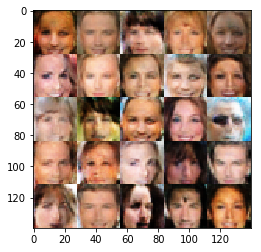

Epoch 1/1... Discriminator Loss: 1.0141... Generator Loss: 1.0126
Epoch 1/1... Discriminator Loss: 0.9597... Generator Loss: 0.9750
Epoch 1/1... Discriminator Loss: 1.5202... Generator Loss: 0.4009
Epoch 1/1... Discriminator Loss: 1.2348... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.0324... Generator Loss: 2.0695
Epoch 1/1... Discriminator Loss: 0.9266... Generator Loss: 1.1519
Epoch 1/1... Discriminator Loss: 1.1410... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.0724... Generator Loss: 1.3690
Epoch 1/1... Discriminator Loss: 0.9139... Generator Loss: 1.5009
Epoch 1/1... Discriminator Loss: 0.8487... Generator Loss: 1.5497


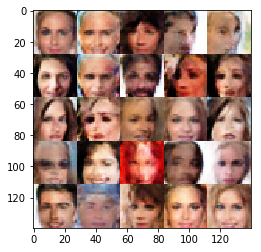

Epoch 1/1... Discriminator Loss: 0.7402... Generator Loss: 1.9369
Epoch 1/1... Discriminator Loss: 0.9769... Generator Loss: 2.1485
Epoch 1/1... Discriminator Loss: 1.1643... Generator Loss: 0.7067
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7117
Epoch 1/1... Discriminator Loss: 1.2847... Generator Loss: 0.6477
Epoch 1/1... Discriminator Loss: 1.1734... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 0.9451... Generator Loss: 1.0718
Epoch 1/1... Discriminator Loss: 0.9026... Generator Loss: 1.2825
Epoch 1/1... Discriminator Loss: 0.9883... Generator Loss: 0.9114
Epoch 1/1... Discriminator Loss: 1.5746... Generator Loss: 1.9814


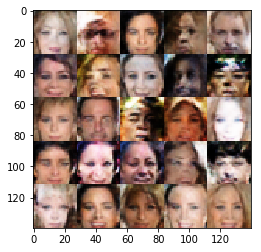

Epoch 1/1... Discriminator Loss: 1.7329... Generator Loss: 0.2802
Epoch 1/1... Discriminator Loss: 1.5462... Generator Loss: 0.4557
Epoch 1/1... Discriminator Loss: 1.0118... Generator Loss: 1.7752
Epoch 1/1... Discriminator Loss: 0.9984... Generator Loss: 1.1252
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.8034
Epoch 1/1... Discriminator Loss: 0.9951... Generator Loss: 0.9597
Epoch 1/1... Discriminator Loss: 0.9996... Generator Loss: 1.8002
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 0.8441
Epoch 1/1... Discriminator Loss: 1.3176... Generator Loss: 0.5880
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.5336


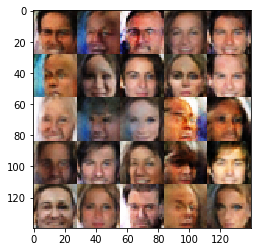

Epoch 1/1... Discriminator Loss: 1.2365... Generator Loss: 0.9445
Epoch 1/1... Discriminator Loss: 0.8641... Generator Loss: 1.6780
Epoch 1/1... Discriminator Loss: 0.9453... Generator Loss: 1.0641
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.5930
Epoch 1/1... Discriminator Loss: 0.8587... Generator Loss: 1.1903
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.6254
Epoch 1/1... Discriminator Loss: 1.2766... Generator Loss: 0.6621
Epoch 1/1... Discriminator Loss: 1.2063... Generator Loss: 0.8042
Epoch 1/1... Discriminator Loss: 0.8184... Generator Loss: 1.3587
Epoch 1/1... Discriminator Loss: 1.1329... Generator Loss: 1.0550


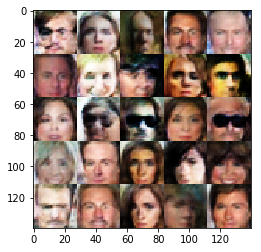

Epoch 1/1... Discriminator Loss: 0.8589... Generator Loss: 1.1279
Epoch 1/1... Discriminator Loss: 1.4985... Generator Loss: 0.3984
Epoch 1/1... Discriminator Loss: 0.8484... Generator Loss: 1.2869
Epoch 1/1... Discriminator Loss: 1.0687... Generator Loss: 0.9397
Epoch 1/1... Discriminator Loss: 0.8731... Generator Loss: 1.3692
Epoch 1/1... Discriminator Loss: 0.8266... Generator Loss: 1.0531
Epoch 1/1... Discriminator Loss: 1.0414... Generator Loss: 2.1729
Epoch 1/1... Discriminator Loss: 1.0239... Generator Loss: 1.2438
Epoch 1/1... Discriminator Loss: 0.8570... Generator Loss: 2.0907
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.7672


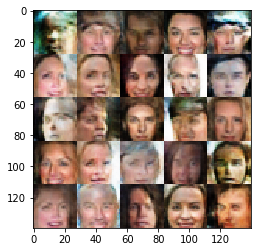

Epoch 1/1... Discriminator Loss: 1.2743... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.1866... Generator Loss: 1.0207
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.8075
Epoch 1/1... Discriminator Loss: 0.9596... Generator Loss: 1.1834
Epoch 1/1... Discriminator Loss: 1.3058... Generator Loss: 0.5385
Epoch 1/1... Discriminator Loss: 1.5347... Generator Loss: 0.5389
Epoch 1/1... Discriminator Loss: 0.8724... Generator Loss: 1.2517
Epoch 1/1... Discriminator Loss: 0.7862... Generator Loss: 1.3038
Epoch 1/1... Discriminator Loss: 1.0392... Generator Loss: 1.2814
Epoch 1/1... Discriminator Loss: 1.4990... Generator Loss: 0.5704


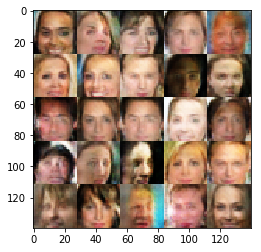

Epoch 1/1... Discriminator Loss: 0.8808... Generator Loss: 1.3909
Epoch 1/1... Discriminator Loss: 1.0265... Generator Loss: 1.3425
Epoch 1/1... Discriminator Loss: 1.0624... Generator Loss: 0.9788
Epoch 1/1... Discriminator Loss: 1.0685... Generator Loss: 1.3953
Epoch 1/1... Discriminator Loss: 1.1620... Generator Loss: 0.8092
Epoch 1/1... Discriminator Loss: 1.0951... Generator Loss: 0.7886
Epoch 1/1... Discriminator Loss: 1.5041... Generator Loss: 0.4684
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 1.2723
Epoch 1/1... Discriminator Loss: 1.0517... Generator Loss: 0.8176
Epoch 1/1... Discriminator Loss: 1.0130... Generator Loss: 0.9675


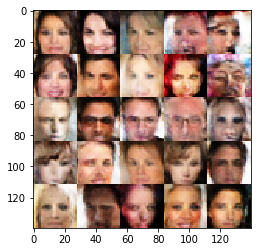

Epoch 1/1... Discriminator Loss: 1.3218... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 0.8803... Generator Loss: 1.1334
Epoch 1/1... Discriminator Loss: 1.0539... Generator Loss: 1.0289
Epoch 1/1... Discriminator Loss: 0.7904... Generator Loss: 1.4450
Epoch 1/1... Discriminator Loss: 0.9342... Generator Loss: 0.9742
Epoch 1/1... Discriminator Loss: 0.9569... Generator Loss: 1.0335
Epoch 1/1... Discriminator Loss: 0.9618... Generator Loss: 2.2215
Epoch 1/1... Discriminator Loss: 1.1392... Generator Loss: 0.8521
Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.7487
Epoch 1/1... Discriminator Loss: 1.0512... Generator Loss: 0.9722


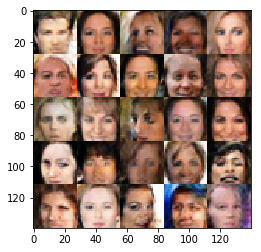

Epoch 1/1... Discriminator Loss: 0.7063... Generator Loss: 1.5320
Epoch 1/1... Discriminator Loss: 1.1704... Generator Loss: 2.7335
Epoch 1/1... Discriminator Loss: 0.8831... Generator Loss: 1.5113
Epoch 1/1... Discriminator Loss: 1.5775... Generator Loss: 0.4509
Epoch 1/1... Discriminator Loss: 0.7620... Generator Loss: 1.3383
Epoch 1/1... Discriminator Loss: 1.0564... Generator Loss: 1.4940
Epoch 1/1... Discriminator Loss: 1.2877... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 0.9803... Generator Loss: 1.3126
Epoch 1/1... Discriminator Loss: 1.1934... Generator Loss: 0.7765
Epoch 1/1... Discriminator Loss: 0.8417... Generator Loss: 1.5857


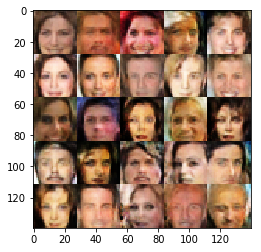

Epoch 1/1... Discriminator Loss: 0.9021... Generator Loss: 1.2763
Epoch 1/1... Discriminator Loss: 0.9641... Generator Loss: 1.0323
Epoch 1/1... Discriminator Loss: 1.2229... Generator Loss: 2.2229
Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 0.8114
Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 0.5934
Epoch 1/1... Discriminator Loss: 0.7147... Generator Loss: 1.7148
Epoch 1/1... Discriminator Loss: 0.9936... Generator Loss: 1.0012
Epoch 1/1... Discriminator Loss: 1.1522... Generator Loss: 0.7589
Epoch 1/1... Discriminator Loss: 0.9101... Generator Loss: 1.1872
Epoch 1/1... Discriminator Loss: 0.8550... Generator Loss: 1.2798


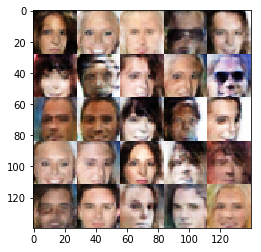

Epoch 1/1... Discriminator Loss: 1.1645... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 0.9317... Generator Loss: 1.3061
Epoch 1/1... Discriminator Loss: 1.4737... Generator Loss: 0.5562
Epoch 1/1... Discriminator Loss: 0.9796... Generator Loss: 1.2530
Epoch 1/1... Discriminator Loss: 0.9759... Generator Loss: 1.3728
Epoch 1/1... Discriminator Loss: 1.1759... Generator Loss: 0.9176
Epoch 1/1... Discriminator Loss: 1.1398... Generator Loss: 0.8841
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 1.0910
Epoch 1/1... Discriminator Loss: 1.4187... Generator Loss: 0.4672
Epoch 1/1... Discriminator Loss: 1.0250... Generator Loss: 1.0015


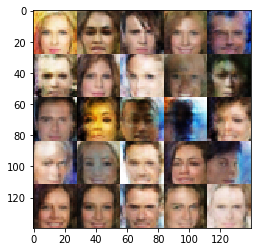

Epoch 1/1... Discriminator Loss: 1.0608... Generator Loss: 0.9901
Epoch 1/1... Discriminator Loss: 1.1865... Generator Loss: 1.3769
Epoch 1/1... Discriminator Loss: 0.8584... Generator Loss: 1.4361
Epoch 1/1... Discriminator Loss: 1.0389... Generator Loss: 0.9124
Epoch 1/1... Discriminator Loss: 1.1095... Generator Loss: 0.8972
Epoch 1/1... Discriminator Loss: 1.4045... Generator Loss: 0.5428
Epoch 1/1... Discriminator Loss: 1.2390... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 0.9189... Generator Loss: 1.0974
Epoch 1/1... Discriminator Loss: 0.7402... Generator Loss: 1.6987
Epoch 1/1... Discriminator Loss: 1.2324... Generator Loss: 0.6672


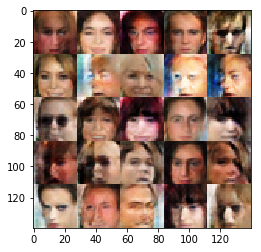

Epoch 1/1... Discriminator Loss: 1.2132... Generator Loss: 0.9340
Epoch 1/1... Discriminator Loss: 1.0783... Generator Loss: 0.9637
Epoch 1/1... Discriminator Loss: 1.1076... Generator Loss: 1.3086
Epoch 1/1... Discriminator Loss: 1.1326... Generator Loss: 0.8455
Epoch 1/1... Discriminator Loss: 1.0856... Generator Loss: 1.1162
Epoch 1/1... Discriminator Loss: 1.1270... Generator Loss: 0.9910


In [19]:
batch_size = 16
z_dim = 128
learning_rate = 0.0003
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.